<font size="6">**Homework #3: Neural Networks**</font>  
  
- ### **Part 1: PyTorch Implementation with MCE**
    - ##### Hyperparameter: 
    - ##### FOR MODEL: input_size:3; nodes:2/3/5/7/9; output_size:2; activation: multi-class cross entropy 
    - ##### FOR TRAINING: learning_rate: 0.01; optimizer: torch.optim.SGD; criterion: nn.MSELoss(); batch_size:32; epochs: varies on dataset

In [59]:
import torch
import torch.nn as nn

import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import sys
import os
from torch.utils.data import TensorDataset, DataLoader
%matplotlib inline

In [60]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
import os

%matplotlib inline

np.random.seed(42)
torch.manual_seed(0)

def read_data(name,mode):

    x_data = []
    y_data = []
    label_data = []

    base_dir = os.getcwd()
    root = base_dir
    filename = '%s/%s_%s.csv' % (root,name,mode)

    i = 0
    with open(filename,'rt') as f:
        for line in f:
            line = line.replace('\n','')
            tokens = line.split(',')
            if i > 0:
                y = int(float(tokens[0]))
                x1 = float(tokens[1])
                x2 = float(tokens[2])
                x_data.append([1.0,x1,x2])
                y_data.append([y])
                temp = [0,0]
                temp[y] = 1
                label_data.append(temp)
            i = i + 1
    xs = np.array(x_data,dtype='float32')
    ys = np.array(y_data,dtype='float32')
    labels = np.array(label_data,dtype='float32')
    return(xs,ys,labels)


#### Construct Net3 with a single hidden layer using linear function
##### We used tanh as our activation function. To add a bias term, we set bias=True in the nn.Linear module.

In [61]:
class net3(nn.Module):
    def __init__(self,input_size,nodes,output_size):
        super(net3,self).__init__()
        #we use linear calculation from input to hidden layer, with bias
        self.l1 = nn.Linear(input_size,nodes,bias=True)
        #we use tanh function as our activation function
        self.activation = nn.Tanh()
        #we use linear calculation from hidden layer to output layer, with bias
        self.output_layer = nn.Linear(nodes, output_size, bias=True)

    def forward(self,x):
        #Hidden Layer with k nodes
        x = self.l1(x)
        #Activation Function
        x = self.activation(x)
        #Output Layer
        x = self.output_layer(x)
        return x


##### To train our model, we defined our loss function as multi-class cross entropy, and adopted gradient descent as our training approach. We keep track of training loss and validation loss for every epoch for visualization.

In [62]:
def train_model(name, model, learning_rate=0.01, epochs=100):
    # Read training data
    x_train, y_train, _ = read_data(name, 'train')
    x_val, y_val, _ = read_data(name, 'valid')

    # Convert to PyTorch tensors
    x_train = torch.tensor(x_train, dtype=torch.float32)
    x_val = torch.tensor(x_val, dtype=torch.float32)
    y_train = torch.tensor(y_train, dtype=torch.long).squeeze()
    y_val = torch.tensor(y_val, dtype=torch.long).squeeze() 

    train_dataset = TensorDataset(x_train, y_train)
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

    val_dataset = TensorDataset(x_val, y_val)
    val_loader = DataLoader(val_dataset, batch_size=32)

    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
    # Initialize lists to store loss history
    train_losses = []
    val_losses = []

    # Training loop
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        for x, y in train_loader:
            optimizer.zero_grad()
            predictions = model(x)
            loss = criterion(predictions, y)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()

        # Validation loop
        model.eval()
        epoch_val_loss = 0
        with torch.no_grad():
            for x, y in val_loader:
                output = model(x)
                val_loss = criterion(output, y)
                epoch_val_loss += val_loss.item()

        # Calculate average losses
        avg_train_loss = epoch_loss / len(train_loader.dataset)
        avg_val_loss = epoch_val_loss / len(val_loader.dataset)
        # Store the losses
        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)

        # Print training progress
        # if (epoch + 1) % 50 == 0:
        #     print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

    return model, train_losses, val_losses

##### To evaluate our model, we calculate and print the accuracy on test dataset

In [63]:
def evaluate_model(name, model):
    x_test, y_test, _ = read_data(name, 'test')

    # Convert to PyTorch tensors
    x_test = torch.tensor(x_test, dtype=torch.float32)
    y_test = torch.tensor(y_test, dtype=torch.long).squeeze()
    test_dataset = TensorDataset(x_test, y_test)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)

    # Initialize counters
    correct = 0
    total = 0

    # Set model to evaluation mode
    model.eval()
    with torch.no_grad():
        for x,y in test_loader:
            predictions = model(x)
            predicted_classes = predictions.argmax(dim=1)  # Get the predicted class indices
            correct += (predicted_classes == y).sum().item()
            total += y.size(0)

    accuracy = correct / total
    print(f"Test Accuracy: {accuracy:.4f}")
    return accuracy

##### Here is the drawing function for result visualization using the test data,setting decision boundaries and display the dataset

In [64]:
def draw_example(nodes, name, model):
    x_train, y_train, label_train = read_data(name, 'train')
    x_test, y_test, label_test = read_data(name, 'test')

    fig, ax = plt.subplots(figsize=(6, 6))

    h = 0.05  # step size in the mesh
    cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA'])
    cmap_bold = ListedColormap(['#FF0000', '#00FF00'])

    # Define grid range, set the decision boundary
    x_min, x_max = x_train[:, 1].min() - 1, x_train[:, 1].max() + 1
    y_min, y_max = x_train[:, 2].min() - 1, x_train[:, 2].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    # Prepare grid data for predictions
    grid_data = np.c_[xx.ravel(), yy.ravel()]
    grid_data = np.hstack((np.ones((grid_data.shape[0], 1)), grid_data))  # Add bias term
    grid_tensor = torch.tensor(grid_data, dtype=torch.float32)

    # Get predictions for the entire grid
    model.eval()
    with torch.no_grad():
        preds = model(grid_tensor)  # Shape: (num_points, num_classes)
        Z = preds.argmax(dim=1).numpy()  # Get class predictions

    # Reshape predictions to match the grid
    Z = Z.reshape(xx.shape)

    # Plot decision boundary and test data
    ax.pcolormesh(xx, yy, Z, cmap=cmap_light, shading='auto')
    ax.scatter(x_test[:, 1], x_test[:, 2], c=y_test[:, 0], cmap=cmap_bold, edgecolor='k', s=20)
    plt.show()

##### Here is the drawing function to plot the learning curves for training and validation loss as a function of training epochs

In [65]:
def plot_learning_curves(train_losses,val_losses,epochs,name):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f"Learning Curves {name}")
    plt.legend()
    plt.grid(True)
    plt.show()

### **Dataset 1: xor**
##### Hyperparameter: Hidden layer with k=2/3/5/7/9 nodes, learning rate=0.01, epochs=1000

In [66]:
name = 'xor'
learning_rate = 0.01
epochs =1000


Training with k=2
Test Accuracy: 0.6900


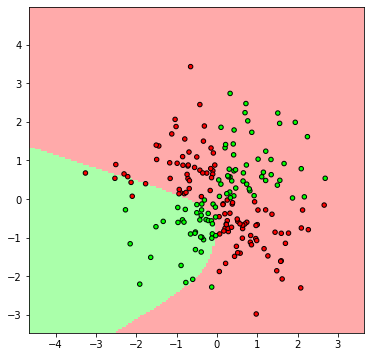

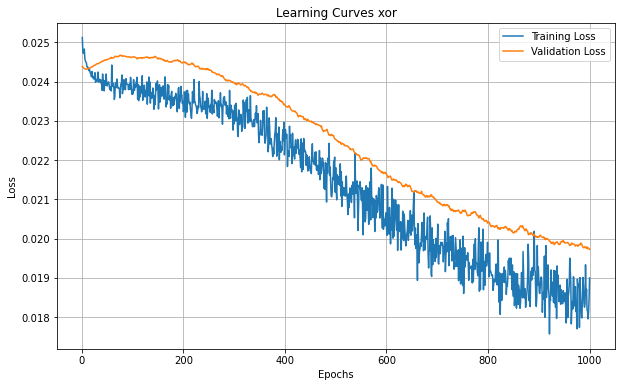


Training with k=3
Test Accuracy: 0.8400


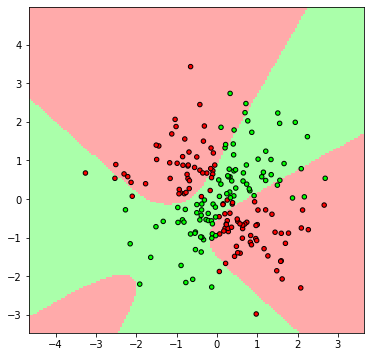

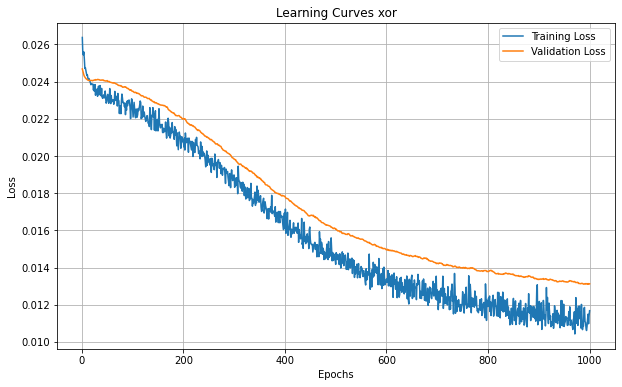


Training with k=5
Test Accuracy: 0.9050


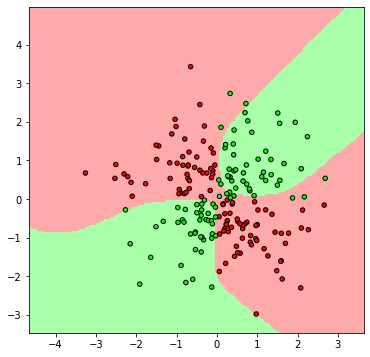

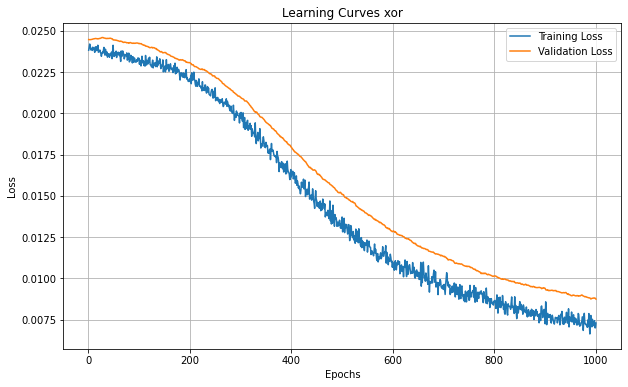


Training with k=7
Test Accuracy: 0.9050


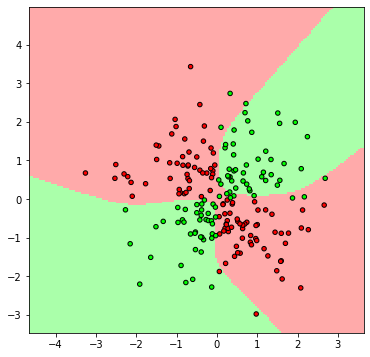

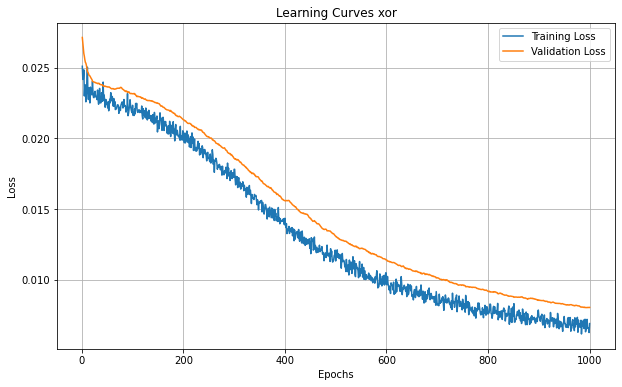


Training with k=9
Test Accuracy: 0.9250


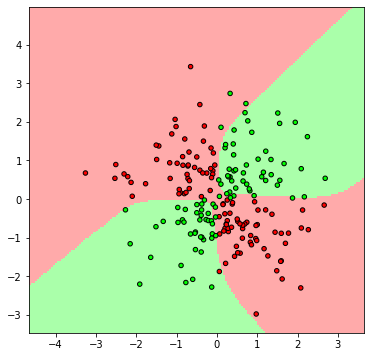

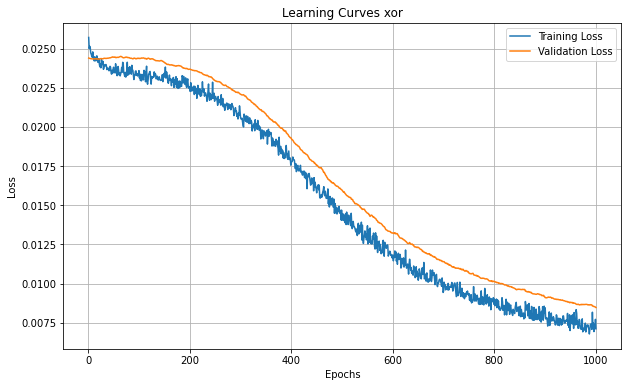

In [67]:
for k in [2,3,5,7,9]:
    print(f"\nTraining with k={k}")
    model = net3(input_size=3,nodes=k,output_size=2)
    trained_model, train_losses, val_losses = train_model(name=name, model=model, learning_rate=learning_rate, epochs=epochs)
    test_acc = evaluate_model(name,trained_model)
    draw_example(k,name,model=trained_model)
    plot_learning_curves(train_losses,val_losses,epochs,name)

### Thoughts on the choice of optimal k number
#####   For xor dataset, k=9 return the highest test accuracy which is much higher when k=2/3/5/7. For small k, the hidden layer might not have sufficient neurons to fully model the XOR function’s decision boundaries. This could lead to underfitting, where the network lacks the representational power to perfectly separate the classes.
##### For k=9, the hidden layer likely has enough neurons to fully capture the XOR function’s complexity. Once the network reaches this sufficient capacity, increasing the number of neurons further (from 7 to 9) may not provide additional accuracy gains because the problem doesn’t require more capacity than that to achieve the highest accuracy.

### **Dataset 2: center_surround**
##### Hyperparameter: Hidden layer with k=2/3/5/7/9 nodes, learning rate=0.01, epochs=1000

In [68]:
name = 'center_surround'
learning_rate = 0.01
epochs =1000


Training with k=2
Test Accuracy: 0.7000


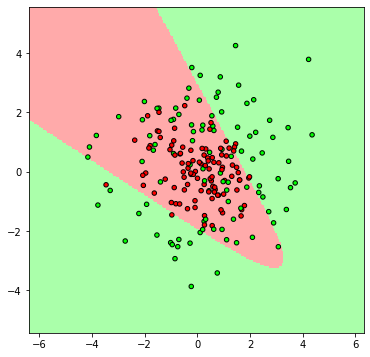

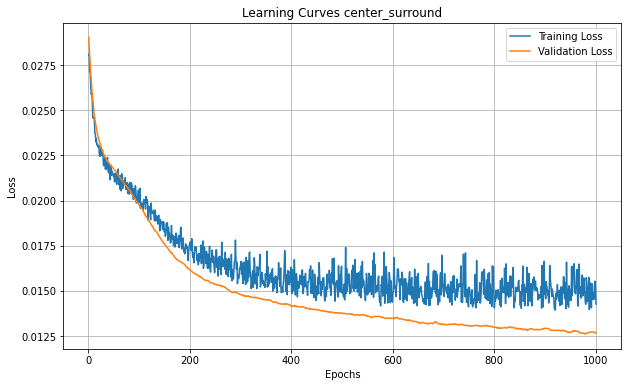


Training with k=3
Test Accuracy: 0.7550


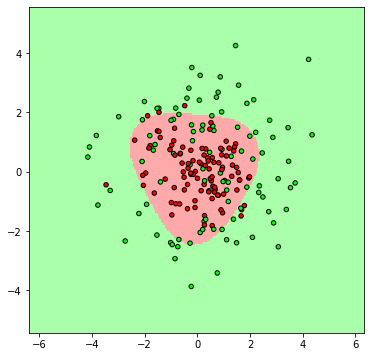

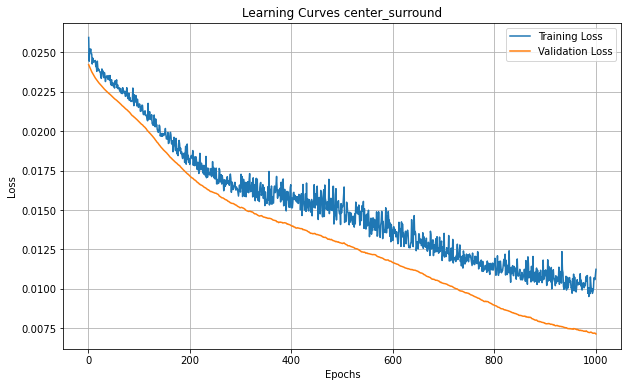


Training with k=5
Test Accuracy: 0.7750


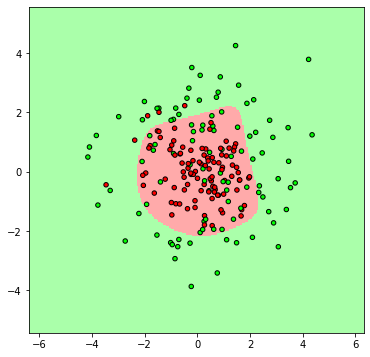

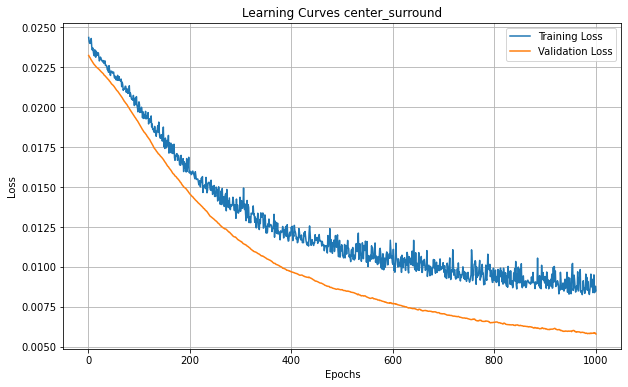


Training with k=7
Test Accuracy: 0.7650


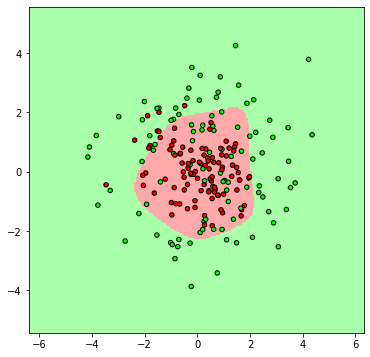

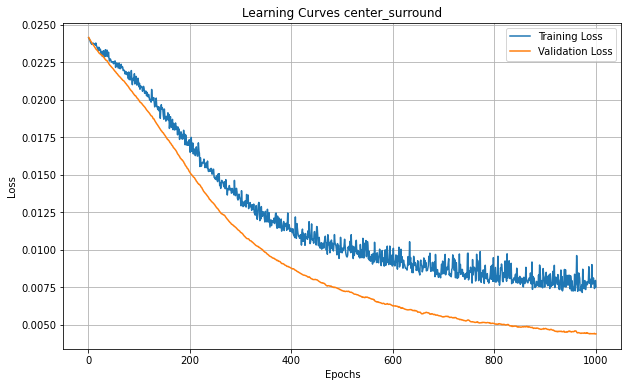


Training with k=9
Test Accuracy: 0.7650


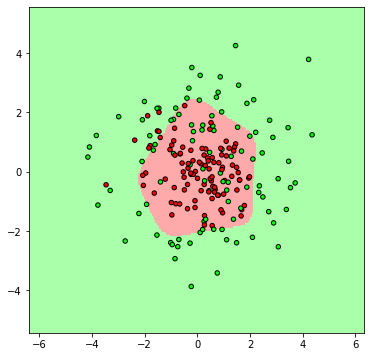

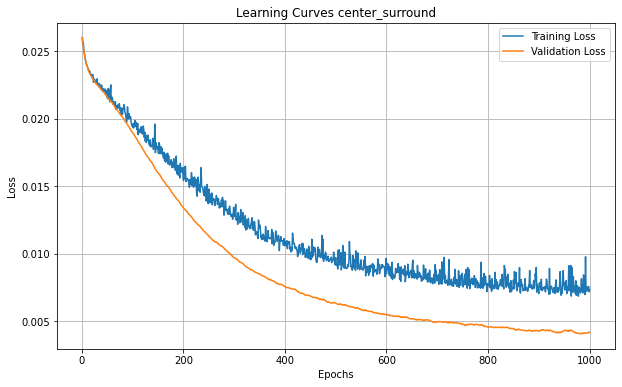

In [69]:
for k in [2,3,5,7,9]:
    print(f"\nTraining with k={k}")
    model = net3(input_size=3,nodes=k,output_size=2)
    trained_model, train_losses, val_losses = train_model(name=name, model=model, learning_rate=learning_rate, epochs=epochs)
    test_acc = evaluate_model(name,trained_model)
    draw_example(k,name,model=trained_model)
    plot_learning_curves(train_losses,val_losses,epochs,name)

### Thoughts on the choice of optimal k number
##### The center surround dataset seems to have a more complex, non-linear decision boundary. In this case, increasing the number of hidden layer nodes (k) improves the performance, and the number of 9 nodes provide the best performance.
##### When k is small (e.g.k=2, k=3 or k=5), the network doesn’t have enough neurons to capture the intricate non-linear boundaries. The decision regions will be simpler, leading to misclassifications.

### **Dataset 3: two_gaussians**
##### Hyperparameter: Hidden layer with k=2/3/5/7/9 nodes, learning rate=0.01, epochs=100

In [70]:
name = 'two_gaussians'
learning_rate = 0.01
epochs =100


Training with k=2
Test Accuracy: 0.9200


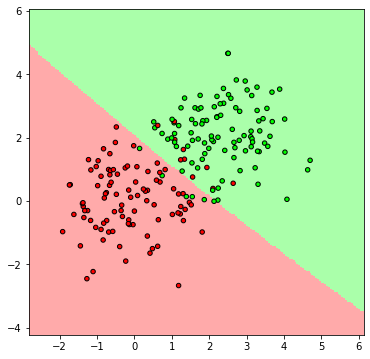

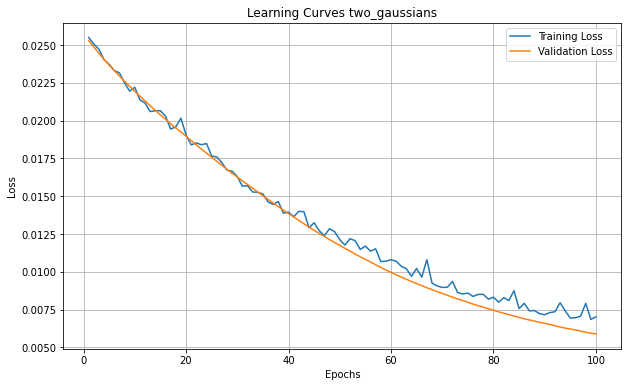


Training with k=3
Test Accuracy: 0.9050


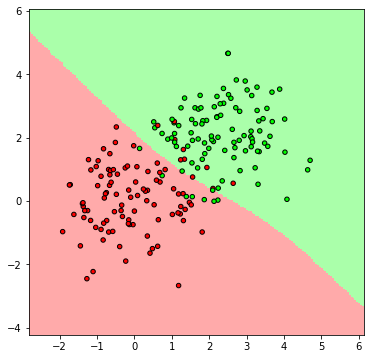

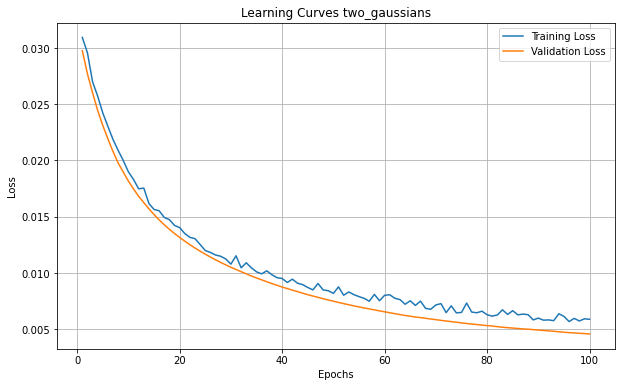


Training with k=5
Test Accuracy: 0.9250


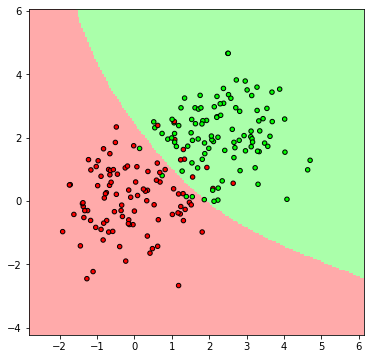

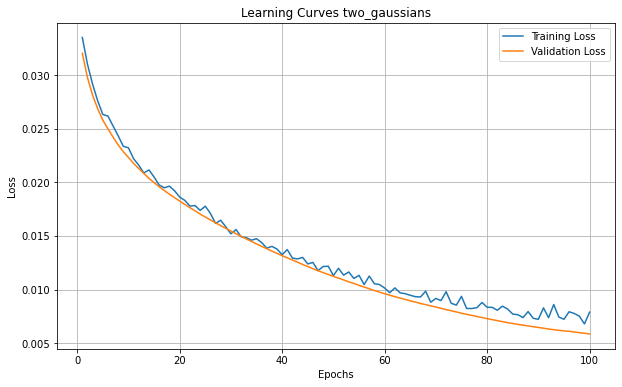


Training with k=7
Test Accuracy: 0.9200


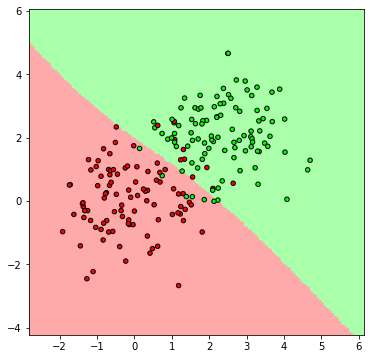

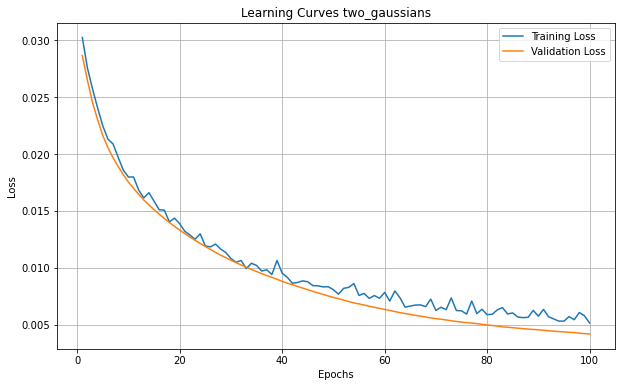


Training with k=9
Test Accuracy: 0.9050


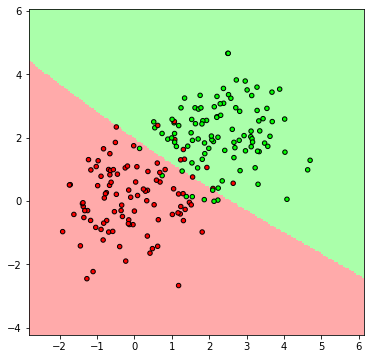

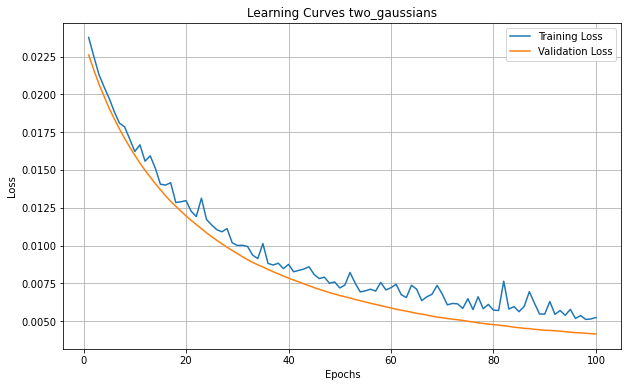

In [71]:
for k in [2,3,5,7,9]:
    print(f"\nTraining with k={k}")
    model = net3(input_size=3,nodes=k,output_size=2)
    trained_model, train_losses, val_losses = train_model(name=name, model=model, learning_rate=learning_rate, epochs=epochs)
    test_acc = evaluate_model(name,trained_model)
    draw_example(k,name,model=trained_model)
    plot_learning_curves(train_losses,val_losses,epochs,name)

### Thoughts on the choice of optimal k number
##### The number of 5 nodes appears to be optimal. The two gaussian dataset appears to have a linear or near-linear decision boundary separating the two classes. The data distribution suggests that a linear decision boundary is sufficient to separate the two classes effectively. When the hidden layer has fewer nodes (e.g.k=3), the model’s capacity is limited, encouraging it to find simpler, more generalizable patterns, which aligns well with this dataset’s linear structure.
##### For this dataset, a complex boundary with more hidden nodes is unnecessary and might cause the model to overfit noise in the data, leading to worse generalization on the test set.

### **Dataset 4: spiral**
##### Hyperparameter: Hidden layer with k=2/3/5/7/9 nodes, learning rate=0.01, epochs=1000

In [72]:
name = 'spiral'
learning_rate = 0.01
epochs =1000


Training with k=2
Test Accuracy: 0.7200


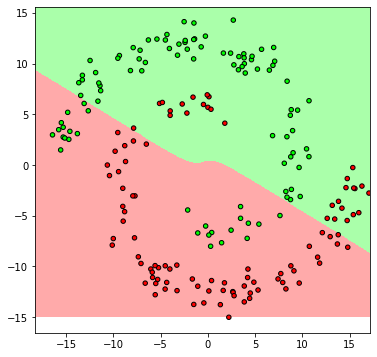

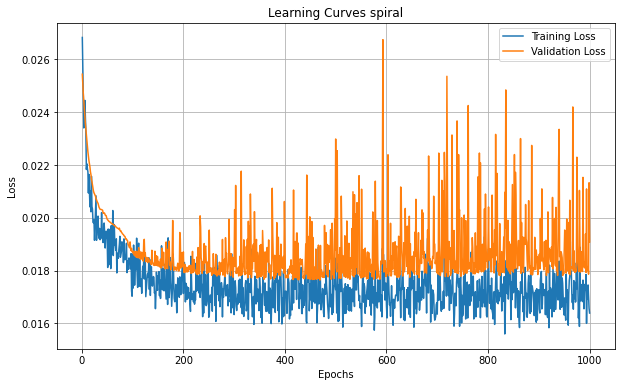


Training with k=3
Test Accuracy: 0.8050


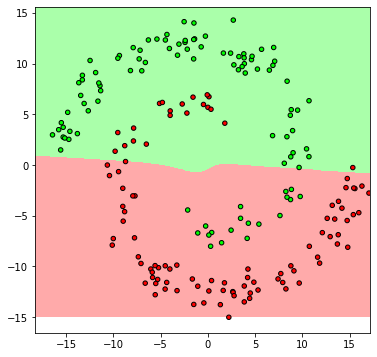

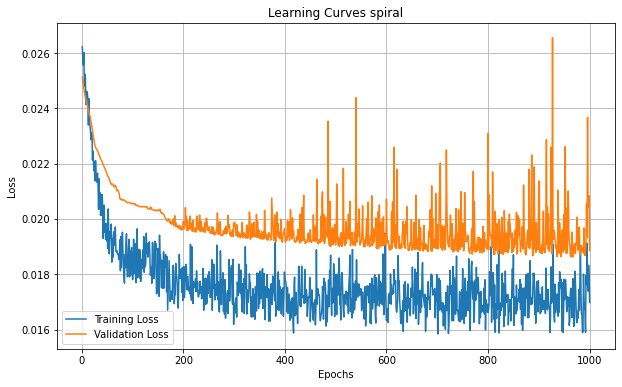


Training with k=5
Test Accuracy: 0.9450


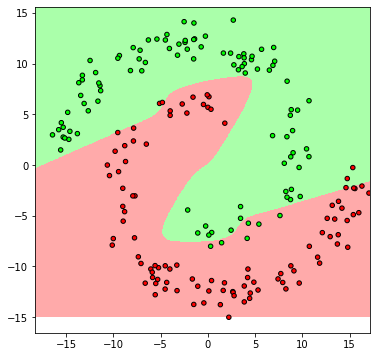

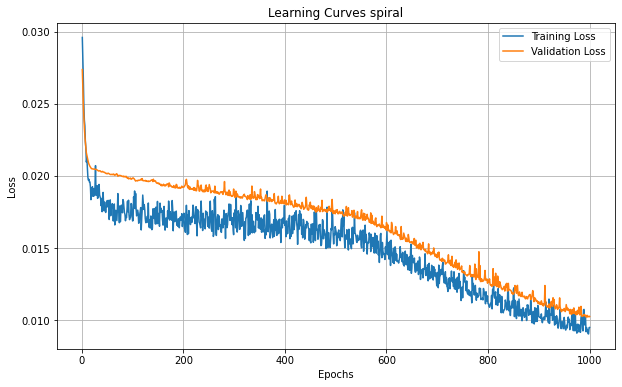


Training with k=7
Test Accuracy: 0.9650


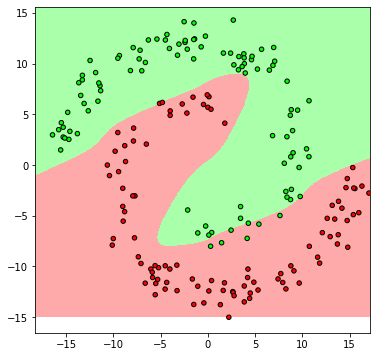

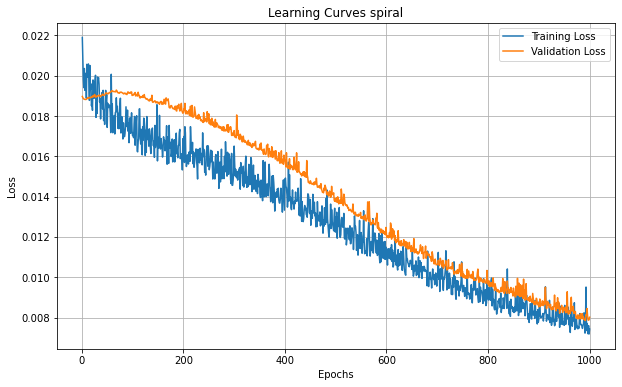


Training with k=9
Test Accuracy: 0.9550


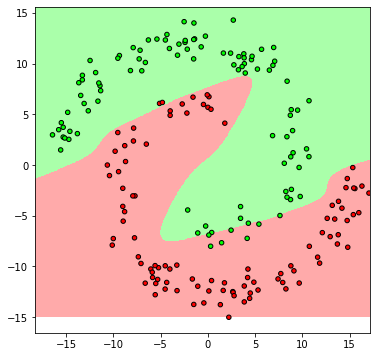

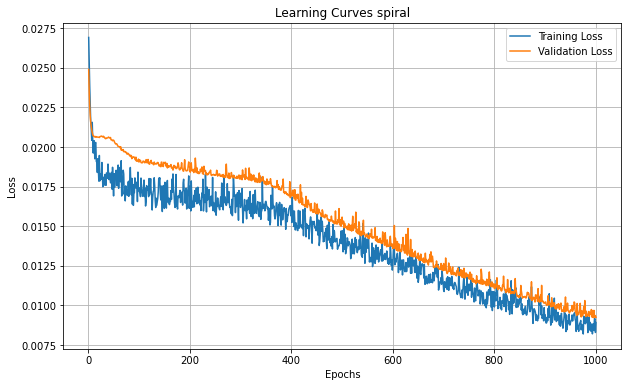

In [73]:
for k in [2,3,5,7,9]:
    print(f"\nTraining with k={k}")
    model = net3(input_size=3,nodes=k,output_size=2)
    trained_model, train_losses, val_losses = train_model(name=name, model=model, learning_rate=learning_rate, epochs=epochs)
    test_acc = evaluate_model(name,trained_model)
    draw_example(k,name,model=trained_model)
    plot_learning_curves(train_losses,val_losses,epochs,name)

### Thoughts on the choice of optimal k number
##### Number of 7 is the optimal. The sqiral dataset exhibits a highly non-linear and complex decision boundary. With a larger k, the neural network has more nodes in the hidden layer, which increases its capacity to represent complex, non-linear boundaries. This allows the model to better approximate the true decision boundary.
##### With small k (e.g.3 or 5), the model lacks the representational power to capture the twists and turns of the decision boundary. It may approximate it as a simpler, smoother shape, which leads to underfitting and misclassification.

### **Part 2: PyTorch Implementation with MSE**
Hyperparameter:   
FOR MODEL: input_size:3; nodes:2/3/5/7/9; output_size:2; activation: nn.ReLU,Sigmoid  
FOR TRAINING: learning_rate: 0.01; optimizer: torch.optim.SGD; criterion: nn.MSELoss(); batch_size:32; epochs: varies on dataset

In [74]:
class net3(nn.Module):
    def __init__(self,input_size,nodes,output_size):
        super(net3,self).__init__()
        #we use linear calculation from input to hidden layer, with bias
        self.l1 = nn.Linear(input_size,nodes,bias=True)
        #we use tanh function as our activation function
        self.activation = nn.ReLU()
        #we use linear calculation from hidden layer to output layer, with bias
        self.output_layer = nn.Linear(nodes, output_size, bias=True)

    def forward(self,x):
        #Hidden Layer with k nodes
        x = self.l1(x)
        #Activation Function
        x = self.activation(x)
        #Output Layer
        x = self.output_layer(x)
        # Apply Sigmoid to scale output to [0, 1]
        x = torch.sigmoid(x) 
        return x

In [75]:
def train_model(name, model, learning_rate=0.01, epochs=100):
    # Read training data
    x_train, y_train, _ = read_data(name, 'train')
    x_val, y_val, _ = read_data(name, 'valid')

    # Convert to PyTorch tensors
    x_train = torch.tensor(x_train, dtype=torch.float32)
    x_val = torch.tensor(x_val, dtype=torch.float32)
    y_train = torch.tensor(y_train, dtype=torch.float32)
    y_val = torch.tensor(y_val, dtype=torch.float32)

    train_dataset = TensorDataset(x_train, y_train)
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

    val_dataset = TensorDataset(x_val, y_val)
    val_loader = DataLoader(val_dataset, batch_size=32)

    # Define loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
    # Initialize lists to store loss history
    train_losses = []
    val_losses = []

    # Training loop
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        for x, y in train_loader:
            optimizer.zero_grad()
            predictions = model(x)
            loss = criterion(predictions, y)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()

        # Validation loop
        model.eval()
        epoch_val_loss = 0
        with torch.no_grad():
            for x, y in val_loader:
                output = model(x)
                val_loss = criterion(output, y)
                epoch_val_loss += val_loss.item()

        # Calculate average losses
        avg_train_loss = epoch_loss / len(train_loader.dataset)
        avg_val_loss = epoch_val_loss / len(val_loader.dataset)
        # Store the losses
        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)

        # Print training progress
        # if (epoch + 1) % 50 == 0:
        #     print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

    return model, train_losses, val_losses

Add a threshold=0.5 to assign binary labels

In [76]:
def evaluate_model(name, model):
    x_test, y_test, _ = read_data(name, 'test')

    # Convert to PyTorch tensors
    x_test = torch.tensor(x_test, dtype=torch.float32)
    y_test = torch.tensor(y_test, dtype=torch.float32)
    test_dataset = TensorDataset(x_test, y_test)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)

    # Initialize counters
    correct = 0
    total = 0

    # Set model to evaluation mode
    model.eval()
    with torch.no_grad():
        for x,y in test_loader:
            # Get raw logits from the model
            output = model(x)
            
            # Apply threshold=0.5 to assign binary labels
            predicted_classes = (output >= 0.5).float()

            # Calculate accuracy
            correct += (predicted_classes == y).sum().item()
            total += y.size(0)

    accuracy = correct / total
    print(f"Test Accuracy: {accuracy:.4f}")
    return accuracy

In [77]:
def draw_example(nodes, name, model):
    x_train, y_train, label_train = read_data(name, 'train')
    x_test, y_test, label_test = read_data(name, 'test')

    fig, ax = plt.subplots(figsize=(6, 6))

    h = 0.05  # step size in the mesh
    cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA'])
    cmap_bold = ListedColormap(['#FF0000', '#00FF00'])

    # Define grid range
    x_min, x_max = x_train[:, 1].min() - 1, x_train[:, 1].max() + 1
    y_min, y_max = x_train[:, 2].min() - 1, x_train[:, 2].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    # Prepare grid data for predictions
    grid_data = np.c_[xx.ravel(), yy.ravel()]
    grid_data = np.hstack((np.ones((grid_data.shape[0], 1)), grid_data))  # Add bias term
    grid_tensor = torch.tensor(grid_data, dtype=torch.float32)

    # Get predictions for the entire grid
    model.eval()
    with torch.no_grad():
        preds = model(grid_tensor)  # Shape: (num_points, 1)
        Z = (preds >= 0.5).float()  # Threshold at 0.5 to classify as 0 or 1

    # Reshape predictions to match the grid
    Z = Z.reshape(xx.shape)

    # Plot decision boundary and test data
    ax.pcolormesh(xx, yy, Z, cmap=cmap_light, shading='auto')
    ax.scatter(x_test[:, 1], x_test[:, 2], c=y_test[:, 0], cmap=cmap_bold, edgecolor='k', s=20)
    plt.show()

In [78]:
def plot_learning_curves(train_losses,val_losses,epochs,name):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Learning Curves')
    plt.legend()
    plt.grid(True)
    plt.show()

### **Dataset 1: xor**

In [79]:
name = 'xor'
learning_rate = 0.01
epochs =1000


Training with k=2
Test Accuracy: 0.6800


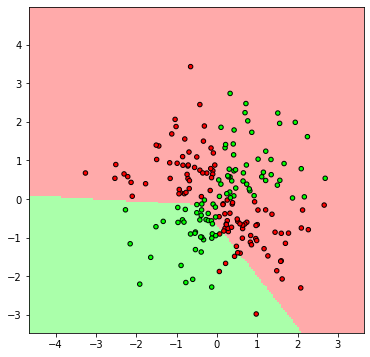

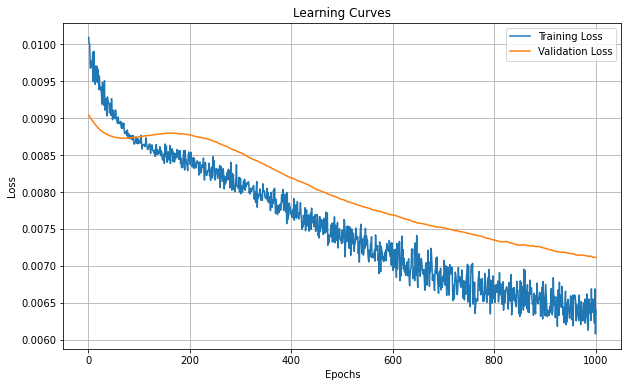


Training with k=3
Test Accuracy: 0.7800


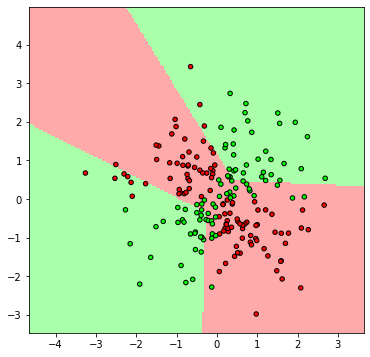

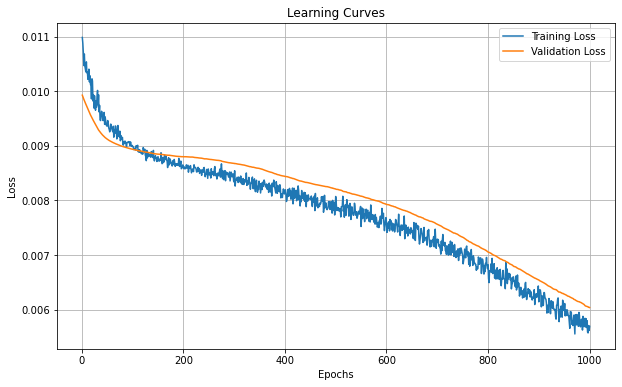


Training with k=5
Test Accuracy: 0.7050


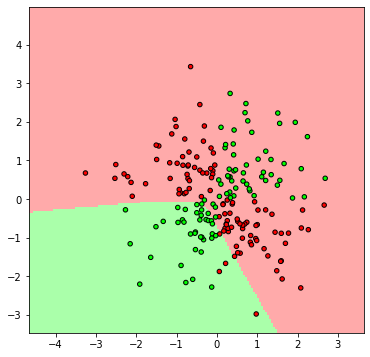

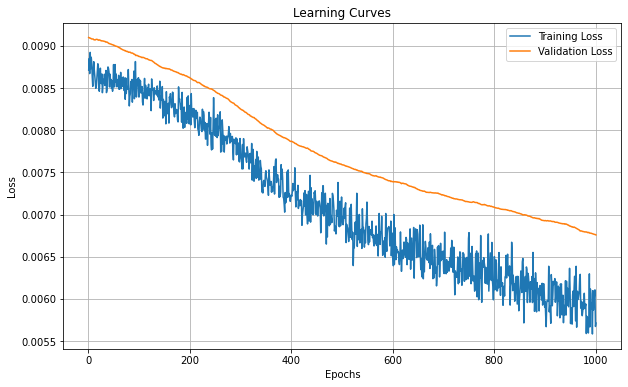


Training with k=7
Test Accuracy: 0.8450


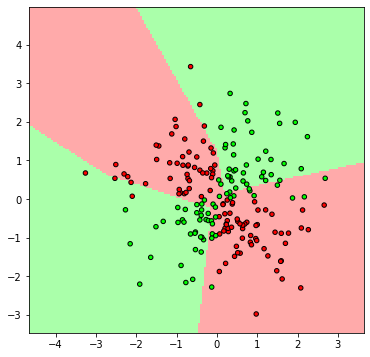

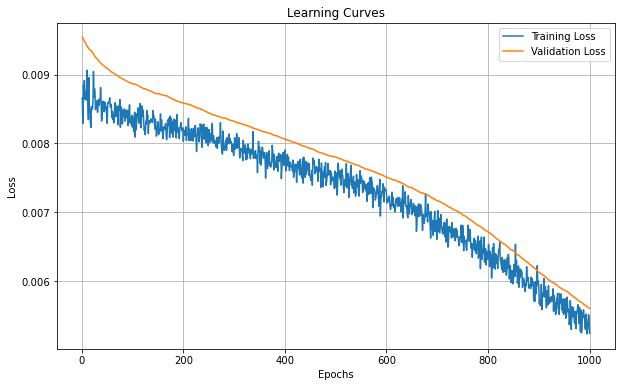


Training with k=9
Test Accuracy: 0.5950


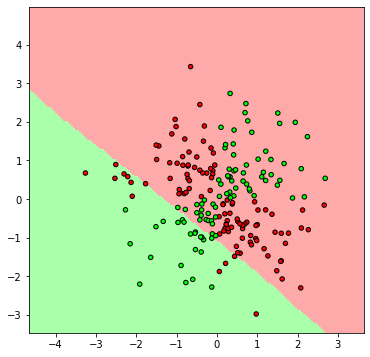

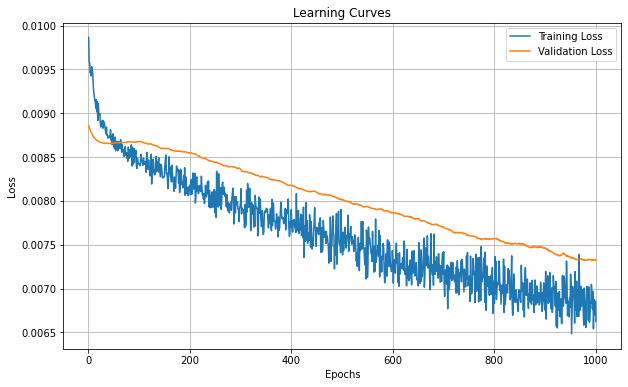

In [80]:
for k in [2,3,5,7,9]:
    print(f"\nTraining with k={k}")
    model = net3(3,k,1)
    trained_model, train_losses, val_losses = train_model(name, model, learning_rate=learning_rate, epochs=epochs)
    test_acc = evaluate_model(name,trained_model)
    draw_example(k,name,model=trained_model)
    plot_learning_curves(train_losses,val_losses,epochs,name)

### **Dataset 2: center_surround**

In [81]:
name = 'center_surround'
learning_rate = 0.01
epochs =1000


Training with k=2
Test Accuracy: 0.5800


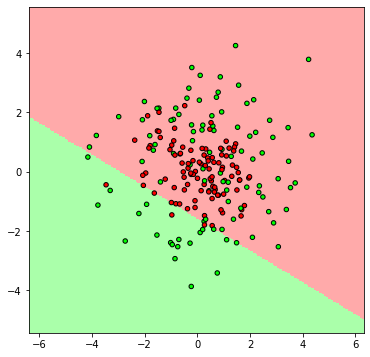

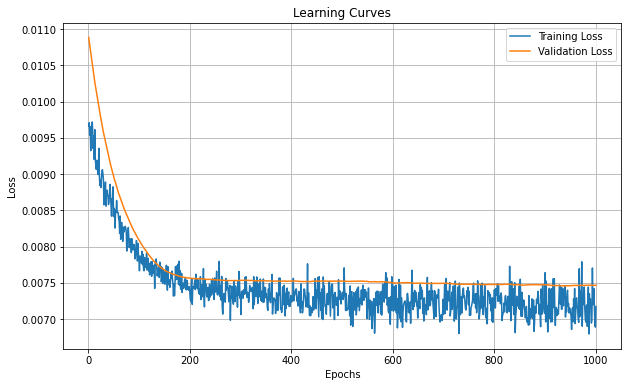


Training with k=3
Test Accuracy: 0.6900


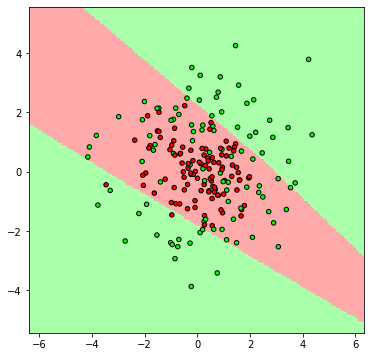

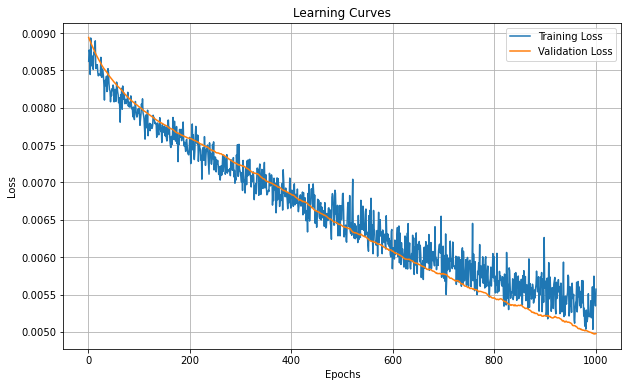


Training with k=5
Test Accuracy: 0.7700


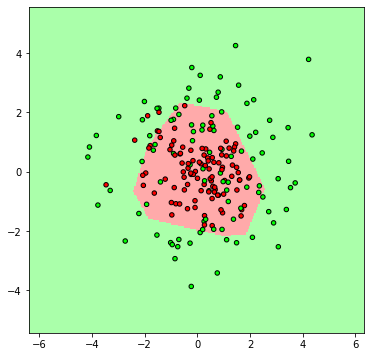

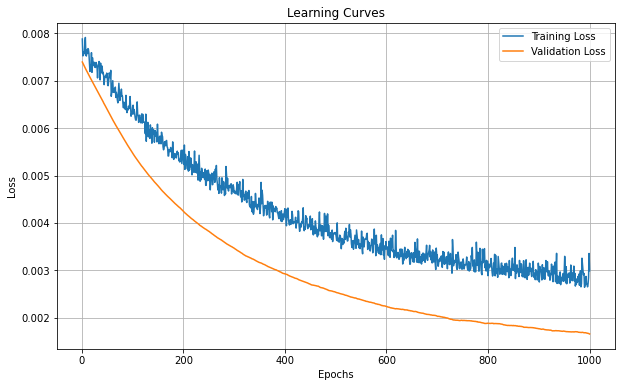


Training with k=7
Test Accuracy: 0.7650


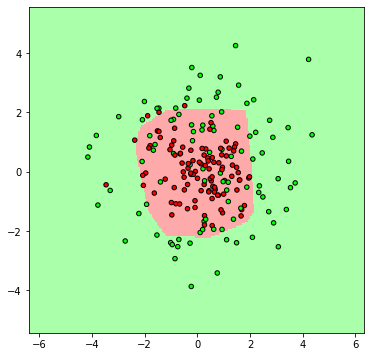

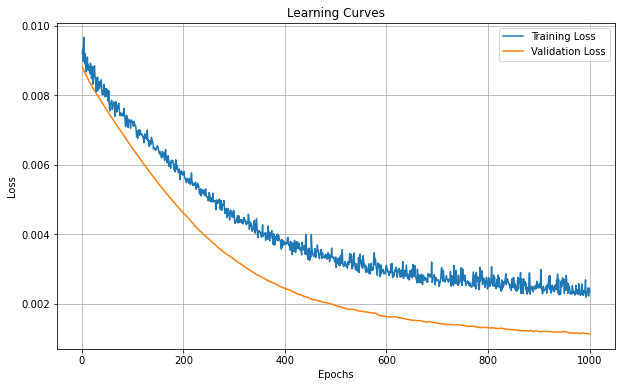


Training with k=9
Test Accuracy: 0.7650


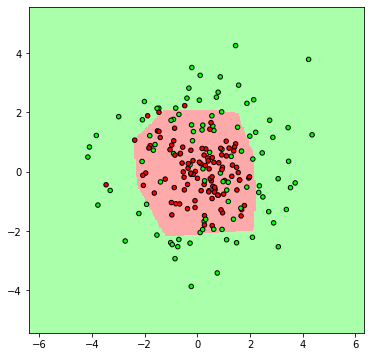

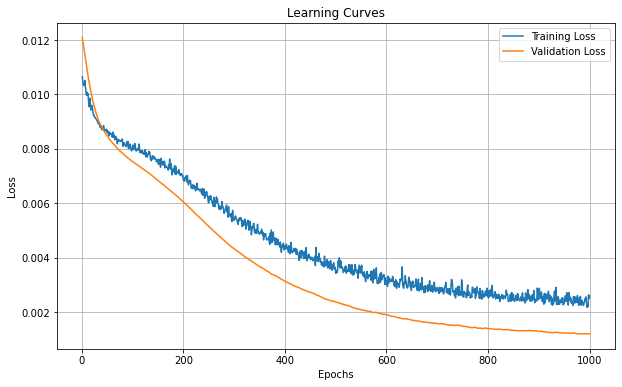

In [82]:
for k in [2,3,5,7,9]:
    print(f"\nTraining with k={k}")
    model = net3(3,k,1)
    trained_model, train_losses, val_losses = train_model(name, model, learning_rate=learning_rate, epochs=epochs)
    test_acc = evaluate_model(name,trained_model)
    draw_example(k,name,model=trained_model)
    plot_learning_curves(train_losses,val_losses,epochs,name)

### **Dataset 3: two_gaussians**

In [83]:
name = 'two_gaussians'
learning_rate = 0.01
epochs =1000


Training with k=2
Test Accuracy: 0.9150


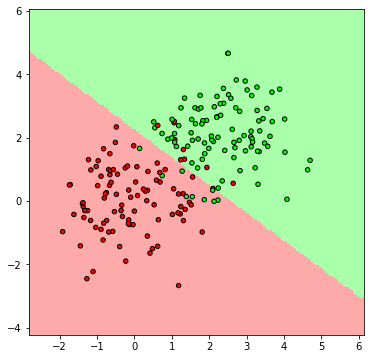

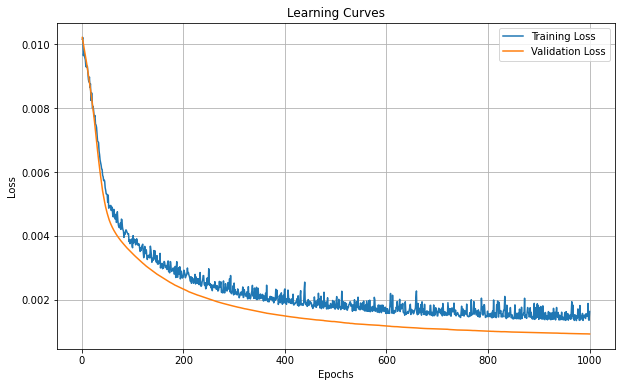


Training with k=3
Test Accuracy: 0.9150


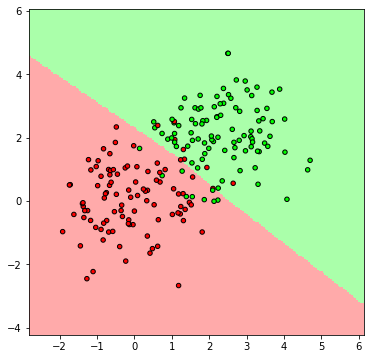

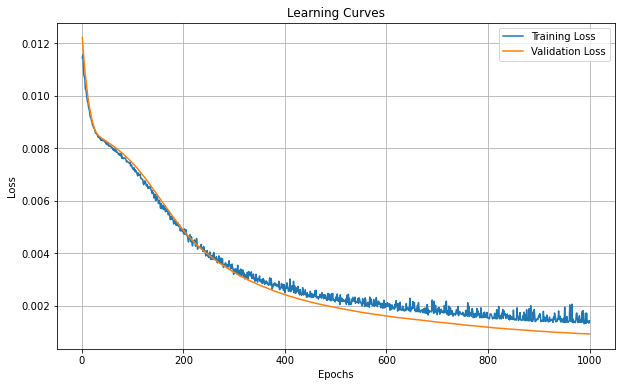


Training with k=5
Test Accuracy: 0.9150


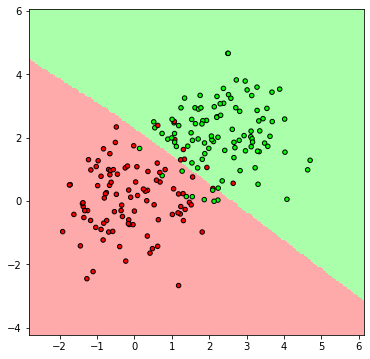

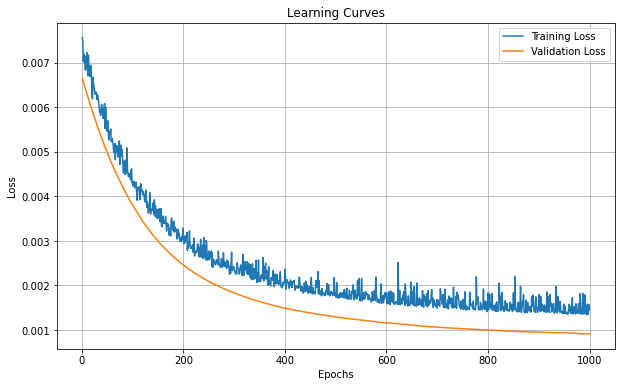


Training with k=7
Test Accuracy: 0.9100


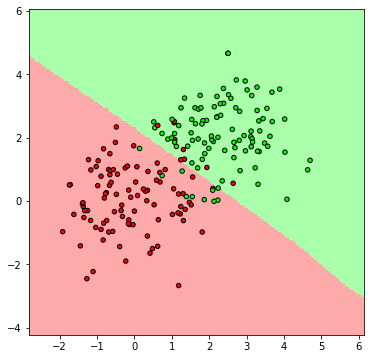

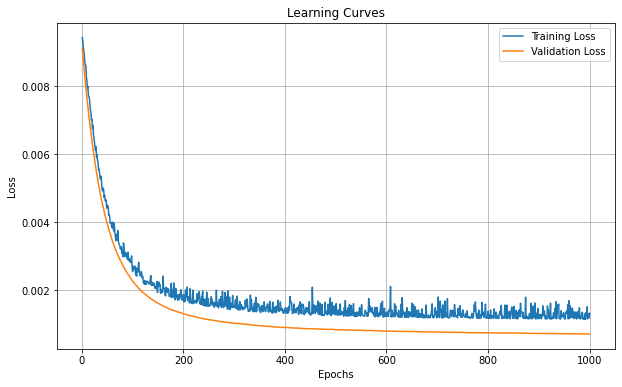


Training with k=9
Test Accuracy: 0.9100


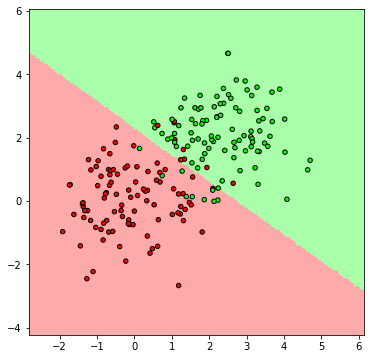

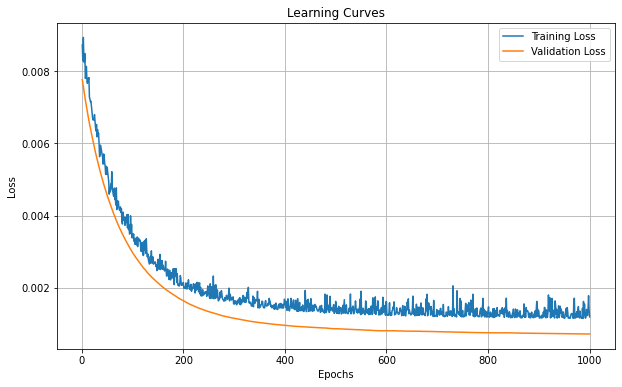

In [84]:
for k in [2,3,5,7,9]:
    print(f"\nTraining with k={k}")
    model = net3(3,k,1)
    trained_model, train_losses, val_losses = train_model(name, model, learning_rate=learning_rate, epochs=epochs)
    test_acc = evaluate_model(name,trained_model)
    draw_example(k,name,model=trained_model)
    plot_learning_curves(train_losses,val_losses,epochs,name)

### **Dataset 4: spiral**

In [85]:
name = 'spiral'
learning_rate = 0.01
epochs =1000


Training with k=2
Test Accuracy: 0.7700


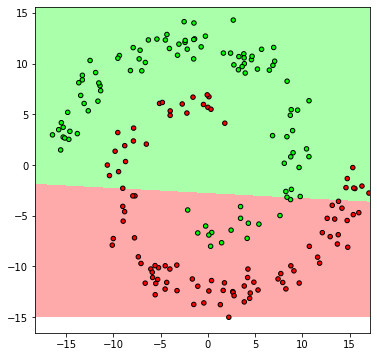

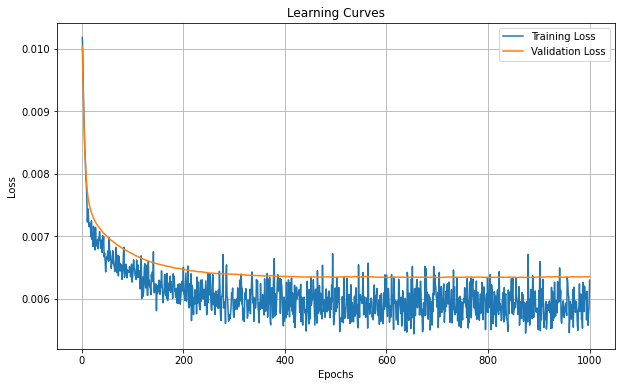


Training with k=3
Test Accuracy: 0.8000


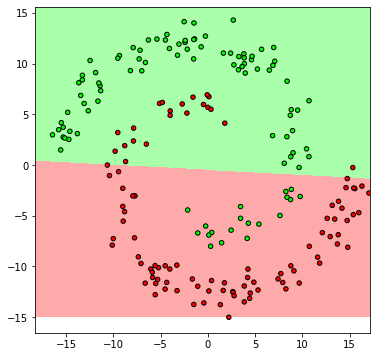

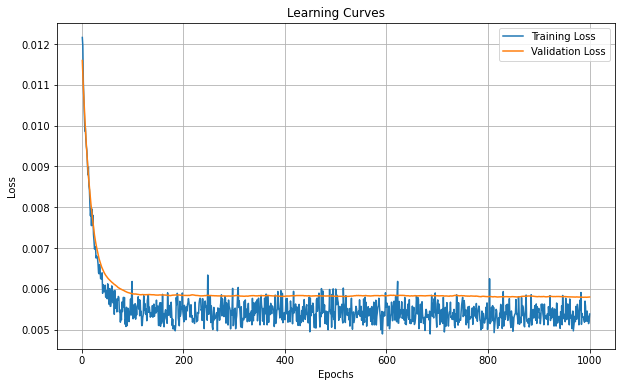


Training with k=5
Test Accuracy: 0.7950


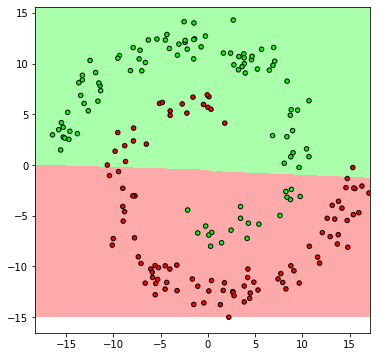

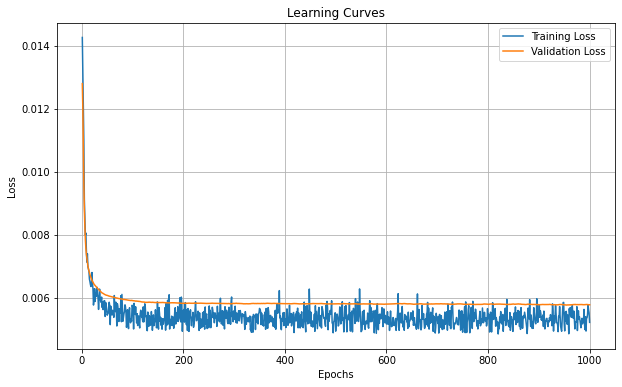


Training with k=7
Test Accuracy: 0.8200


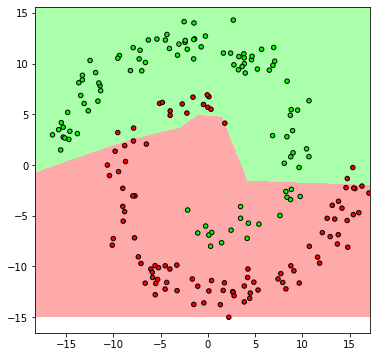

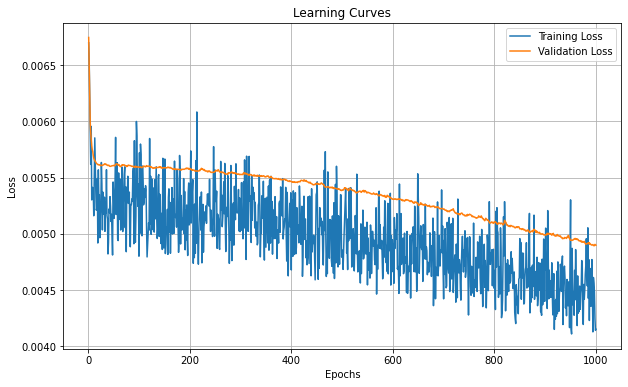


Training with k=9
Test Accuracy: 0.8450


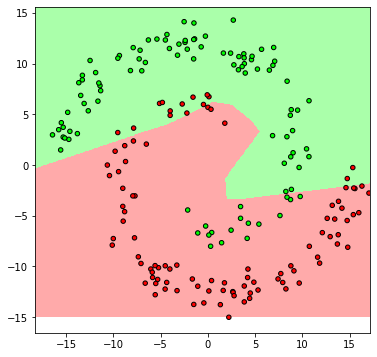

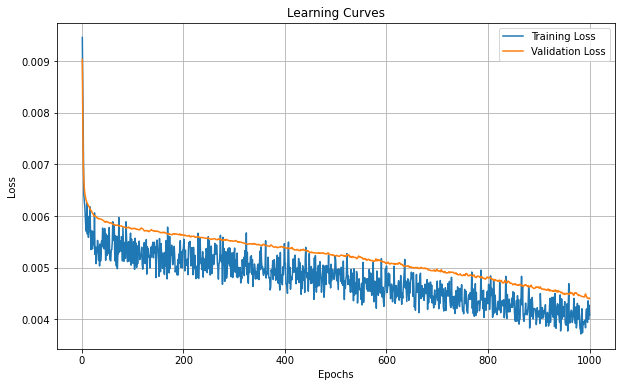

In [86]:
for k in [2,3,5,7,9]:
    print(f"\nTraining with k={k}")
    model = net3(3,k,1)
    trained_model, train_losses, val_losses = train_model(name, model, learning_rate=learning_rate, epochs=epochs)
    test_acc = evaluate_model(name,trained_model)
    draw_example(k,name,model=trained_model)
    plot_learning_curves(train_losses,val_losses,epochs,name)

Adding a sigmoid function at the output layer and set threshold=0.5 can have the following benefits:
1. Sigmoid activation transforms the output into a probability score between [0,1]. This allows us to interpret the likelihood of the positive class directly.
2. Sigmoid ensures all outputs are scaled to the range [0, 1], which is critical for consistency in binary classification.
3. Sigmoid introduces a smooth, non-linear transformation, which can help stabilize gradient updates during backpropagation compared to raw logits.

### **Part 3: Manual Gradients and Updates**
#### Hyperparameter: 
#### FOR MODEL: 
##### input_size: Variable (defined based on dataset input features)
##### hidden_size: Adjustable (e.g., 2/3/5/7/9)
##### output_size: 2
##### activation: Hidden layer uses ReLU; Output layer uses Sigmoid
##### early_stopping_patience: Default 200 epochs if not explicitly specified.
#### FOR TRAINING: 
##### learning_rate: Adjustable (based on dataset for gradient descent stability)
##### optimizer: Custom implementation (uses gradients calculated in Model.backward method)
##### criterion: Cross-Entropy (default) or Mean Squared Error (MSE)
##### batch_size: Full-batch
##### epochs: Adjustable (based on dataset and early stopping criteria)

In [ ]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
def my_draw(nodes, dataset_name, model):
    x_train, y_train, _ = read_data(dataset_name, 'train')
    x_test, y_test, _ = read_data(dataset_name, 'test')

    fig, ax = plt.subplots(figsize=(6, 6))
    h = 0.1  
    cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA', '#AAAAFF'])
    cmap_bold = ListedColormap(['#FF0000', '#00FF00', '#0000FF'])

    x_min, x_max = x_train[:, 1].min() - 1, x_train[:, 1].max() + 1
    y_min, y_max = x_train[:, 2].min() - 1, x_train[:, 2].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    Z = np.zeros([xx.shape[0], yy.shape[1]], dtype='float32')

    for i in range(xx.shape[0]):
        for j in range(yy.shape[1]):
            grid_point = np.array([[1.0, xx[i, j], yy[i, j]]], dtype='float32')
            pred = model(grid_point)  
            Z[i, j] = pred.argmax().item()  

    ax.pcolormesh(xx, yy, Z, cmap=cmap_light, shading='auto')

    scatter = ax.scatter(x_test[:, 1], x_test[:, 2], c=y_test[:, 0], cmap=cmap_bold, edgecolor='k', s=25)

    handles, labels = scatter.legend_elements()
    ax.legend(handles, ["Class 0", "Class 1", "Class 2"])

    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    plt.title(f"Decision Boundary for {dataset_name} with {nodes} hidden nodes")
    plt.xlabel("Feature 1")
    plt.ylabel("Feature 2")
    plt.show()

### **Implementation and Explanation: Simple Feed-Forward Neural Network (FFNN) with Backpropagation**

##### In this model, we’ve built a feed-forward neural network (FFNN) with a single hidden layer that’s capable of learning via backpropagation. To begin, we initialize weights and biases for both the hidden and output layers. The weight matrices are set using a scaled Gaussian distribution—np.sqrt(2. / input_size) and np.sqrt(2. / hidden_size)—to help maintain reasonable variance during the initial forward pass. Using this weight initialization strategy can prevent gradients from exploding or vanishing during the training process.

##### The model uses a ReLU (Rectified Linear Unit) activation function in the hidden layer. ReLU is chosen because it introduces non-linearity while also allowing gradient flow only where inputs are positive, which often helps mitigate the vanishing gradient problem in deep networks. For the output layer, we use the sigmoid activation function since it’s common in binary classification tasks, squeezing output values between 0 and 1. This can be particularly useful when we interpret the output as a probability.

##### In the forward pass, we calculate the input to each layer and apply these activation functions. First, the inputs are passed to the hidden layer, then activated with ReLU, and finally passed to the output layer, where we apply the sigmoid to yield the final prediction.

##### During backpropagation, we calculate the gradient of the loss with respect to the network's parameters to update the weights and biases. Starting with the output layer, we compute the error between predicted and true values. This error propagates backward through the network, adjusting each layer based on how much it contributes to the final error. For the hidden layer, we multiply by the derivative of the ReLU function, effectively "turning off" gradients where ReLU outputs were zero. This selective gradient propagation is a key feature of ReLU, helping to maintain useful gradients where they are most needed.

In [ ]:
import numpy as np

np.random.seed(23)

# Prepare target labels as one-hot encoded
def one_hot_encode(y, num_classes):
    one_hot = np.zeros((y.size, num_classes))
    one_hot[np.arange(y.size), y.astype(int).flatten()] = 1
    return one_hot

# Assuming the function read_data is already defined to load the datasets
# Load data (example for one dataset, 'spiral')


# Define the FFNN model with a single hidden layer
class FFNN:
    def __init__(self, input_size, hidden_size, output_size, early_stopping_patience=200):
        np.random.seed(23)
        # Initialize weights and biases
        self.W1 = np.random.randn(input_size, hidden_size) * np.sqrt(2. / input_size)
        self.b1 = np.zeros((1, hidden_size))
        self.W2 = np.random.randn(hidden_size, output_size) * np.sqrt(2. / hidden_size)
        self.b2 = np.zeros((1, output_size))
        self.early_stopping_patience = early_stopping_patience

    def sigmoid(self, z):
        return 1 / (1 + np.exp(-z))
    
    def activation(self, z):
        # ReLU activation for the hidden layer
        return np.maximum(0, z)
    
    def forward(self, x):
        # Forward pass
        self.z1 = x.dot(self.W1) + self.b1
        self.a1 = self.activation(self.z1)
        self.z2 = self.a1.dot(self.W2) + self.b2
        self.output = self.sigmoid(self.z2)
        return self.output

    def backward(self, x, y_true, y_pred, learning_rate):
        # Calculate the gradient of the output layer with respect to sigmoid loss
        m = y_true.shape[0]  # number of examples
        dz2 = (y_pred - y_true) / m  # derivative of loss with respect to z2 for sigmoid output
        dW2 = self.a1.T.dot(dz2)
        db2 = np.sum(dz2, axis=0, keepdims=True)

        # Backpropagation to the hidden layer
        da1 = dz2.dot(self.W2.T)
        dz1 = da1 * (self.z1 > 0)  # derivative of ReLU

        dW1 = x.T.dot(dz1)
        db1 = np.sum(dz1, axis=0, keepdims=True)

        # Update weights and biases
        self.W1 -= learning_rate * dW1
        self.b1 -= learning_rate * db1
        self.W2 -= learning_rate * dW2
        self.b2 -= learning_rate * db2  


    # Implement __call__ method to make the model callable
    def __call__(self, x):
        return self.forward(x)

    def compute_loss(self, y_true, y_pred):
        loss = 'MSE'
        if loss == 'Cross-entropy':
        # # Cross-entropy loss
            m = y_true.shape[0]
            log_likelihood = -np.log(y_pred[range(m), y_true.argmax(axis=1)] + 1e-10)
            return np.sum(log_likelihood) / m
        elif loss == 'MSE':
        # MSE
        # Mean Squared Error Loss
            m = y_true.shape[0]
            mse = np.mean((y_true - y_pred) ** 2)
            return mse
        
    def train(self, x_train, y_train, epochs, x_test, y_test, learning_rate):
        train_losses = []
        val_losses = []
        early_stopping_patience = self.early_stopping_patience
        last_val_loss = float('inf')
        patience_counter = 0
        for epoch in range(epochs):
            # Forward pass and loss for validation set
            y_pred_val = self.forward(x_test)
            val_loss = self.compute_loss(y_test, y_pred_val)
            val_losses.append(val_loss)
            
            # Forward propagation
            y_pred = self.forward(x_train)
            train_loss = self.compute_loss(y_train, y_pred)
            train_losses.append(train_loss)
            # print(y_pred[:3])
            # # Compute loss
            # print(y_train[:3])
            # Early stopping check
            if val_loss < last_val_loss:
                patience_counter = 0  # Reset patience counter
            else:
                patience_counter += 1
                if patience_counter >= early_stopping_patience:
                    print(f"Early stopping at epoch {epoch} with validation loss: {val_loss:.4f}")
                    break
            last_val_loss = val_loss

            # Backward propagation and update weights
            self.backward(x_train, y_train, y_pred, learning_rate)
            # if epoch % 100 == 0:
            #     print(f"Epoch {epoch}, Loss: {loss:.4f}")
        return train_losses, val_losses

##### To evaluate our model, we define an Evaluator class to calculate and print the accuracy on test dataset

In [ ]:

class Evaluator:
    def __init__(self, model):
        self.model = model

    def evaluate(self, x_test, y_test):
        # Forward pass to get predictions
        y_pred = self.model(x_test)
        # Get predicted classes by taking the argmax of the output
        y_pred_classes = np.argmax(y_pred, axis=1)
        # Get true classes by taking the argmax of one-hot encoded y_test
        y_true_classes = np.argmax(y_test, axis=1)
        # Calculate accuracy
        accuracy = np.mean(y_pred_classes == y_true_classes)
        return accuracy


##### To make the learning curve appear smoother, we sample every 10 points

In [ ]:
def plot_learning_curves(train_losses,val_losses,epochs):
    plt.figure(figsize=(10, 6))
    epochs = min(len(train_losses), epochs)
    sampled_epochs = range(1, min(len(train_losses), epochs) + 1, 10)
    sampled_train_losses = train_losses[::10]
    sampled_val_losses = val_losses[::10]
    plt.plot(sampled_epochs, sampled_train_losses, label='Training Loss')
    plt.plot(sampled_epochs, sampled_val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Learning Curves')
    plt.legend()
    plt.grid(True)
    plt.show()

### **XOR Dataset**


Training with k=2 hidden nodes
Early stopping at epoch 699 with validation loss: 0.2604
Model accuracy on test set: 52.50%


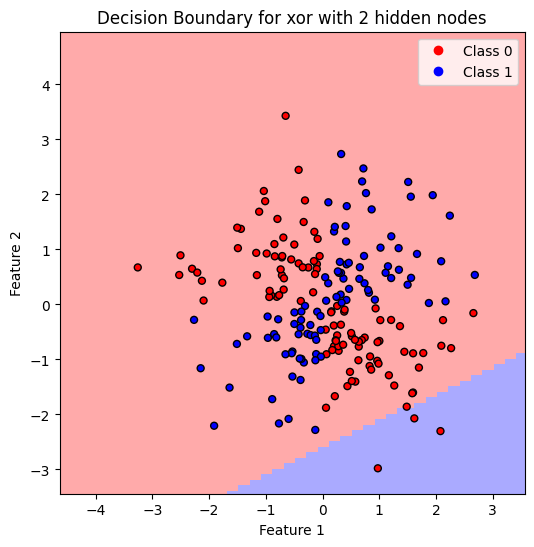

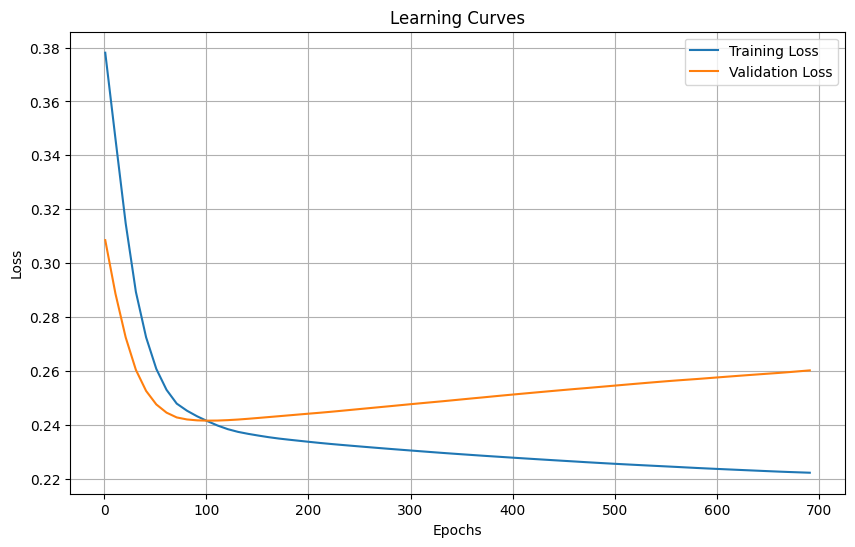


Training with k=3 hidden nodes
Early stopping at epoch 917 with validation loss: 0.2993
Model accuracy on test set: 64.50%


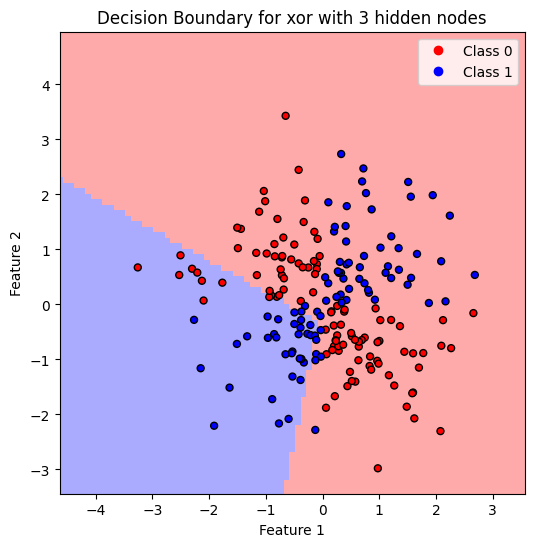

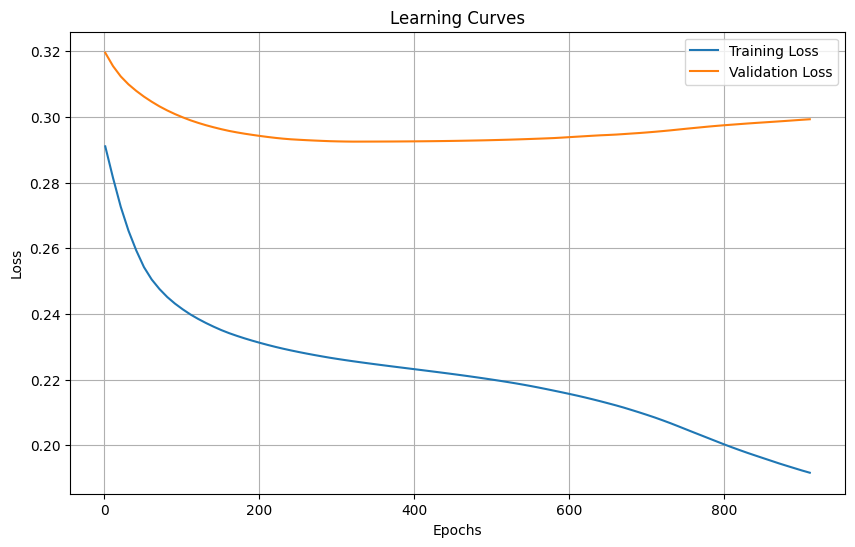


Training with k=5 hidden nodes
Early stopping at epoch 671 with validation loss: 0.3345
Model accuracy on test set: 85.50%


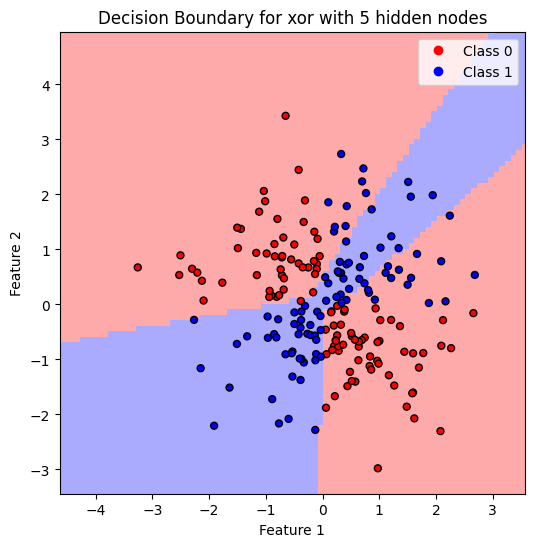

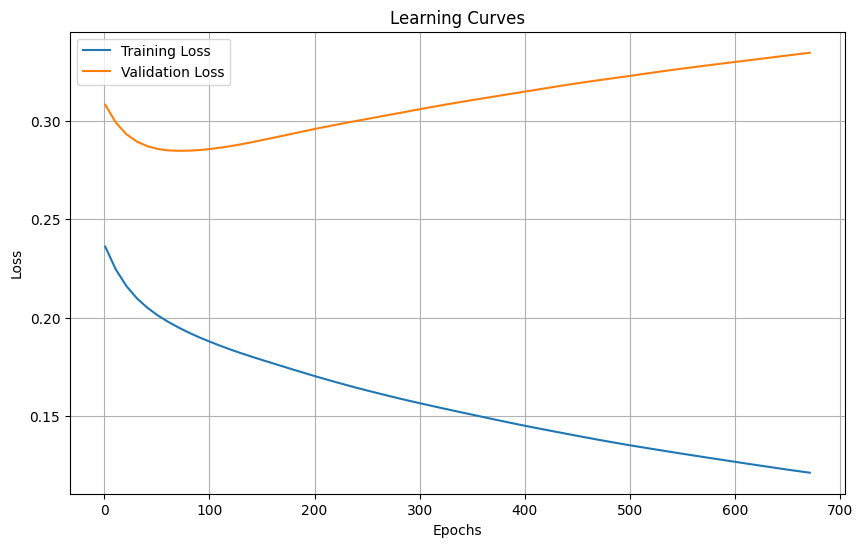


Training with k=7 hidden nodes
Early stopping at epoch 696 with validation loss: 0.3532
Model accuracy on test set: 91.50%


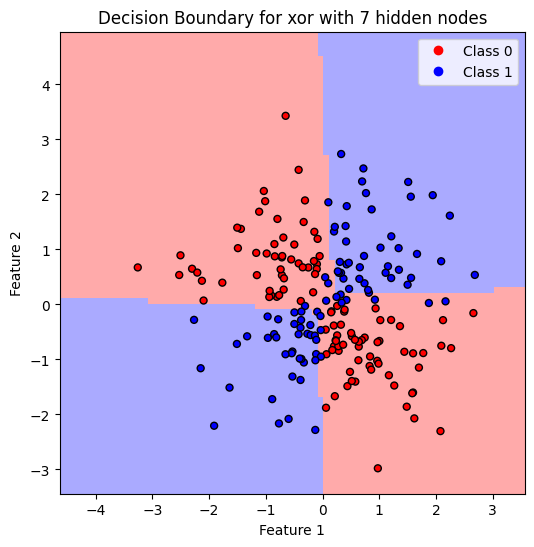

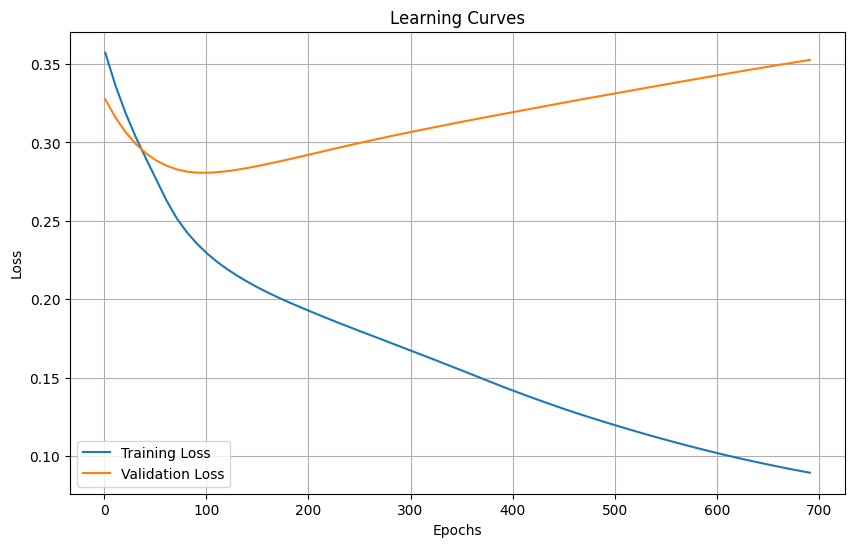


Training with k=9 hidden nodes
Early stopping at epoch 845 with validation loss: 0.3375
Model accuracy on test set: 87.00%


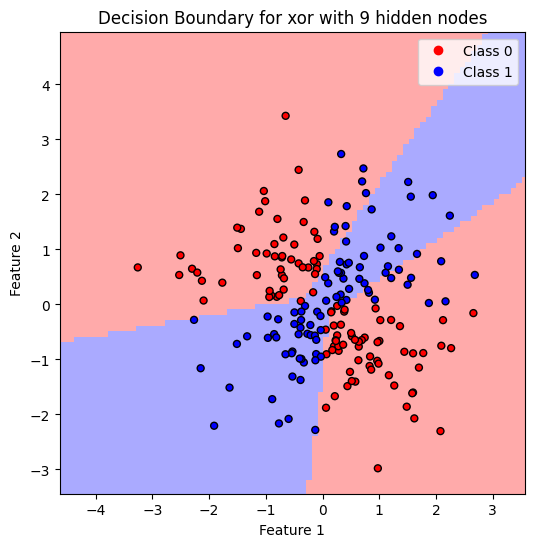

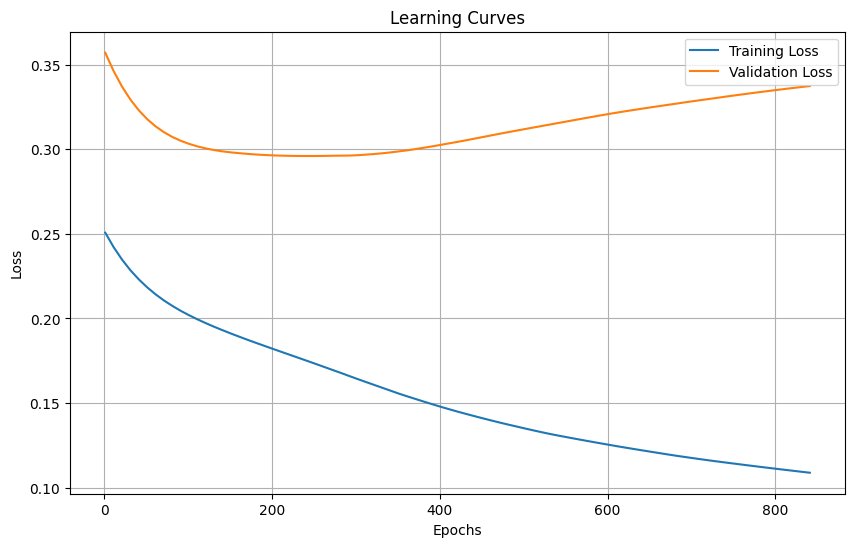

In [ ]:
name = 'xor'

x_train, y_train, _ = read_data(name, 'train')
# Testing different values of k for hidden nodes
input_size = x_train.shape[1]  # Number of features
output_size = len(np.unique(y_train))  # Number of classes (for one-hot encoding)
y_train_encoded = one_hot_encode(y_train, output_size)

x_test, y_test, label_test = read_data(name, 'test')  # Example with 'spiral' dataset
output_size = len(np.unique(y_test))
y_test_encoded = one_hot_encode(y_test, output_size)  # Ensure y_test is one-hot encoded


# Define hyperparameters
learning_rate = 0.02
epochs = 1000

for k in [2, 3, 5, 7, 9]:
    print(f"\nTraining with k={k} hidden nodes")
    model = FFNN(input_size=input_size, hidden_size=k, output_size=output_size, early_stopping_patience=600)
    train_losses, val_losses = model.train(x_train, y_train_encoded, epochs, x_test, y_test, learning_rate)

    final_loss = train_losses[-1]

    evaluator = Evaluator(model)
    accuracy = evaluator.evaluate(x_test, y_test_encoded)
    print(f"Model accuracy on test set: {accuracy * 100:.2f}%")
    my_draw(k,name,model=model)
    plot_learning_curves(train_losses, val_losses, epochs)


### Thoughts on the choice of optimal k number
#####   Underfitting with too few nodes (k = 5 and less): With fewer hidden nodes, the model lacks the capacity to learn the complex patterns required for XOR, leading to underfitting and low accuracy.

#####   Overfitting or instability with too many nodes (k = 9): Increasing the number of nodes to 9 provides greater flexibility, but as seen, it does not improve accuracy. Due to high variance, the model might overfit or fail to generalize, resulting in poor decision boundaries and lower accuracy.

#####   Moderate performance with k = 7: A model with 7 hidden nodes achieves a balance, displaying a more adaptable decision boundary and better accuracy, though still not ideal. An accuracy rate of 52.50% indicates it captures more information than other configurations..

### **Center_surround Dataset**


Training with k=2 hidden nodes
Model accuracy on test set: 61.50%


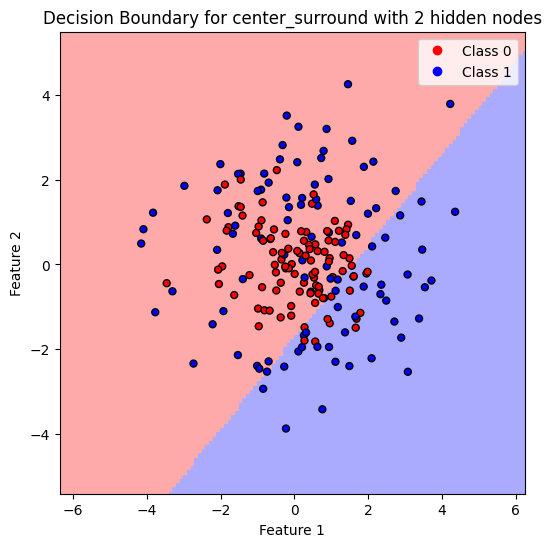

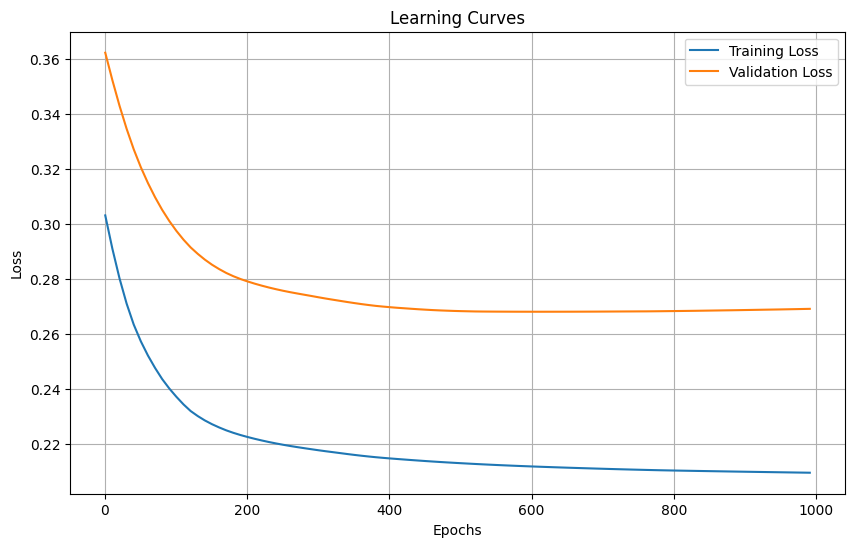


Training with k=3 hidden nodes
Model accuracy on test set: 68.50%


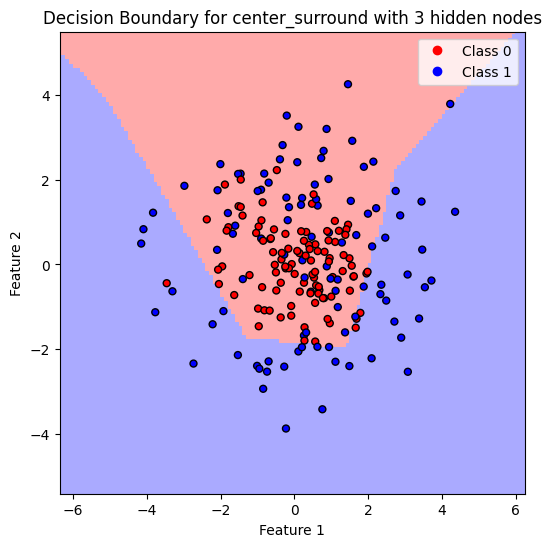

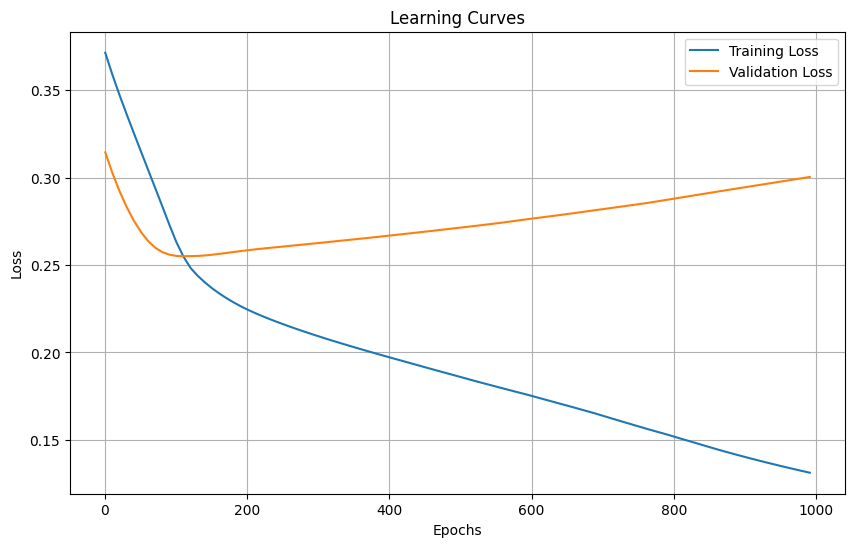


Training with k=5 hidden nodes
Model accuracy on test set: 69.00%


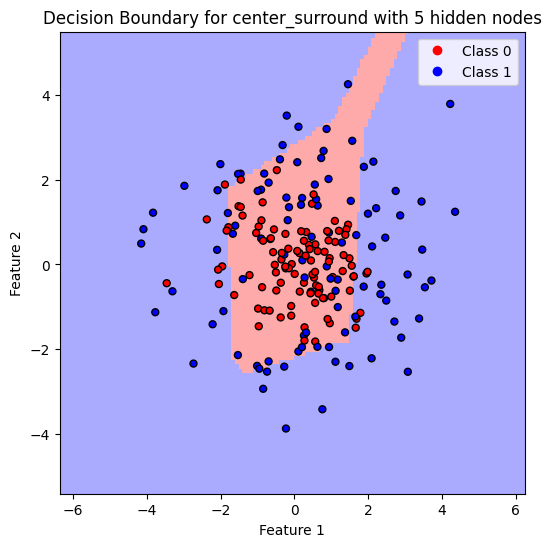

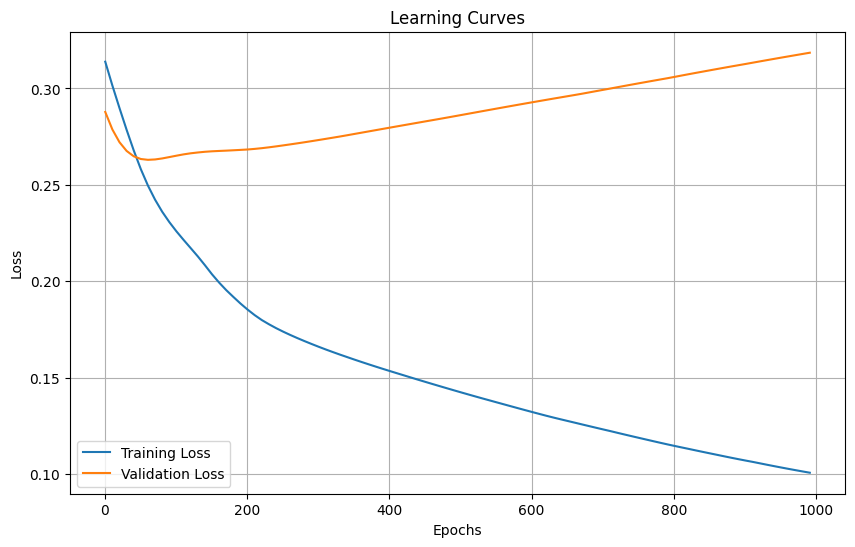


Training with k=7 hidden nodes
Model accuracy on test set: 73.00%


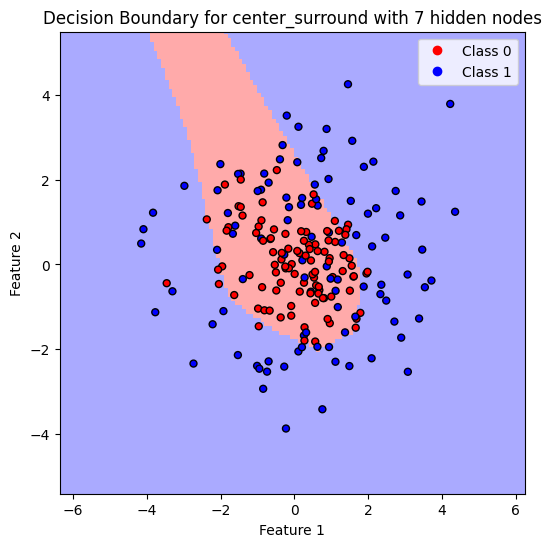

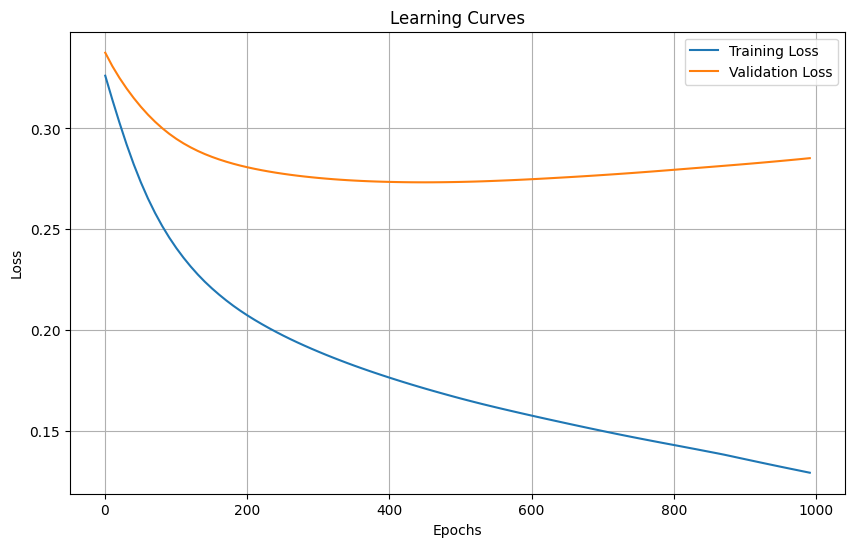


Training with k=9 hidden nodes
Model accuracy on test set: 75.50%


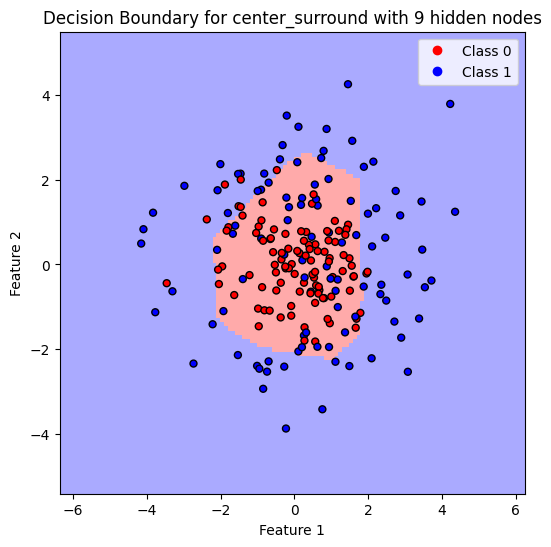

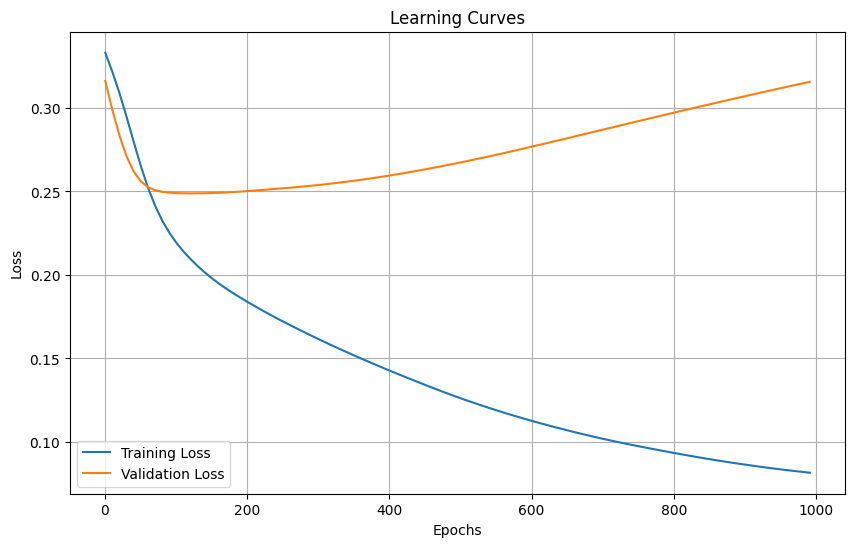

In [ ]:
name = 'center_surround'
x_train, y_train, _ = read_data(name, 'train')
# Testing different values of k for hidden nodes
input_size = x_train.shape[1]  # Number of features
output_size = len(np.unique(y_train))  # Number of classes (for one-hot encoding)
y_train_encoded = one_hot_encode(y_train, output_size)

x_test, y_test, label_test = read_data(name, 'test')  # Example with 'spiral' dataset
output_size = len(np.unique(y_test))
y_test_encoded = one_hot_encode(y_test, output_size)  # Ensure y_test is one-hot encoded


# Define hyperparameters
learning_rate = 0.01
epochs = 1000

for k in [2, 3, 5, 7, 9]:
    print(f"\nTraining with k={k} hidden nodes")
    model = FFNN(input_size=input_size, hidden_size=k, output_size=output_size, early_stopping_patience=1000)
    train_losses, val_losses = model.train(x_train, y_train_encoded, epochs, x_test, y_test, learning_rate)

    final_loss = train_losses[-1]

    evaluator = Evaluator(model)
    accuracy = evaluator.evaluate(x_test, y_test_encoded)
    print(f"Model accuracy on test set: {accuracy * 100:.2f}%")
    my_draw(k,name,model=model)
    plot_learning_curves(train_losses, val_losses, epochs)

### Thoughts on the choice of optimal k number
#####   For the 'center_surround' dataset, we found that when K=9, the model better fits the central distribution pattern in the data, with the decision boundary forming a circular shape. In contrast, configurations with K=2,3,5, and 7 do not align with this pattern.

####    So we choose K = 9

### **Two_gaussians Dataset**


Training with k=2 hidden nodes
Early stopping at epoch 204 with validation loss: 0.4431
Model accuracy on test set: 91.50%


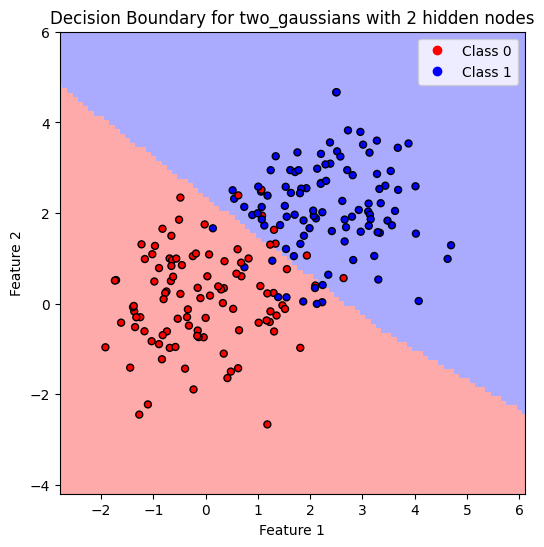

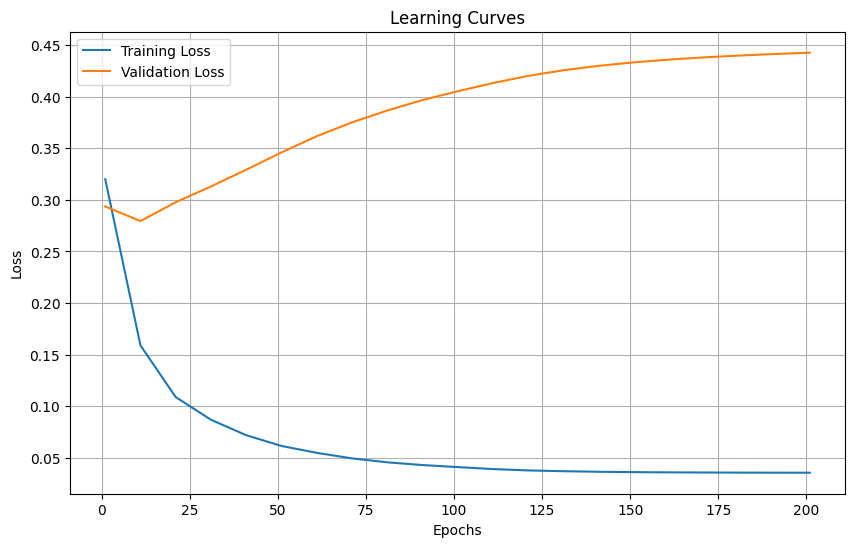


Training with k=3 hidden nodes
Early stopping at epoch 201 with validation loss: 0.4009
Model accuracy on test set: 91.50%


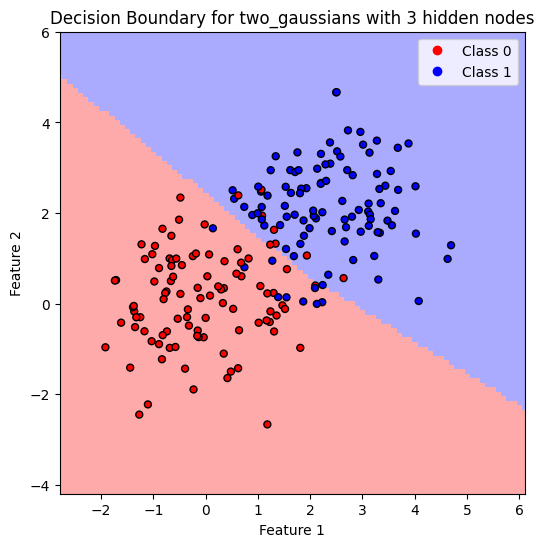

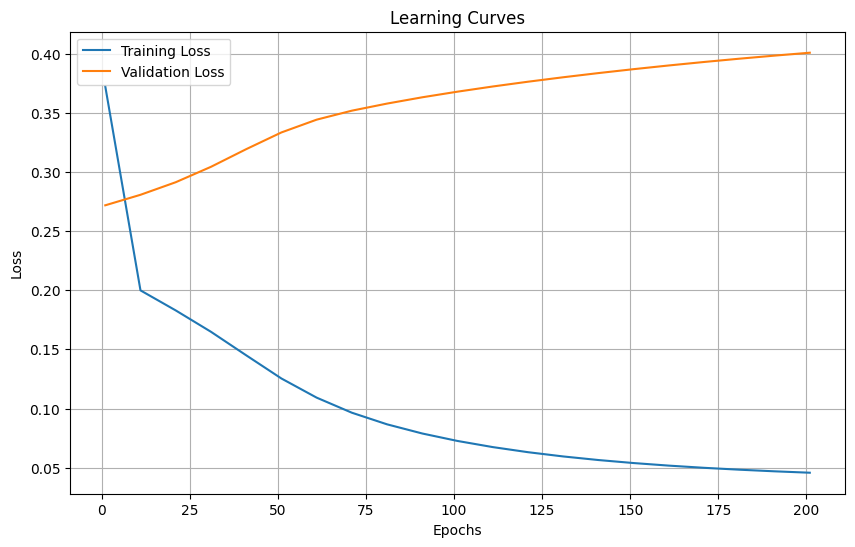


Training with k=5 hidden nodes
Early stopping at epoch 203 with validation loss: 0.4429
Model accuracy on test set: 91.00%


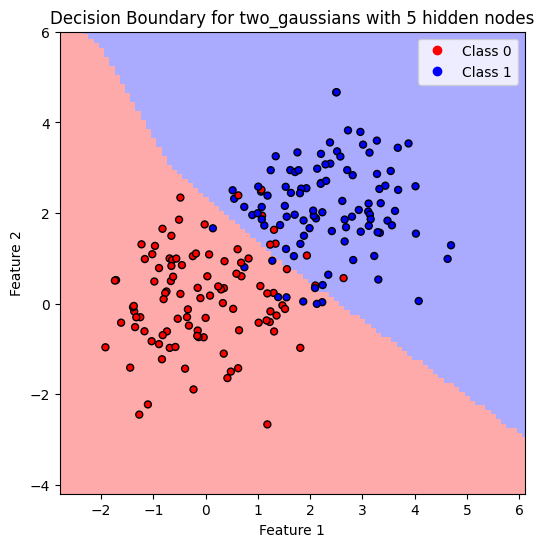

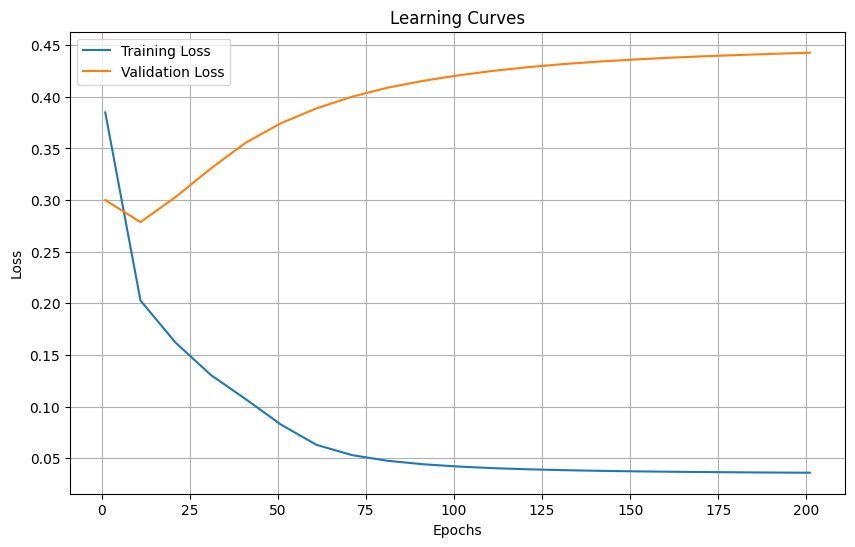


Training with k=7 hidden nodes
Early stopping at epoch 218 with validation loss: 0.4478
Model accuracy on test set: 91.50%


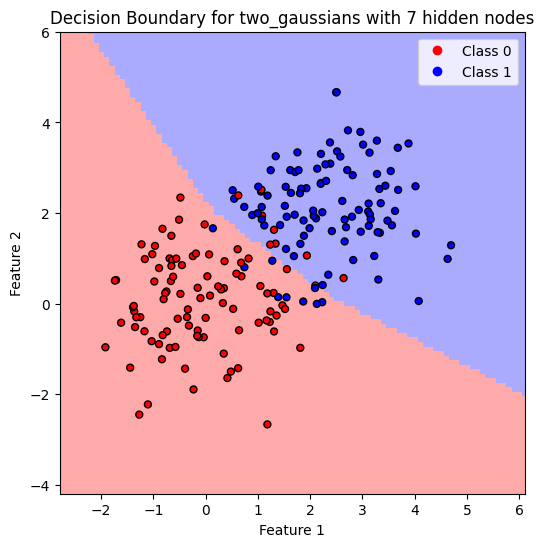

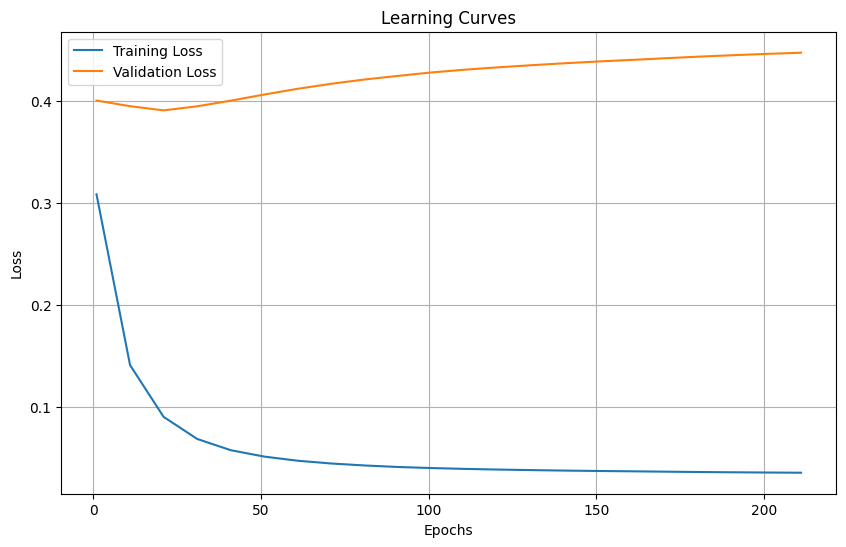


Training with k=9 hidden nodes
Early stopping at epoch 210 with validation loss: 0.4437
Model accuracy on test set: 91.00%


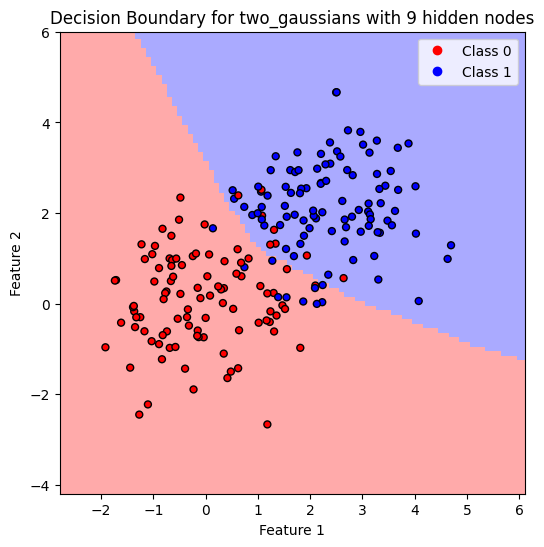

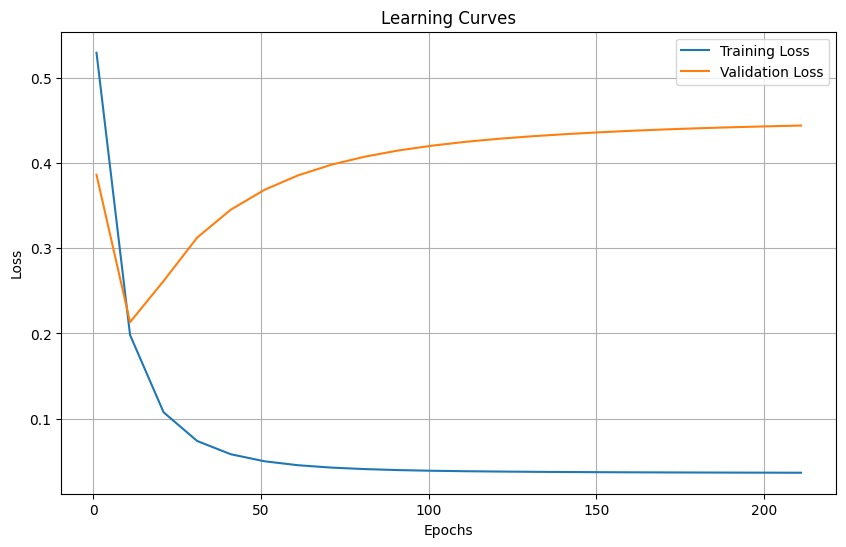

In [ ]:
name = 'two_gaussians'
x_train, y_train, _ = read_data(name, 'train')
# Testing different values of k for hidden nodes
input_size = x_train.shape[1]  # Number of features
output_size = len(np.unique(y_train))  # Number of classes (for one-hot encoding)
y_train_encoded = one_hot_encode(y_train, output_size)

x_test, y_test, label_test = read_data(name, 'test')  # Example with 'spiral' dataset
output_size = len(np.unique(y_test))
y_test_encoded = one_hot_encode(y_test, output_size)  # Ensure y_test is one-hot encoded


# Define hyperparameters
learning_rate = 0.1
epochs = 1000

for k in [2, 3, 5, 7, 9]:
    print(f"\nTraining with k={k} hidden nodes")
    model = FFNN(input_size=input_size, hidden_size=k, output_size=output_size)
    train_losses, val_losses = model.train(x_train, y_train_encoded, epochs, x_test, y_test, learning_rate)

    final_loss = train_losses[-1]

    evaluator = Evaluator(model)
    accuracy = evaluator.evaluate(x_test, y_test_encoded)
    print(f"Model accuracy on test set: {accuracy * 100:.2f}%")
    my_draw(k,name,model=model)
    plot_learning_curves(train_losses, val_losses, epochs)

### Thoughts on the choice of optimal k number

####    The 'two_gaussians' dataset favors selecting K=2 because increasing the K value does not result in significant improvements in performance. Opting for a smaller K aligns with the principles of generalization and model simplicity, following Occam's Razor, which suggests that simpler models are preferable when additional complexity does not provide clear benefits.

### **Spiral Dataset**


Training with k=2 hidden nodes
Model accuracy on test set: 77.00%


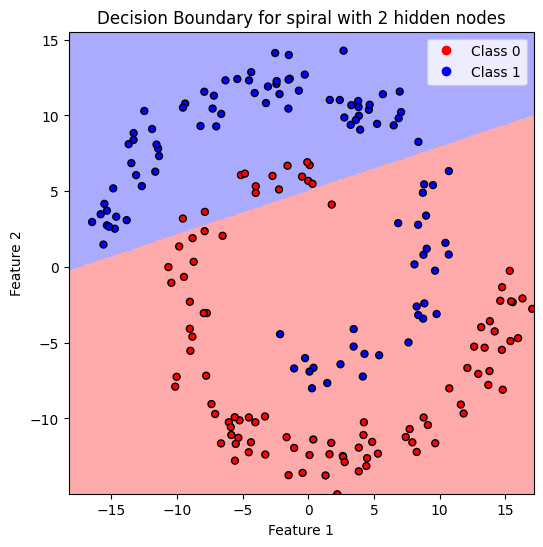

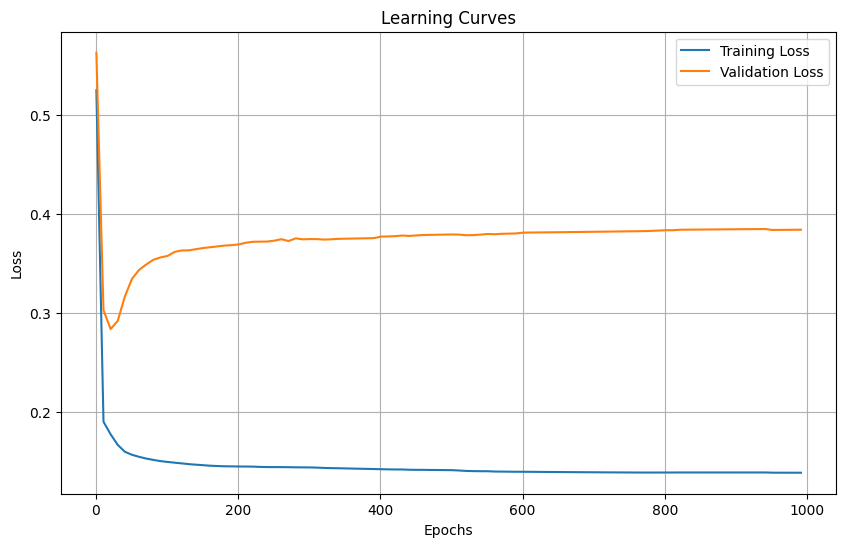


Training with k=3 hidden nodes
Model accuracy on test set: 84.00%


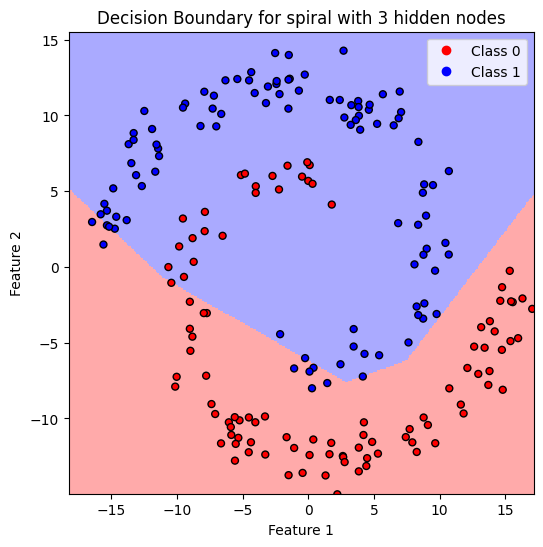

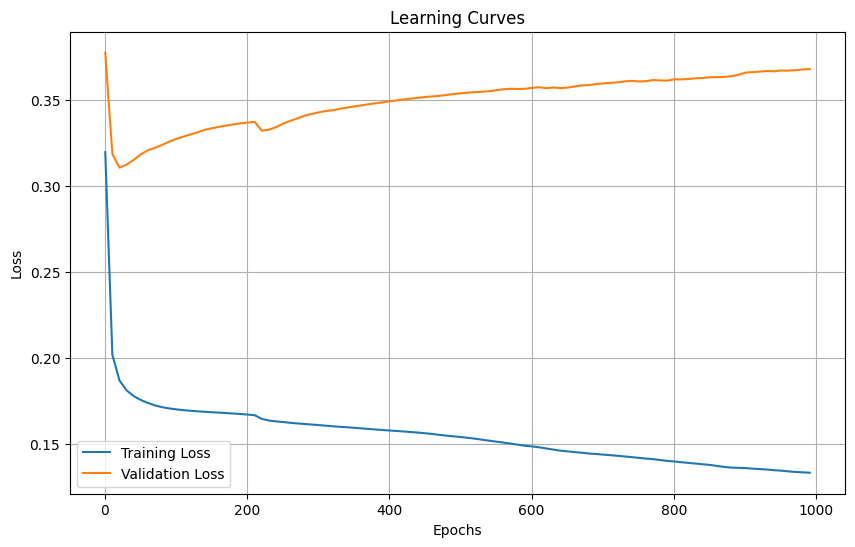


Training with k=5 hidden nodes
Model accuracy on test set: 93.00%


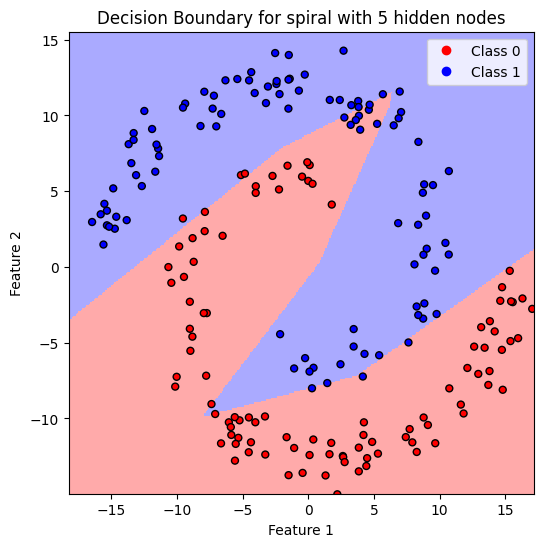

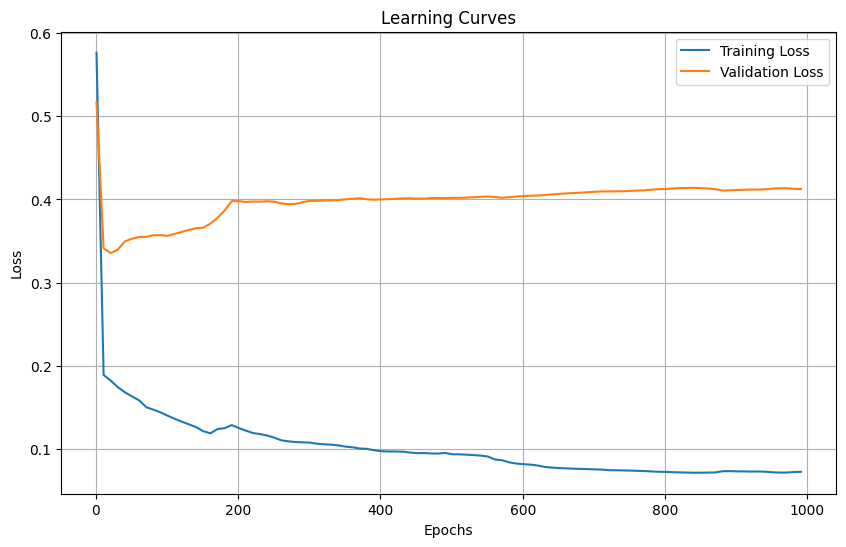


Training with k=7 hidden nodes
Model accuracy on test set: 99.50%


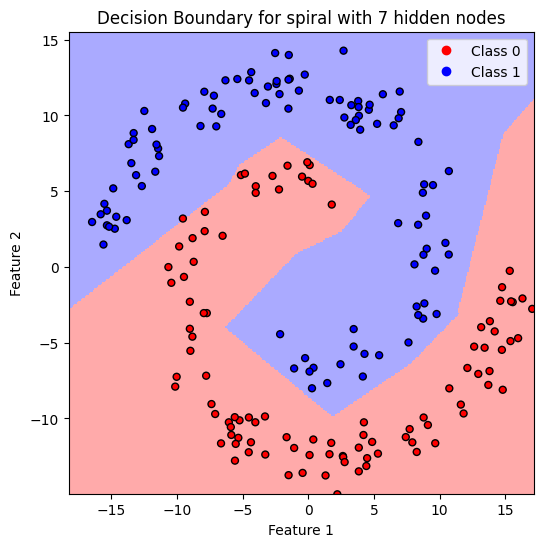

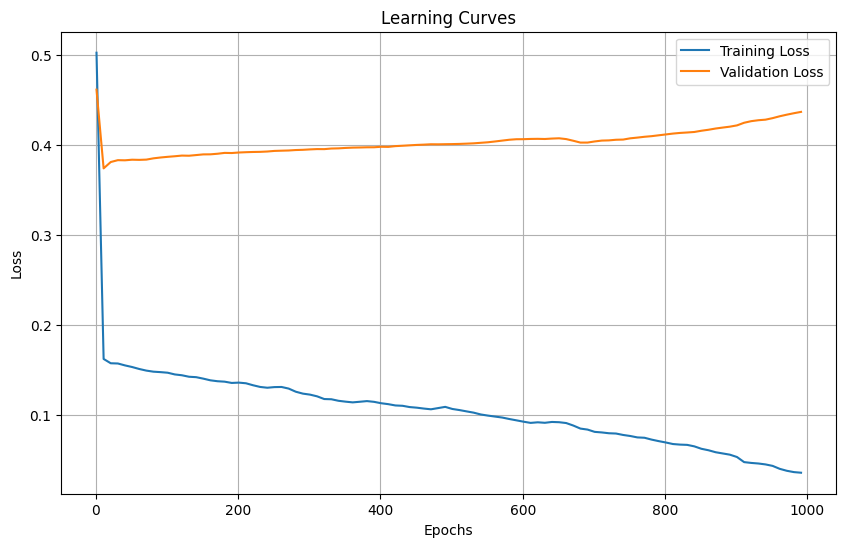


Training with k=9 hidden nodes
Model accuracy on test set: 93.50%


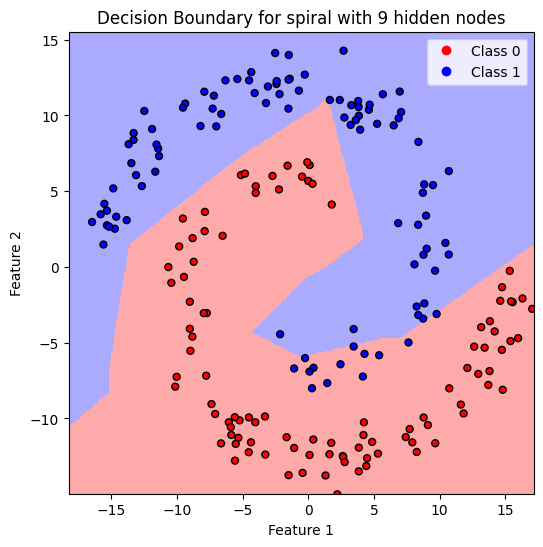

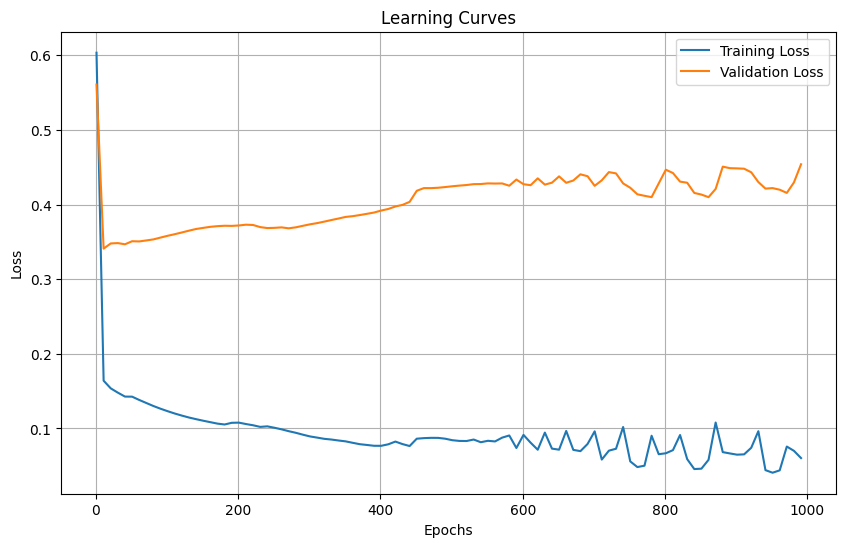

In [ ]:
name = 'spiral'
x_train, y_train, _ = read_data(name, 'train')
# Testing different values of k for hidden nodes
input_size = x_train.shape[1]  # Number of features
output_size = len(np.unique(y_train))  # Number of classes (for one-hot encoding)
y_train_encoded = one_hot_encode(y_train, output_size)

x_test, y_test, label_test = read_data(name, 'test')  # Example with 'spiral' dataset
output_size = len(np.unique(y_test))
y_test_encoded = one_hot_encode(y_test, output_size)  # Ensure y_test is one-hot encoded


# Define hyperparameters
learning_rate = 0.1
epochs = 1000

for k in [2, 3, 5, 7, 9]:
    print(f"\nTraining with k={k} hidden nodes")
    model = FFNN(input_size=input_size, hidden_size=k, output_size=output_size)
    train_losses, val_losses = model.train(x_train, y_train_encoded, epochs, x_test, y_test, learning_rate)

    final_loss = train_losses[-1]

    evaluator = Evaluator(model)
    accuracy = evaluator.evaluate(x_test, y_test_encoded)
    print(f"Model accuracy on test set: {accuracy * 100:.2f}%")
    my_draw(k,name,model=model)
    plot_learning_curves(train_losses, val_losses, epochs)

- ### Thoughts on the choice of optimal k number

    - ####    The spiral pattern is highly non-linear, and thus, a sufficient number of hidden nodes is required to model the intricate decision boundary. A lower K might not capture this complexity, leading to underfitting.

    - ####    Compared to K=9 and K=5, the model with K=7 demonstrates a smoother decision boundary and achieves a higher accuracy. When K=9, the increased number of hidden nodes adds complexity, which can sometimes lead to a more jagged or fragmented decision boundary due to overfitting. This complexity may cause the model to capture noise or less relevant details, reducing its ability to generalize effectively.

    - ####    As seen in the plot, the model with K=7 produces a smooth, coherent decision boundary that separates the classes effectively. This indicates that K=7 provides an adequate balance between model flexibility and accuracy.

- ### Thoughts on the choice of optimal k number

    - ####    The spiral pattern is highly non-linear, and thus, a sufficient number of hidden nodes is required to model the intricate decision boundary. A lower K might not capture this complexity, leading to underfitting.

    - ####    Compared to K=9 and K=5, the model with K=7 demonstrates a smoother decision boundary and achieves a higher accuracy. When K=9, the increased number of hidden nodes adds complexity, which can sometimes lead to a more jagged or fragmented decision boundary due to overfitting. This complexity may cause the model to capture noise or less relevant details, reducing its ability to generalize effectively.

    - ####    As seen in the plot, the model with K=7 produces a smooth, coherent decision boundary that separates the classes effectively. This indicates that K=7 provides an adequate balance between model flexibility and accuracy.


  
### **Part 4: Regularizers (repeat step1 and add two regularizers)**

In [68]:
import torch
import torch.nn as nn

import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import sys
import os
from torch.utils.data import TensorDataset, DataLoader
from matplotlib.colors import ListedColormap

%matplotlib inline

################################################################################
# Some simple plotting utilities
################################################################################


def plot_data(data: np.ndarray,
              labels: np.ndarray,
              ax: matplotlib.axes.Axes = None):
    """
    A helper function to plot our data sets

    PARAMETERS
    ----------
    data      A numpy array of 2 columns (dimensions) and 2*examples_per_class rows

    labels    A numpy vector with 2*examples_per_class, with a +1 or -1 in each
              element. The jth element is the label of the jth example

    ax        An optional matplotlib axis object to plot to
    """

    # require shape (n, 2)
    assert data.ndim == 2
    assert data.shape[-1] == 2

    if type(data) == torch.Tensor:
        data = data.numpy()

    # plot the data
    pos_idx = np.where(labels == 1)
    neg_idx = np.where(labels == -1)

    if ax is None:
        ax = plt
    ax.plot(
        data.T[0, pos_idx],
        data.T[1, pos_idx],
        'r^',
        label='positive'
    )
    ax.plot(
        data.T[0, neg_idx],
        data.T[1, neg_idx],
        'bo',
        label='negative'
    )
    ax.axis('equal')
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), loc="upper right")

    if ax is None:
        plt.show()


def plot_decision_surface(model=None,
                          axis_limits=(-5, 5, -5, 5),
                          ax: matplotlib.axes.Axes = None
                          ):
    """
    Creates a grid of points, measures what a model would label each
    point as, and uses this data to draw a region for class +1 and a region for
    class -1.

    PARAMETERS
    ----------
    model       A callable model that can take 2-d real-valued input and produce
                a +1 or -1 label for each data point.

    axis_limits An array-like object with 4 floats [lowest_horizontal, highest_horizontal,
                lowest_vertical, highest_vertical]. This sets the limits over which
                the decision surface will be caluclated and plotted.

    ax          An optional matplotlib axis object to plot to

    RETURNS
    -------
    my_contour  a matplotlib.contour.QuadContourSet with the contour
    """

    # Create a grid of points spanning the entire space displayed in the axis.
    # This will let us draw the decision boundary later
    xx, yy = np.meshgrid(np.arange(axis_limits[0], axis_limits[1], .05),
                         np.arange(axis_limits[2], axis_limits[3], .05))
    data = np.concatenate([xx.reshape([1, -1]), yy.reshape([1, -1])]).T

    # Predict the class of each point in XGrid, using the classifier.
    # This shows our regions determined by the classifier
    if isinstance(model, nn.Module):
        with torch.no_grad():
            pl = model(torch.tensor(data).to(dtype=torch.float32))
            predicted_labels = np.sign(pl.numpy())
    else:
        predicted_labels = model(data)

    predicted_labels = predicted_labels.reshape(xx.shape)

    # Put the result into a color plot
    if ax is None:
        ax = plt

    ax.contourf(xx, yy, predicted_labels, cmap=plt.cm.Paired)
    ax.axis('equal')
    ax.axis('tight')

    if ax is None:
        plt.show()


def compute_bounds(features):
    min1, max1 = features[:, 0].min()-1, features[:, 0].max()+1
    min2, max2 = features[:, 1].min()-1, features[:, 1].max()+1
    return (min1, max1, min2, max2)


def plot_decision_regions(
        features, targets, model,
        axis=None, transform=None,
        bounds=None,
        title='Decision Surface'):
    """
    Slightly different plotting approach than above. Used in backprop demo.

    This function produces a single plot containing a scatter plot of the
    features, targets, and decision region of the model.

    Args:
        features (np.ndarray): 2D array containing real-valued inputs.
        targets (np.ndarray): 1D array containing binary targets.
        model: a learner with .predict() method
        axis: the axis on which to plot. If None, create a new plot
        title: title of the plot
    Returns:
        None (plots to the active figure)
    """

    # define bounds of the domain
    if bounds is None:
        min1, max1, min2, max2 = compute_bounds(features)
    else:
        min1, max1, min2, max2 = bounds

    # define grid for visualizing decision regions
    x1grid = np.arange(min1, max1, 0.1)
    x2grid = np.arange(min2, max2, 0.1)

    xx, yy = np.meshgrid(x1grid, x2grid)

    # flatten grid to a vector
    r1, r2 = xx.flatten(), yy.flatten()
    r1, r2 = r1.reshape((len(r1), 1)), r2.reshape((len(r2), 1))

    # horizontally stack vectors to create x1,x2 input for the model
    grid = np.hstack((r1,r2))

    # if we're transforming the features, do that now
    #     this allows xx and yy to still be in 2D for the visualization
    #     but grid has been transformed so it matches up with the fit model
    if transform is not None:
        grid = transform(grid)

    # generate predictions over grid
    yhat = model.predict(grid)

    # reshape the predictions back into a grid
    zz = yhat.reshape(xx.shape)


    if axis is None:
        fig, axis = plt.subplots()

    # plot the grid of x, y and z values as a surface
    binary_cmap = matplotlib.colors.ListedColormap(['#9ce8ff', '#ffc773'])
    axis.contourf(xx, yy, zz, cmap=binary_cmap, alpha=0.7)

    # plot "negative" class:
    row_idx_neg = np.where(targets < 0.5)[0]
    axis.scatter(
        features[row_idx_neg, 0], features[row_idx_neg, 1],
        label='negative')

    # plot "positive" class:
    row_idx_pos = np.where(targets > 0.5)[0]
    axis.scatter(
        features[row_idx_pos, 0], features[row_idx_pos, 1],
        label='positive')

    axis.set_title(title)
    axis.set_xlim(min1, max1)
    axis.set_ylim(min2, max2)

    axis.legend(loc="upper left")

##### initialize data loading function

In [69]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
import os

%matplotlib inline

np.random.seed(20)
torch.manual_seed(0)
'''
load different dataset
'''
def read_data(name,mode):

    x_data = []
    y_data = []
    label_data = []

    base_dir = os.getcwd()
    root = base_dir
    filename = '%s/%s_%s.csv' % (root,name,mode)

    i = 0
    with open(filename,'rt') as f:
        for line in f:
            line = line.replace('\n','')
            tokens = line.split(',')
            if i > 0:
                y = int(float(tokens[0]))
                x1 = float(tokens[1])
                x2 = float(tokens[2])
                x_data.append([1.0,x1,x2])
                y_data.append([y])
                temp = [0,0]
                temp[y] = 1
                label_data.append(temp)
            i = i + 1
    xs = np.array(x_data,dtype='float32')
    ys = np.array(y_data,dtype='float32')
    labels = np.array(label_data,dtype='float32')
    return(xs,ys,labels)


#### Construct Net3 with a single hidden layer
##### Utilize tanh as the activation function, and also add a bias term

In [70]:
class net3(nn.Module):
    def __init__(self,input_size,nodes,output_size):
        super(net3,self).__init__()
        #we use linear calculation from input to hidden layer, with bias
        self.l1 = nn.Linear(input_size,nodes,bias=True)
        #we use tanh function as our activation function
        self.activation = nn.Tanh()
        #we use linear calculation from hidden layer to output layer, with bias
        self.output_layer = nn.Linear(nodes, output_size, bias=True)

    def forward(self, x, return_hidden=False):
        # Hidden layer activations
        x_hidden = self.activation(self.l1(x))
        # Output layer
        x_output = self.output_layer(x_hidden)

        # Return both output and hidden layer activations if requested
        if return_hidden:
            return x_output, x_hidden
        return x_output

##### Repeat the step 1 with multi-class cross entropy (MCE), and add two regularizers in the traing phase. We keep track of training loss and validation loss for every epoch for future visualization.

In [71]:
def train_model_with_regularizers(
    name, model, learning_rate=0.01, epochs=100, lambda_1=0.01, lambda_2=0.01
):
    # Read training data
    x_train, y_train, _ = read_data(name, 'train')
    x_val, y_val, _ = read_data(name, 'valid')

    # Convert to PyTorch tensors
    x_train = torch.tensor(x_train, dtype=torch.float32)
    x_val = torch.tensor(x_val, dtype=torch.float32)
    y_train = torch.tensor(y_train, dtype=torch.long).squeeze()
    y_val = torch.tensor(y_val, dtype=torch.long).squeeze()

    train_dataset = TensorDataset(x_train, y_train)
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

    val_dataset = TensorDataset(x_val, y_val)
    val_loader = DataLoader(val_dataset, batch_size=32)

    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

    # Initialize lists to store loss history
    train_losses = []
    val_losses = []

    # Training loop
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        for x, y in train_loader:
            optimizer.zero_grad()
            predictions = model(x)
            loss = criterion(predictions, y)

            # Add first regularizer (L2 norm of input layer weights)
            l1_weights = model.l1.weight
            reg1 = lambda_1 * torch.norm(l1_weights, p=2)

            # Add second regularizer (orthogonality of hidden layer weights)
            reg2 = 0
            if model.l1.weight.shape[0] > 1:  # Ensure multiple hidden nodes
                reg2 = lambda_2 * torch.sum(
                    torch.norm(torch.mm(model.l1.weight, model.l1.weight.T) - torch.eye(model.l1.weight.shape[0]), p="fro")
                )

            # add all losses
            total_loss = loss + reg1 + reg2
            total_loss.backward()
            optimizer.step()
            epoch_loss += total_loss.item()

        # Validation loop
        model.eval()
        epoch_val_loss = 0
        with torch.no_grad():
            for x, y in val_loader:
                output = model(x)
                val_loss = criterion(output, y)
                epoch_val_loss += val_loss.item()

        # Calculate average losses
        avg_train_loss = epoch_loss / len(train_loader.dataset)
        avg_val_loss = epoch_val_loss / len(val_loader.dataset)
        # Store the losses
        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)

    return model, train_losses, val_losses

In [72]:
def train_model(name, model, learning_rate=0.01, epochs=100):
    # Read training data
    x_train, y_train, _ = read_data(name, 'train')
    x_val, y_val, _ = read_data(name, 'valid')

    # Convert to PyTorch tensors
    x_train = torch.tensor(x_train, dtype=torch.float32)
    x_val = torch.tensor(x_val, dtype=torch.float32)
    y_train = torch.tensor(y_train, dtype=torch.long).squeeze()
    y_val = torch.tensor(y_val, dtype=torch.long).squeeze() 

    train_dataset = TensorDataset(x_train, y_train)
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

    val_dataset = TensorDataset(x_val, y_val)
    val_loader = DataLoader(val_dataset, batch_size=32)

    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
    # Initialize lists to store loss history
    train_losses = []
    val_losses = []

    # Training loop
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        for x, y in train_loader:
            optimizer.zero_grad()
            predictions = model(x)
            loss = criterion(predictions, y)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()

        # Validation loop
        model.eval()
        epoch_val_loss = 0
        with torch.no_grad():
            for x, y in val_loader:
                output = model(x)
                val_loss = criterion(output, y)
                epoch_val_loss += val_loss.item()

        # Calculate average losses
        avg_train_loss = epoch_loss / len(train_loader.dataset)
        avg_val_loss = epoch_val_loss / len(val_loader.dataset)
        # Store the losses
        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)

        # Print training progress
        # if (epoch + 1) % 50 == 0:
        #     print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

    return model, train_losses, val_losses

##### Model Evaluation Code, also calculate and print the accuracy on test dataset

In [73]:
def evaluate_model(name, model):
    x_test, y_test, _ = read_data(name, 'test')

    # Convert to PyTorch tensors
    x_test = torch.tensor(x_test, dtype=torch.float32)
    y_test = torch.tensor(y_test, dtype=torch.long).squeeze()
    test_dataset = TensorDataset(x_test, y_test)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)

    # Initialize counters
    correct = 0
    total = 0

    # Set model to evaluation mode
    model.eval()
    with torch.no_grad():
        for x,y in test_loader:
            predictions = model(x)
            predicted_classes = predictions.argmax(dim=1)  # Get the predicted class indices
            correct += (predicted_classes == y).sum().item()
            total += y.size(0)

    accuracy = correct / total
    print(f"Test Accuracy: {accuracy:.4f}")
    return accuracy

##### Here is the drawing function for result visualization using the test data

In [74]:
def draw_example(nodes, name, model):
    x_train, y_train, label_train = read_data(name, 'train')
    x_test, y_test, label_test = read_data(name, 'test')

    fig, ax = plt.subplots(figsize=(6, 6))

    h = 0.05  # step size in the mesh
    cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA'])
    cmap_bold = ListedColormap(['#FF0000', '#00FF00'])

    # Define grid range
    x_min, x_max = x_train[:, 1].min() - 1, x_train[:, 1].max() + 1
    y_min, y_max = x_train[:, 2].min() - 1, x_train[:, 2].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    # Prepare grid data for predictions
    grid_data = np.c_[xx.ravel(), yy.ravel()]
    grid_data = np.hstack((np.ones((grid_data.shape[0], 1)), grid_data))  # Add bias term
    grid_tensor = torch.tensor(grid_data, dtype=torch.float32)

    # Get predictions for the entire grid
    model.eval()
    with torch.no_grad():
        preds = model(grid_tensor)  # Shape: (num_points, num_classes)
        Z = preds.argmax(dim=1).numpy()  # Get class predictions

    # Reshape predictions to match the grid
    Z = Z.reshape(xx.shape)

    # Plot decision boundary and test data
    ax.pcolormesh(xx, yy, Z, cmap=cmap_light, shading='auto')
    ax.scatter(x_test[:, 1], x_test[:, 2], c=y_test[:, 0], cmap=cmap_bold, edgecolor='k', s=20)
    plt.show()

##### Here is the drawing function to plot the learning curves for training and validation loss as a function of training epochs

In [75]:
def plot_learning_curves(train_losses,val_losses,epochs):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Learning Curves')
    plt.legend()
    plt.grid(True)
    plt.show()

##### Here is code for plotting the intermediate decision boundaries of the regularized and unregularized FFNN

In [76]:
def plot_comparison_regularized_unregularized(
    regularized_model, unregularized_model, name, grid_points=100, title="Comparison: Regularized vs Unregularized"
):
    """
    Plot decision boundaries for regularized and unregularized models in a strict format.
    Args:
        regularized_model: The trained PyTorch model with regularization.
        unregularized_model: The trained PyTorch model without regularization.
        name: Dataset name, used to load data via `read_data`.
        grid_points: Resolution of the grid for plotting (default: 100).
        title: Title of the plot (default: "Comparison: Regularized vs Unregularized").
    """
    # Load training and test data
    x_train, y_train, label_train = read_data(name, 'train')
    x_test, y_test, label_test = read_data(name, 'test')

    # Define grid range
    x_min, x_max = x_train[:, 1].min() - 1, x_train[:, 1].max() + 1
    y_min, y_max = x_train[:, 2].min() - 1, x_train[:, 2].max() + 1
    xx, yy = np.meshgrid(
        np.linspace(x_min, x_max, grid_points),
        np.linspace(y_min, y_max, grid_points)
    )

    # Prepare grid data for predictions
    grid_data = np.c_[xx.ravel(), yy.ravel()]
    grid_data = np.hstack((np.ones((grid_data.shape[0], 1)), grid_data))  # Add bias term
    grid_tensor = torch.tensor(grid_data, dtype=torch.float32)

    # Get predictions and hidden activations for both models
    regularized_model.eval()
    unregularized_model.eval()

    with torch.no_grad():
        preds_reg = regularized_model(grid_tensor)
        Z_reg = preds_reg.argmax(dim=1).numpy()
        hidden_activations_reg = regularized_model.l1(grid_tensor)

        preds_unreg = unregularized_model(grid_tensor)
        Z_unreg = preds_unreg.argmax(dim=1).numpy()
        hidden_activations_unreg = unregularized_model.l1(grid_tensor)

    # Reshape predictions to match the grid
    Z_reg = Z_reg.reshape(xx.shape)
    Z_unreg = Z_unreg.reshape(xx.shape)

    # Prepare subplots
    num_hidden_nodes = hidden_activations_reg.shape[1]
    fig, axes = plt.subplots(2, num_hidden_nodes + 1, figsize=(20, 8))

    # Define colors
    cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA'])
    cmap_bold = ListedColormap(['#FF0000', '#00FF00'])

    # Add row labels for "Regularized" and "Unregularized"
    axes[0, 0].set_ylabel("Regularized", fontsize=14, labelpad=20)
    axes[1, 0].set_ylabel("Unregularized", fontsize=14, labelpad=20)

    # Plot composite decision boundary for regularized model
    axes[0, 0].pcolormesh(xx, yy, Z_reg, cmap=cmap_light, shading='auto')
    axes[0, 0].scatter(x_test[:, 1], x_test[:, 2], c=y_test[:, 0], cmap=cmap_bold, edgecolor='k', s=20)
    axes[0, 0].set_title("Composite")

    # Plot composite decision boundary for unregularized model
    axes[1, 0].pcolormesh(xx, yy, Z_unreg, cmap=cmap_light, shading='auto')
    axes[1, 0].scatter(x_test[:, 1], x_test[:, 2], c=y_test[:, 0], cmap=cmap_bold, edgecolor='k', s=20)
    axes[1, 0].set_title("Composite")

    # Plot hidden node boundaries for regularized model
    for i in range(num_hidden_nodes):
        activation_reg = torch.tanh(hidden_activations_reg[:, i]).numpy().reshape(xx.shape)
        axes[0, i + 1].contourf(xx, yy, activation_reg > 0, cmap=cmap_light, alpha=0.6)
        axes[0, i + 1].scatter(x_test[:, 1], x_test[:, 2], c=y_test[:, 0], cmap=cmap_bold, edgecolor='k', s=20)
        axes[0, i + 1].set_title(f"Node {i}")

    # Plot hidden node boundaries for unregularized model
    for i in range(num_hidden_nodes):
        activation_unreg = torch.tanh(hidden_activations_unreg[:, i]).numpy().reshape(xx.shape)
        axes[1, i + 1].contourf(xx, yy, activation_unreg > 0, cmap=cmap_light, alpha=0.6)
        axes[1, i + 1].scatter(x_test[:, 1], x_test[:, 2], c=y_test[:, 0], cmap=cmap_bold, edgecolor='k', s=20)
        axes[1, i + 1].set_title(f"Node {i}")

    # Add overall title and adjust layout
    fig.suptitle(title, fontsize=16, y=1.02)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

### **Experiments on four datasets**

#### The following are the experimental results for four datasets in the order of XOR, Spiral, Two Gaussians, and Center Surround. 

- #### For each dataset, parameters are as follow:
    - #### learning rate is set to 0.01
    - #### the weights for both regularization terms are 0.01
    - #### the number of epochs is 1000. 

#### The experimental results include the decision surface on the test data, the learning curves for train and validation, and finally, the comparison of intermediate decision boundaries.

For Dataset: xor

Training with k=2
Test Accuracy: 0.6450


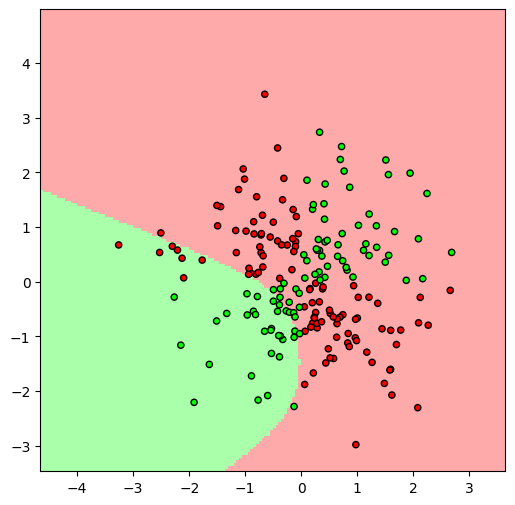

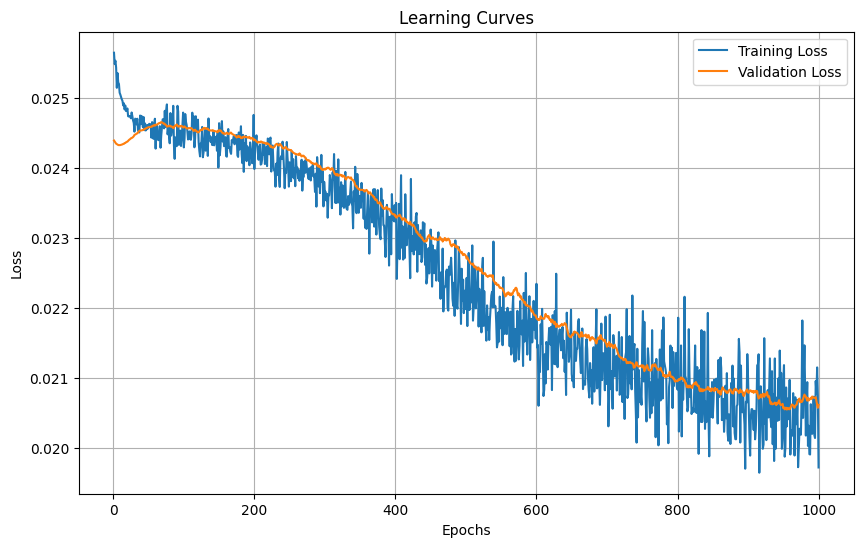

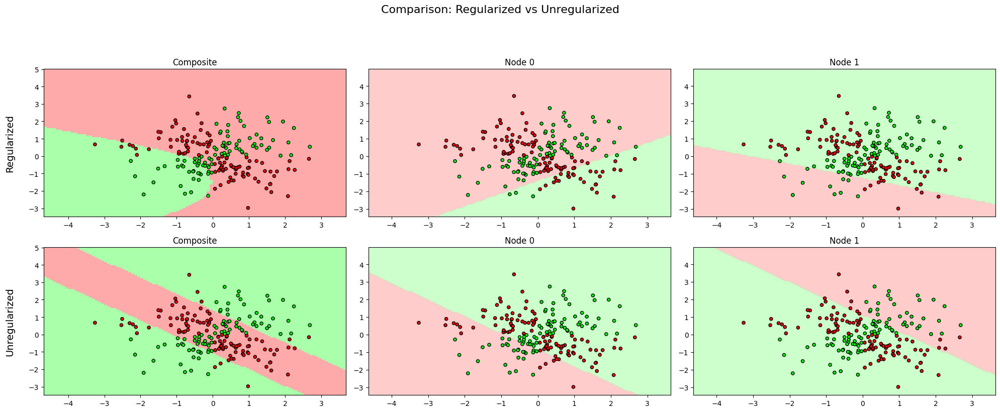


Training with k=3
Test Accuracy: 0.7950


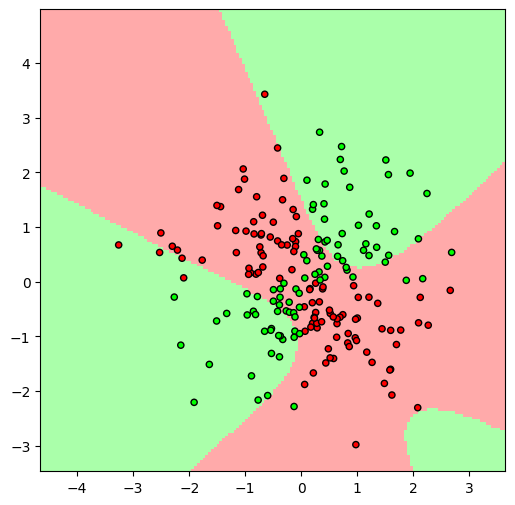

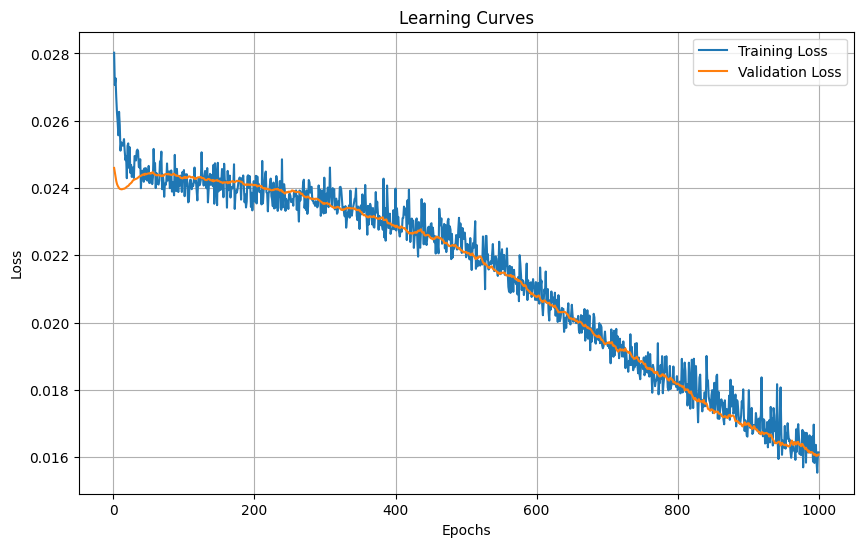

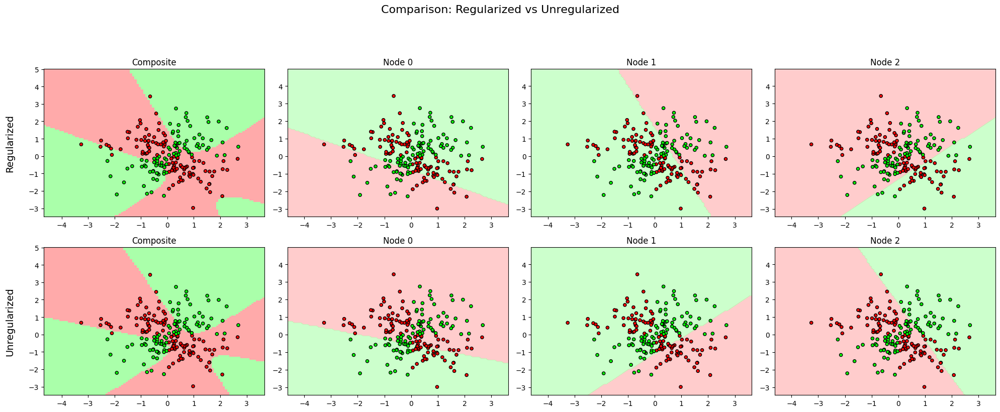


Training with k=5
Test Accuracy: 0.8100


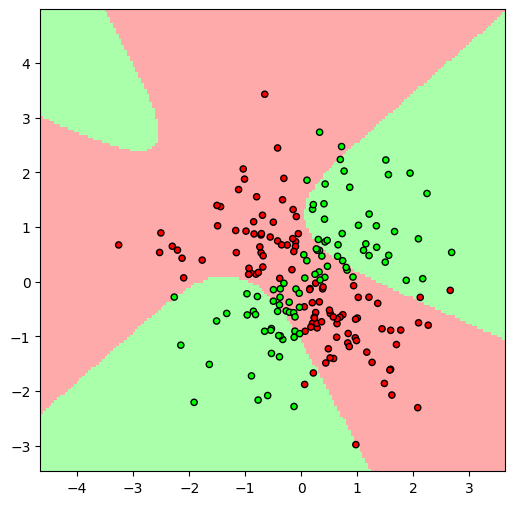

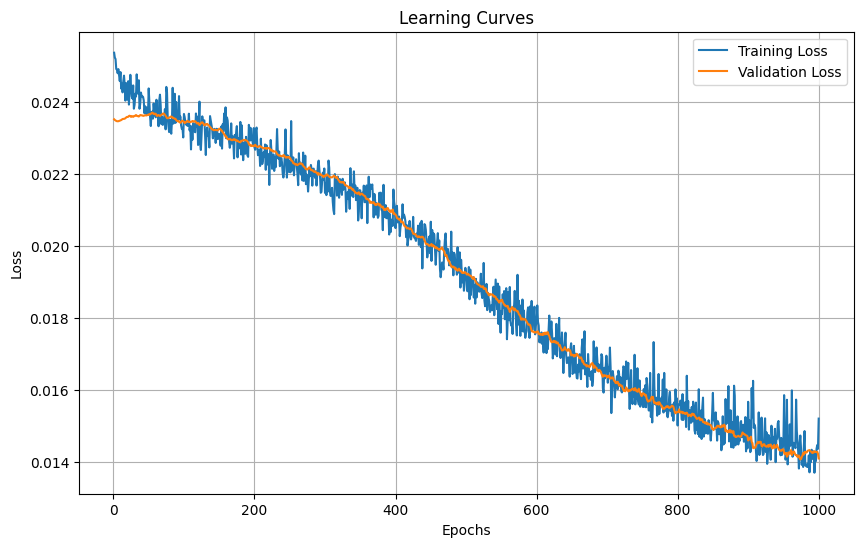

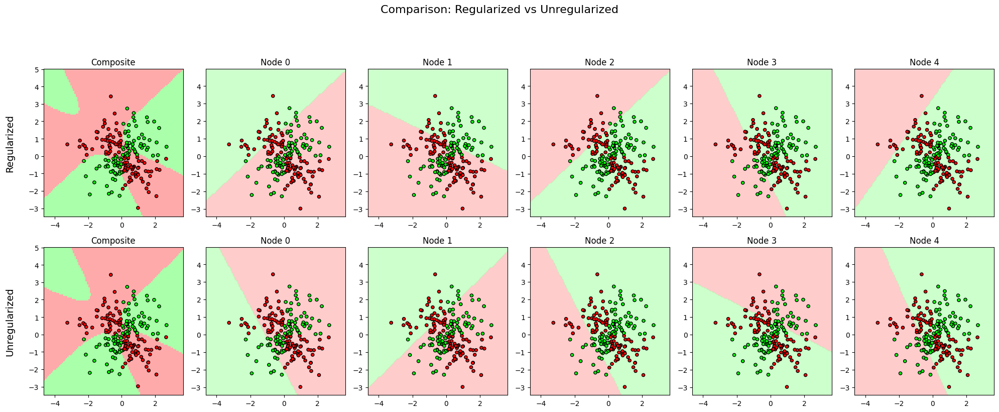


Training with k=7
Test Accuracy: 0.9100


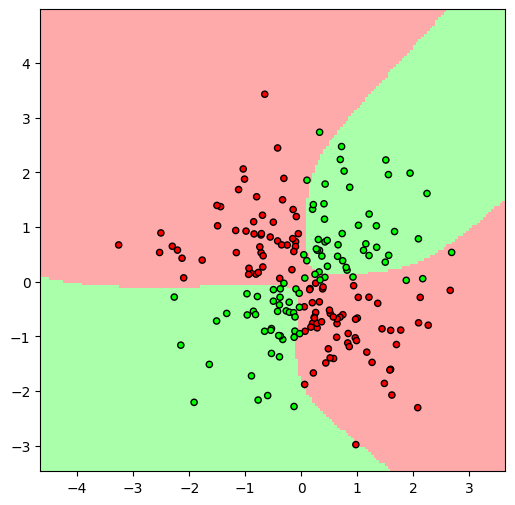

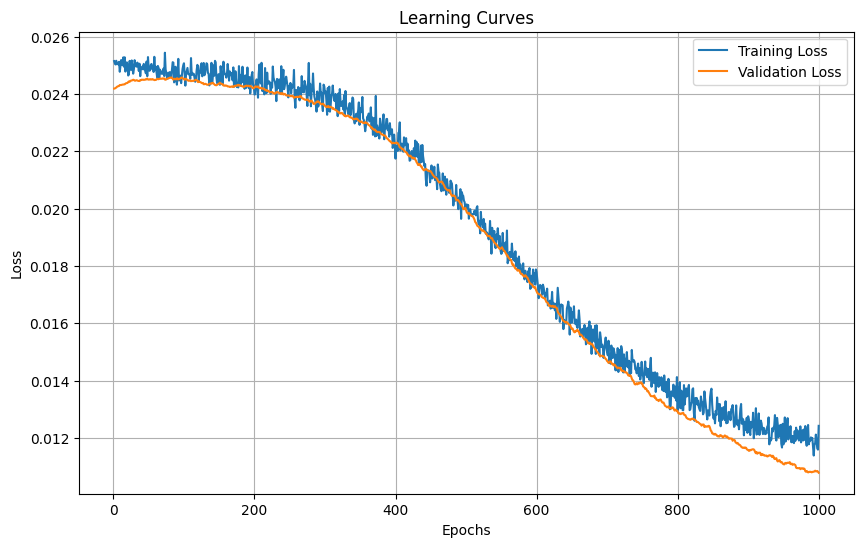

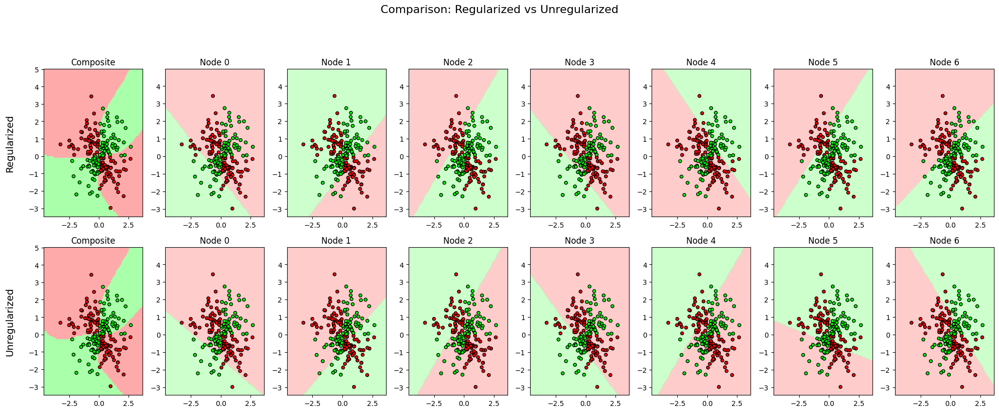


Training with k=9
Test Accuracy: 0.9200


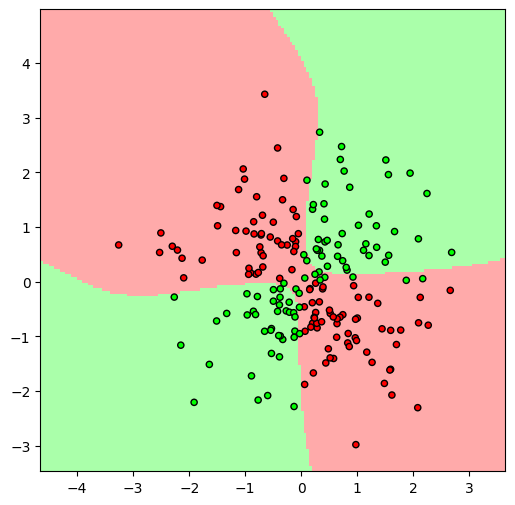

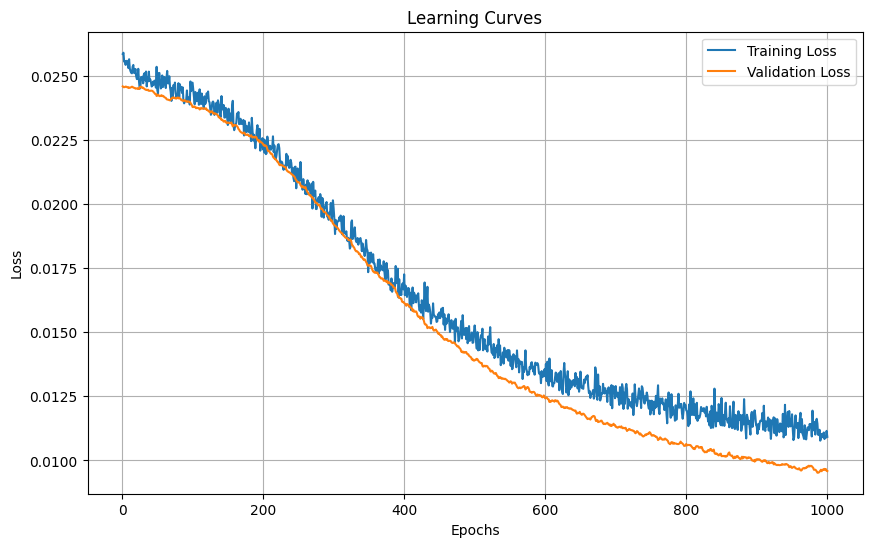

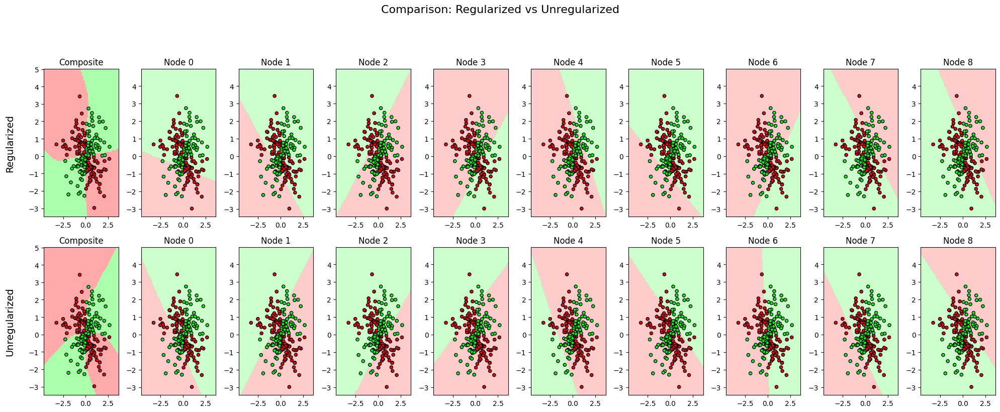

For Dataset: spiral

Training with k=2
Test Accuracy: 0.7850


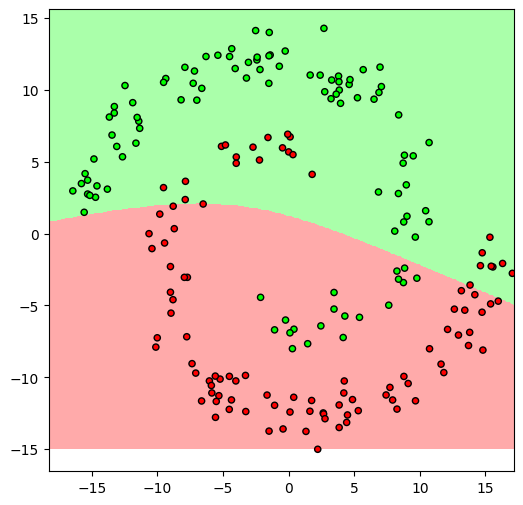

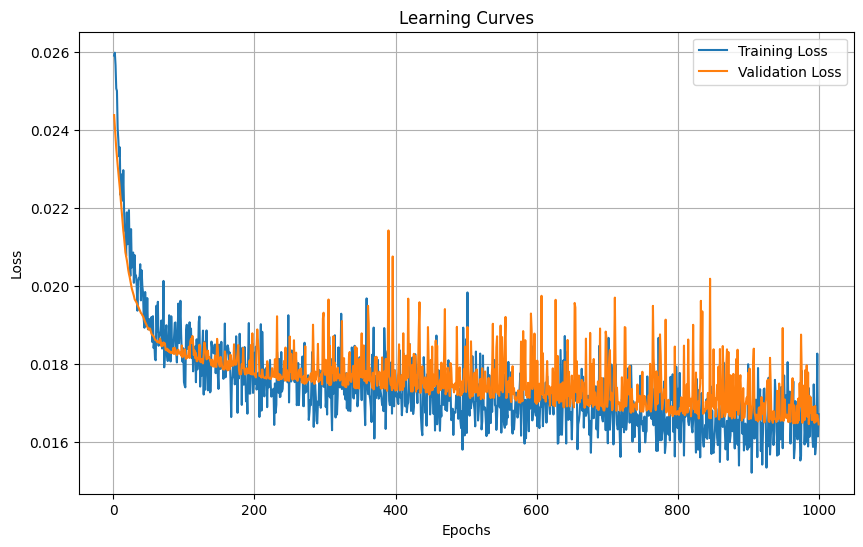

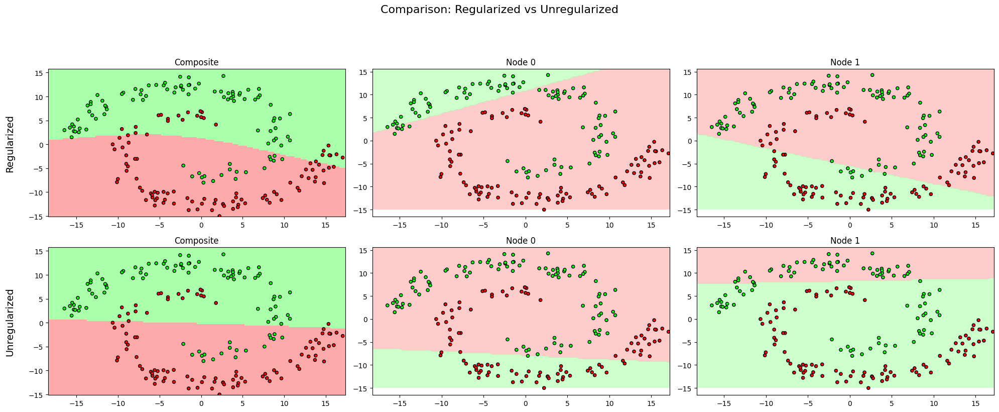


Training with k=3
Test Accuracy: 0.9250


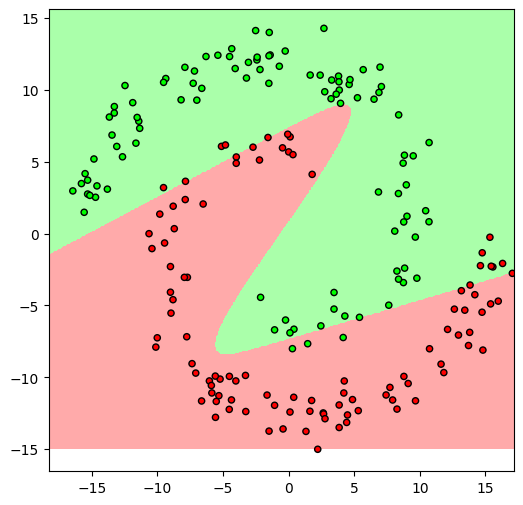

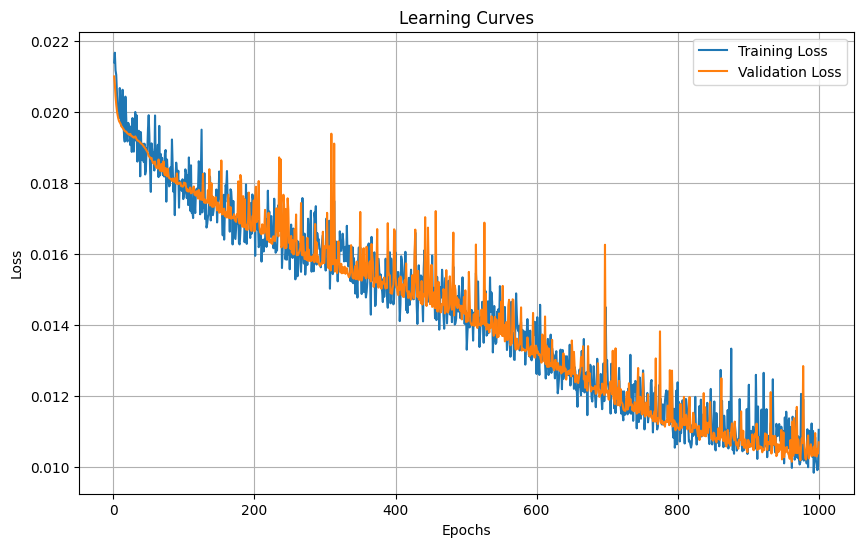

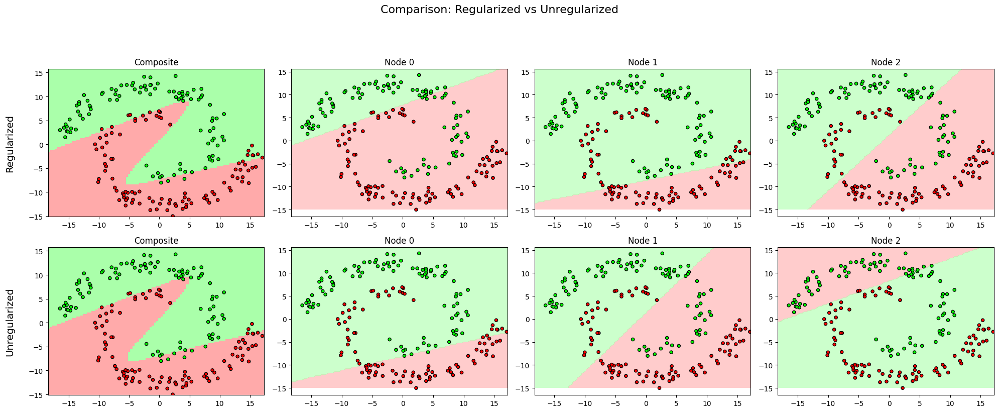


Training with k=5
Test Accuracy: 0.7650


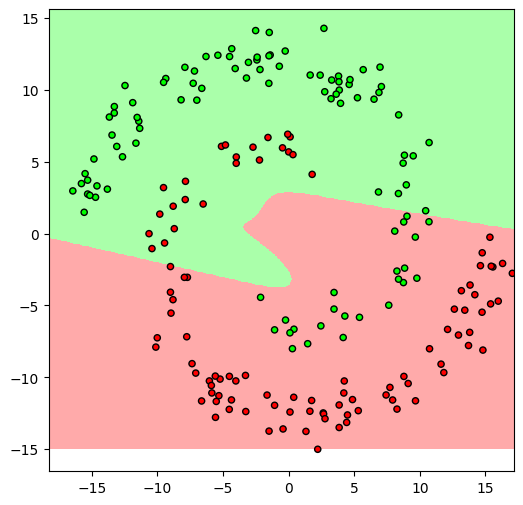

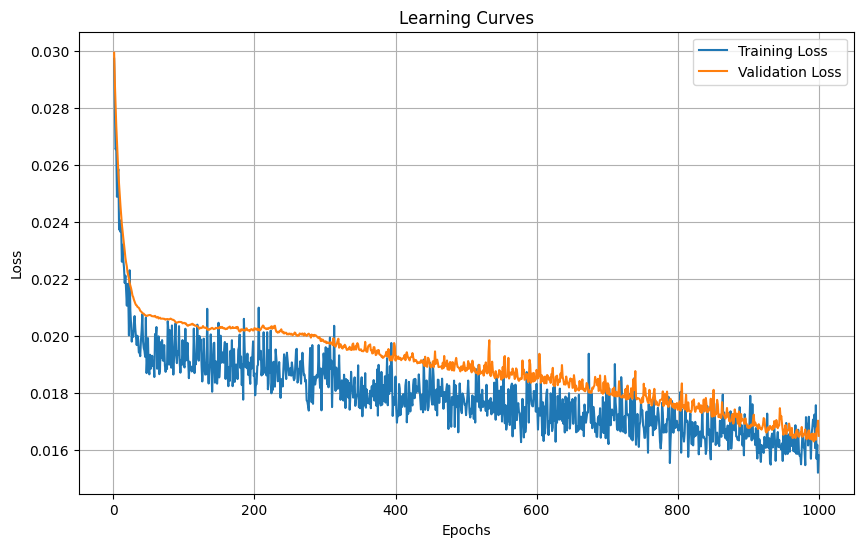

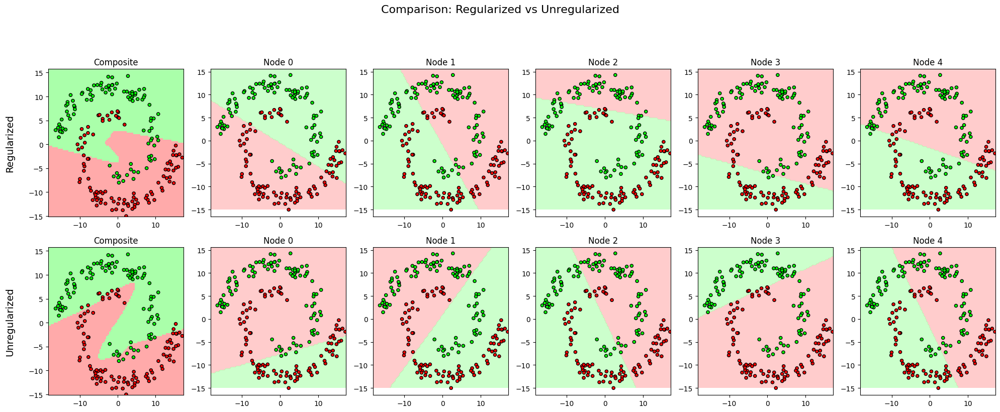


Training with k=7
Test Accuracy: 0.9750


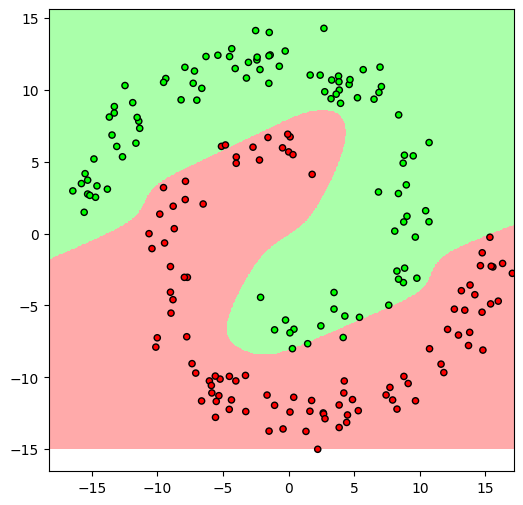

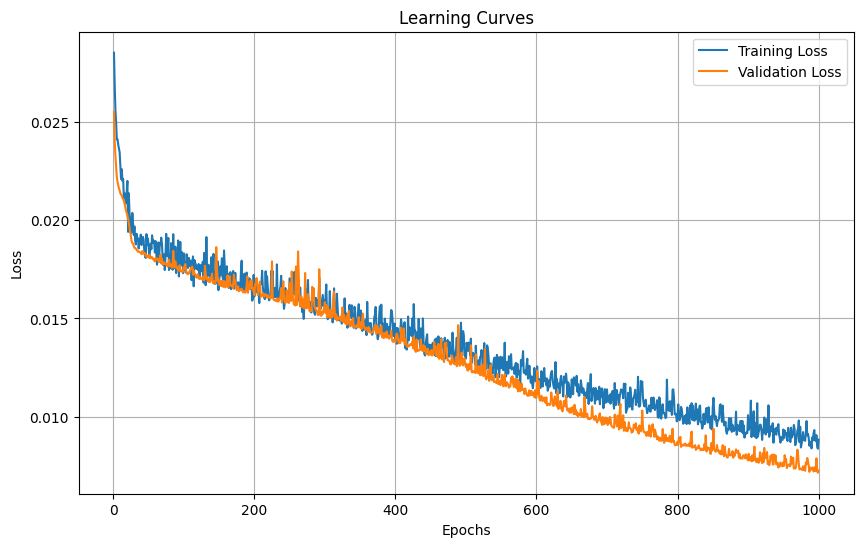

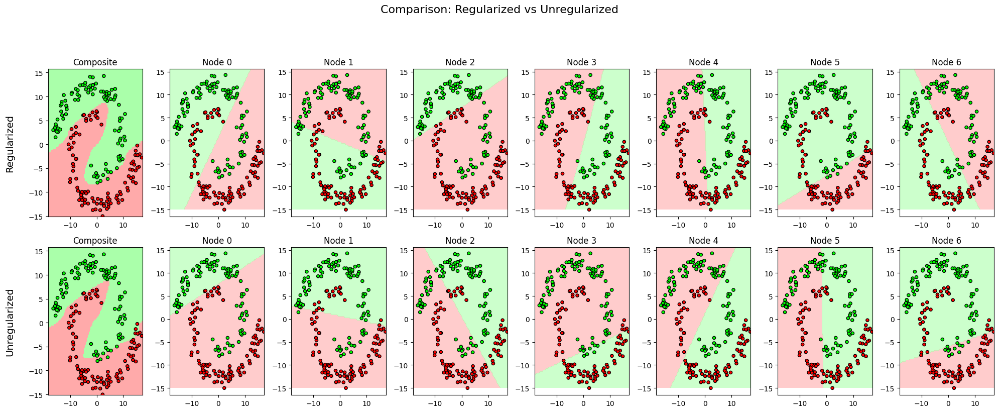


Training with k=9
Test Accuracy: 0.9850


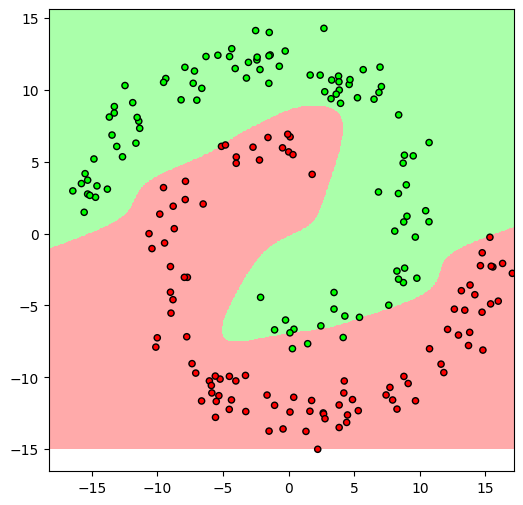

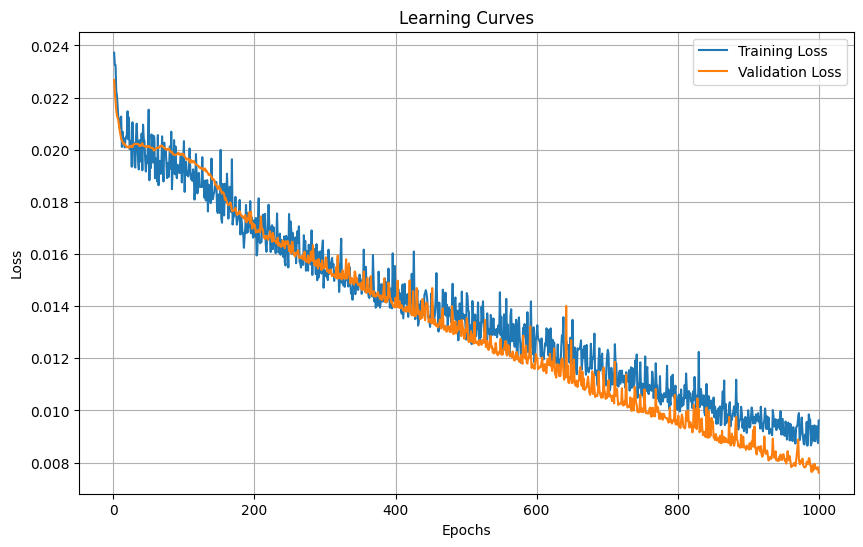

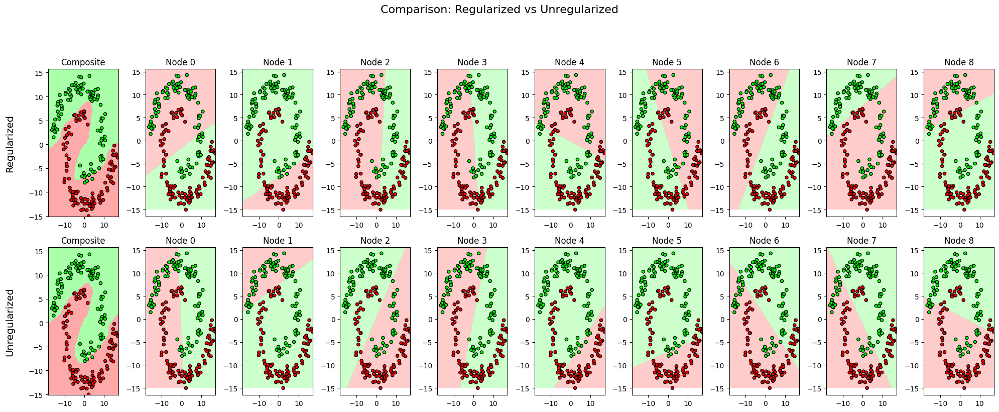

For Dataset: two_gaussians

Training with k=2
Test Accuracy: 0.9100


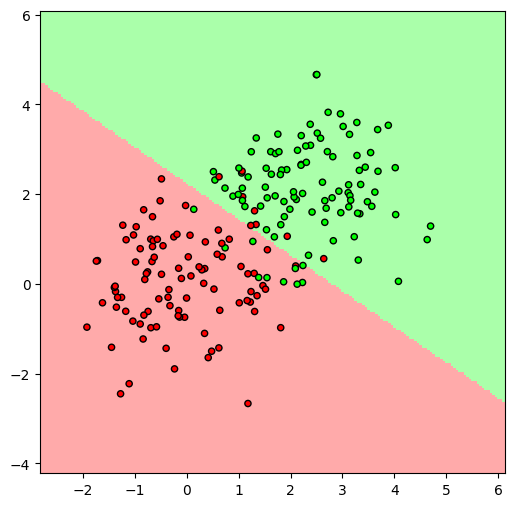

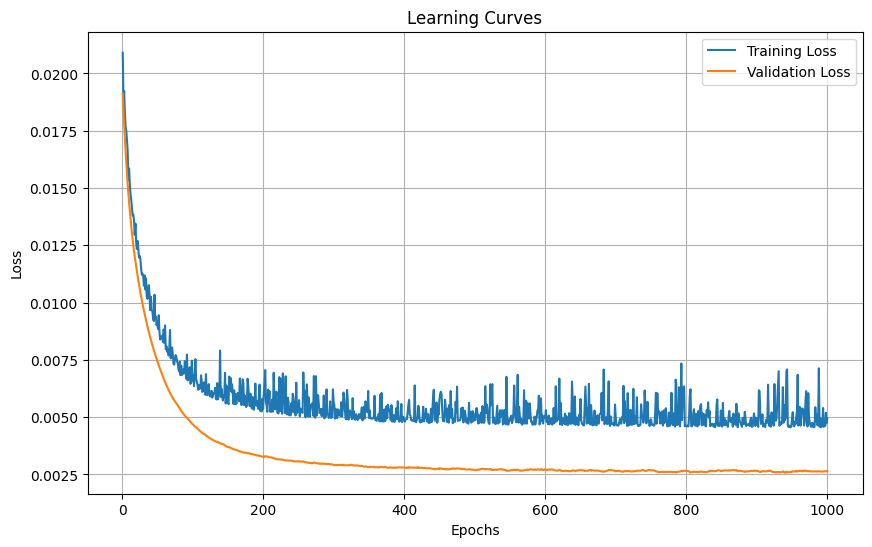

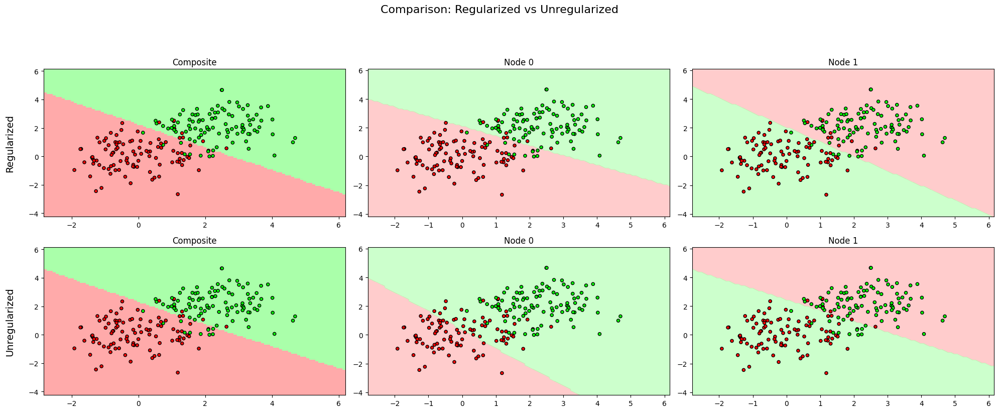


Training with k=3
Test Accuracy: 0.9100


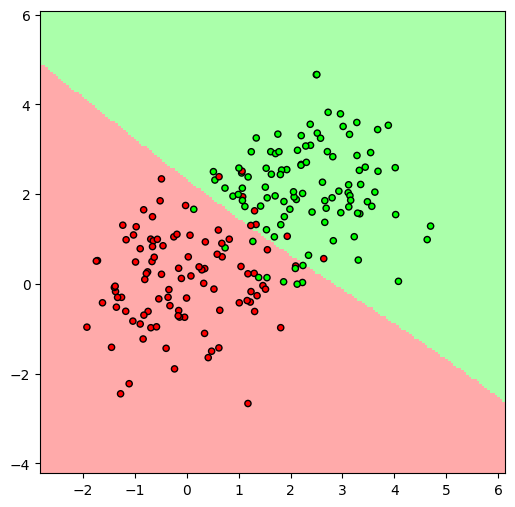

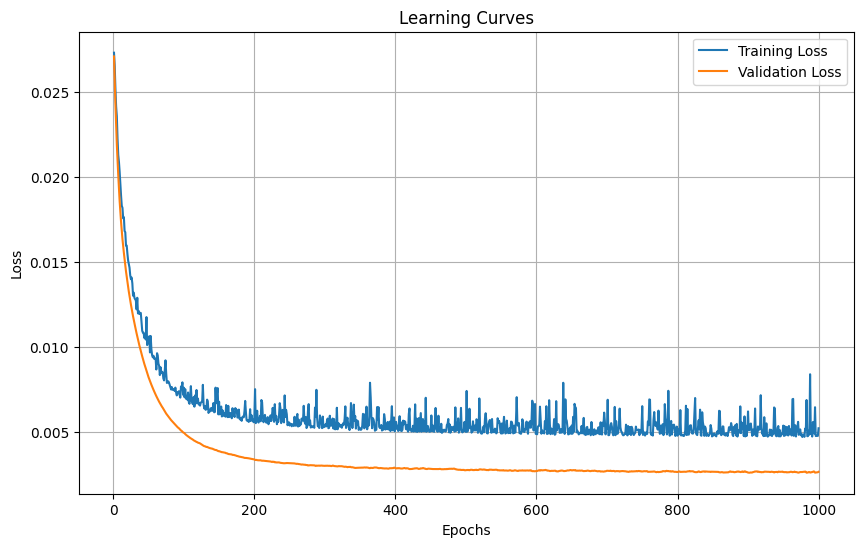

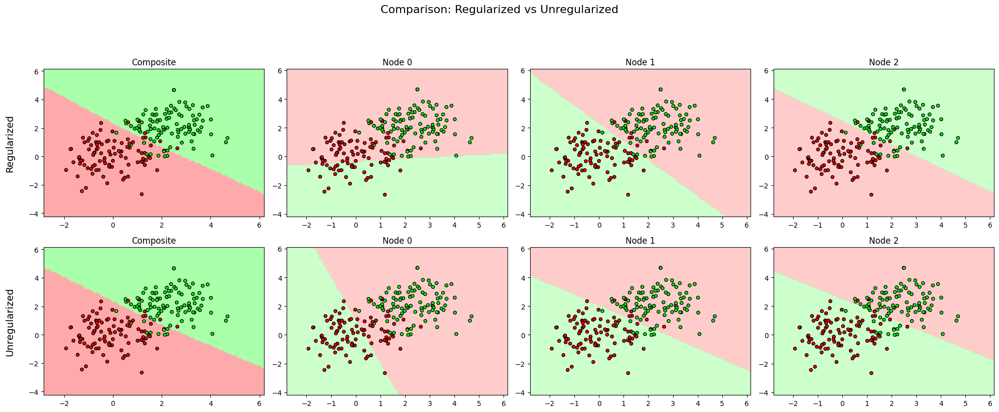


Training with k=5
Test Accuracy: 0.9100


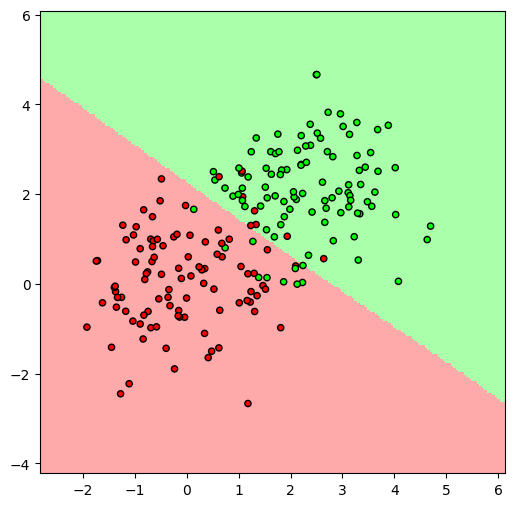

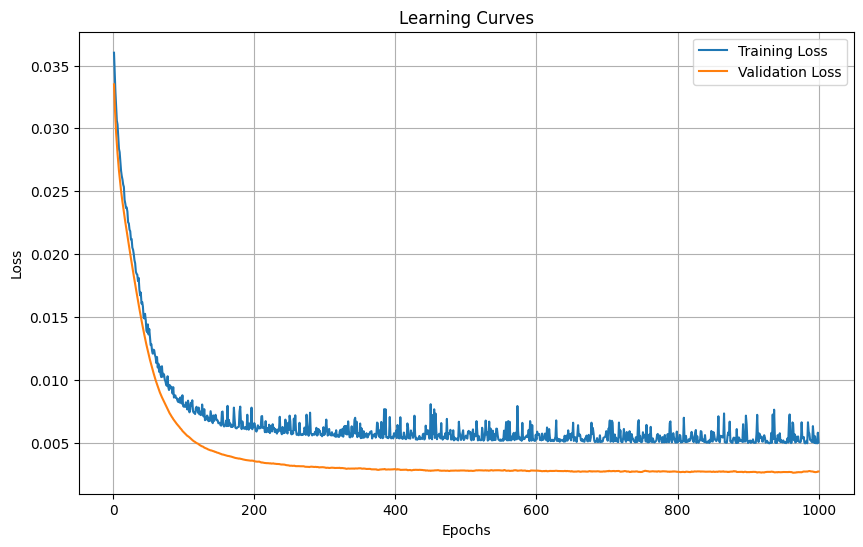

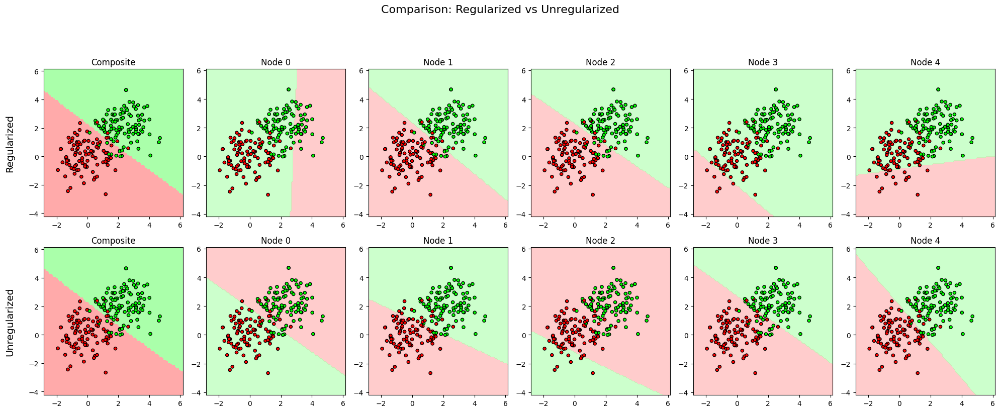


Training with k=7
Test Accuracy: 0.9150


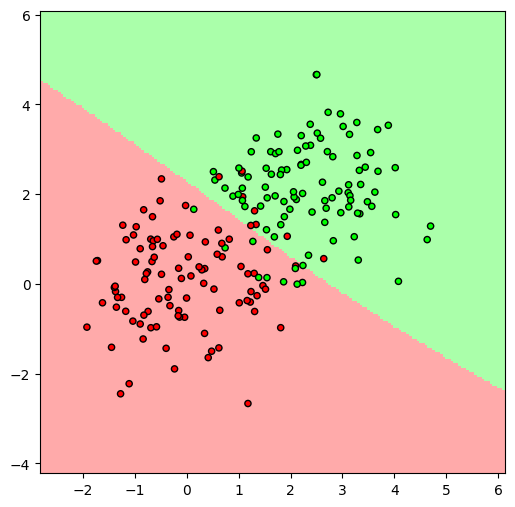

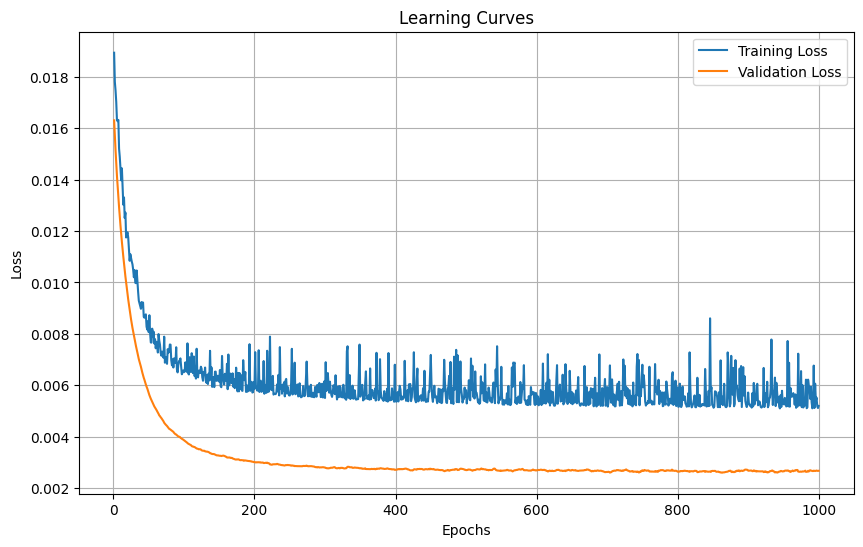

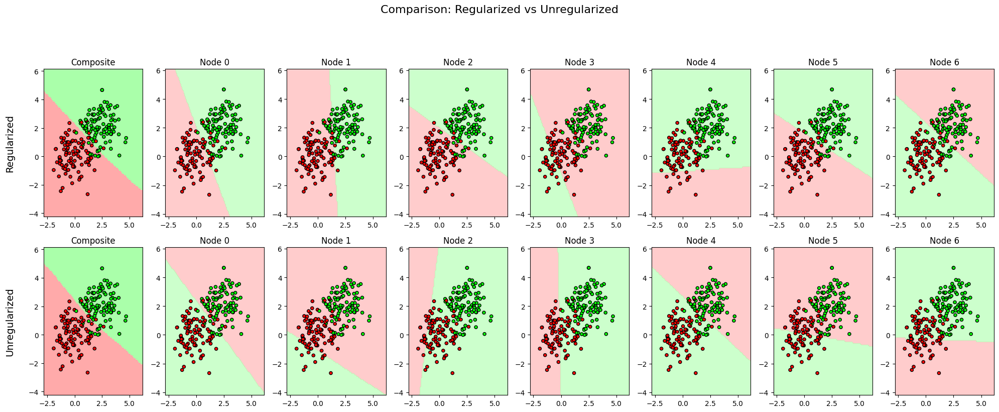


Training with k=9
Test Accuracy: 0.9100


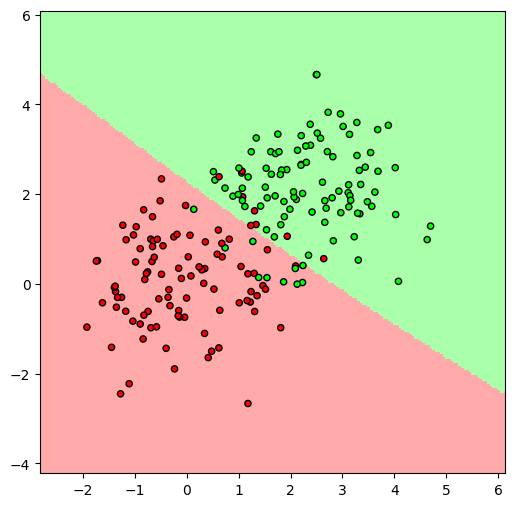

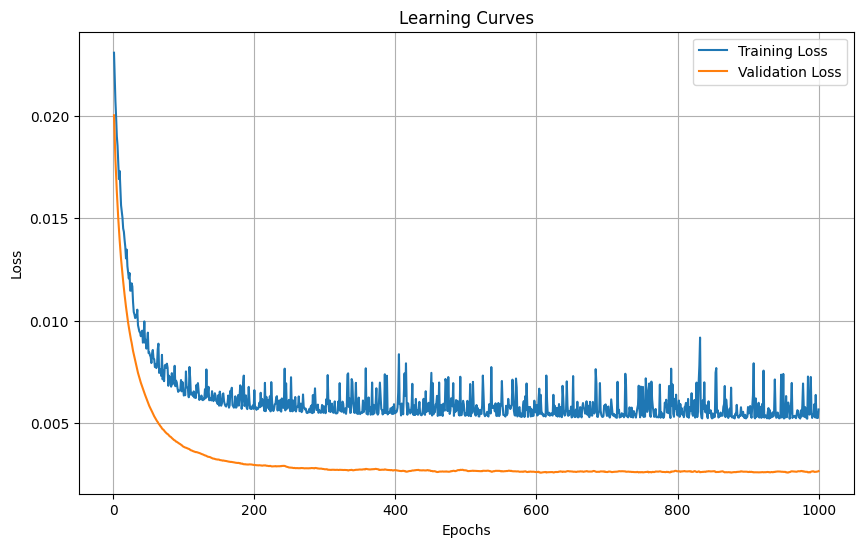

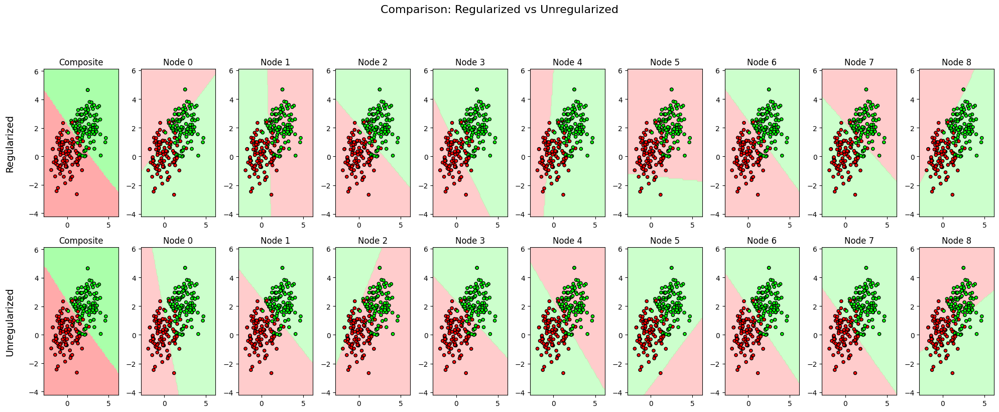

For Dataset: center_surround

Training with k=2
Test Accuracy: 0.6950


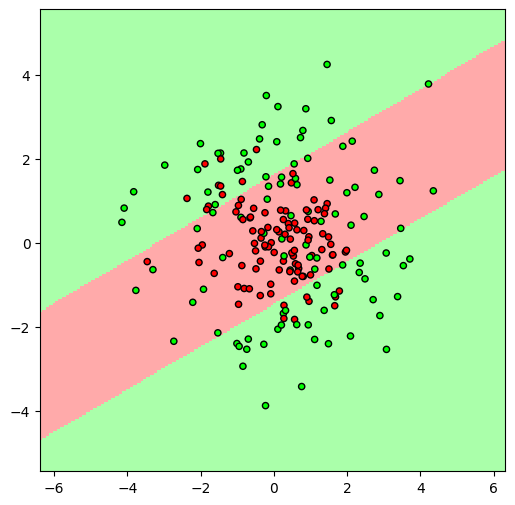

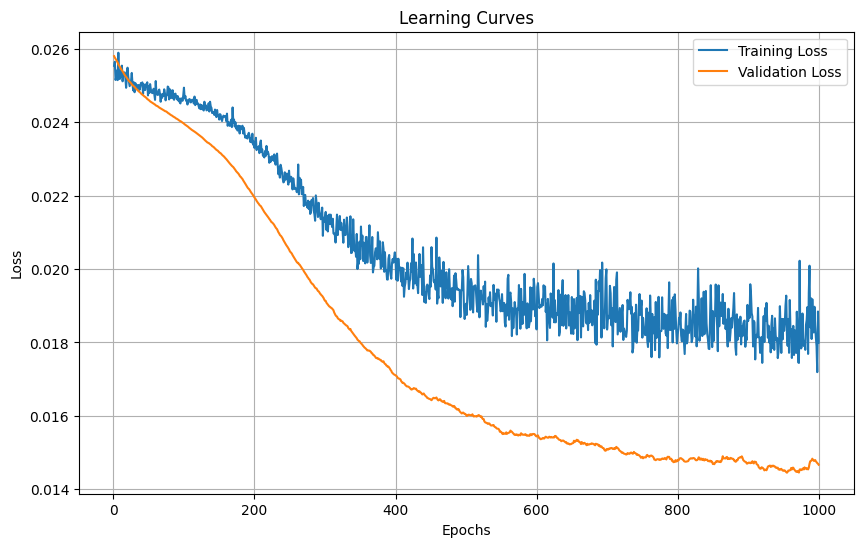

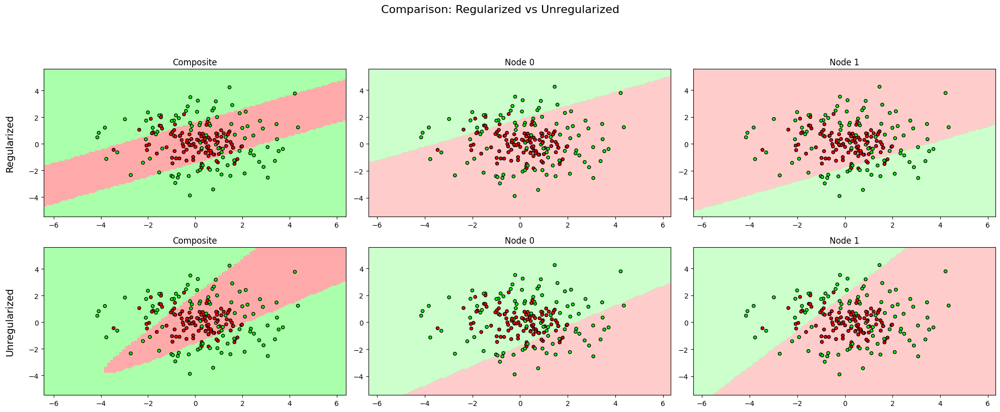


Training with k=3
Test Accuracy: 0.7500


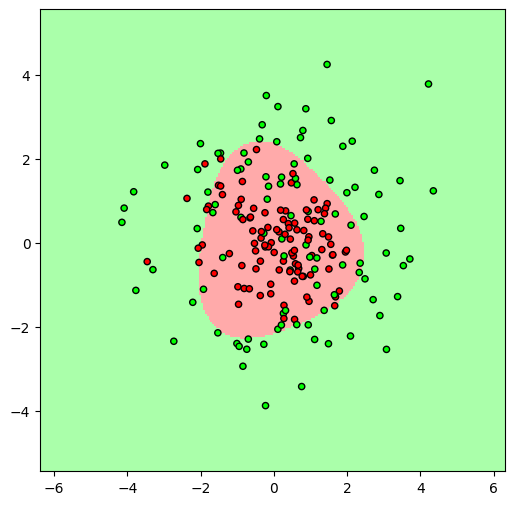

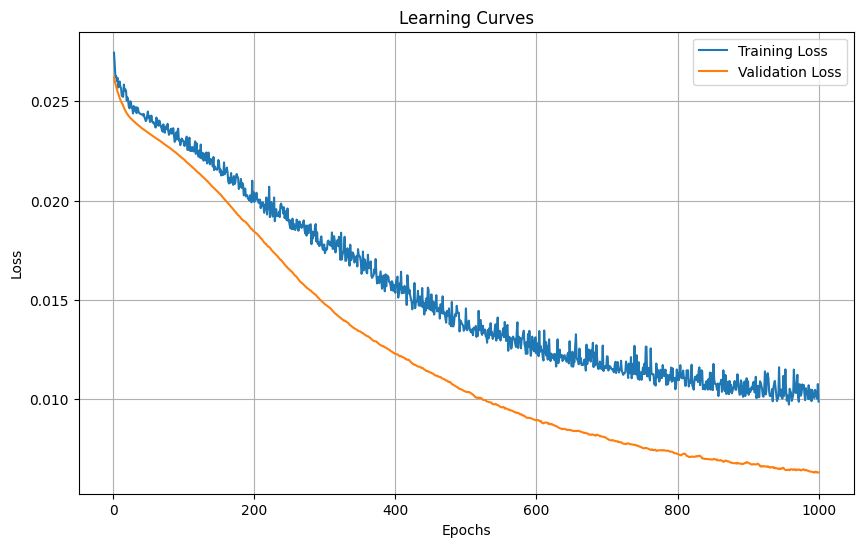

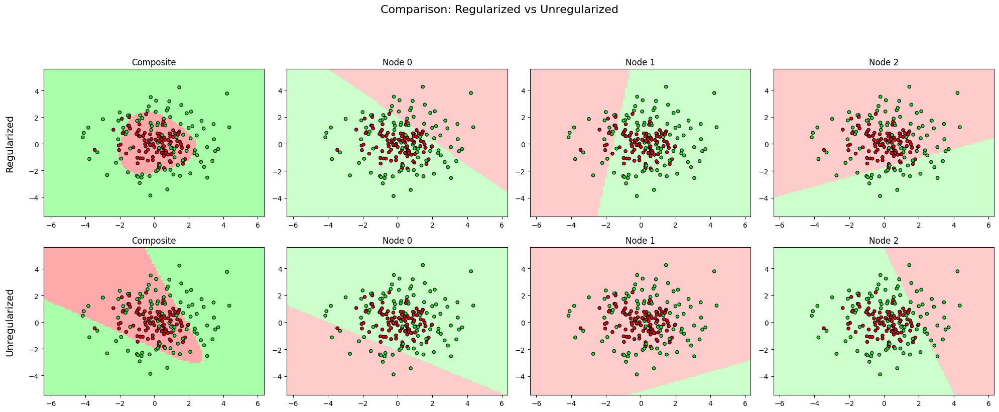


Training with k=5
Test Accuracy: 0.7750


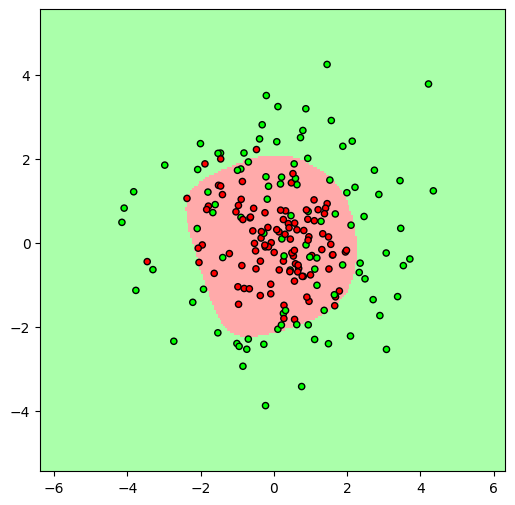

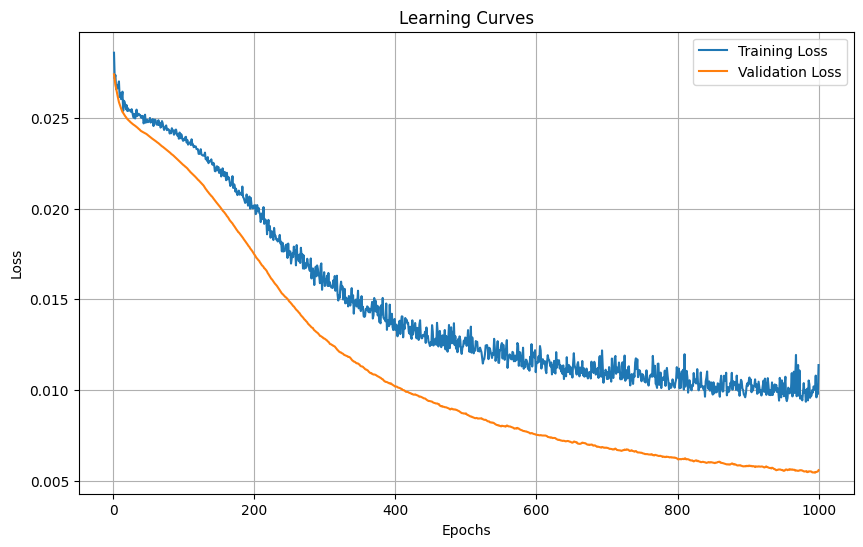

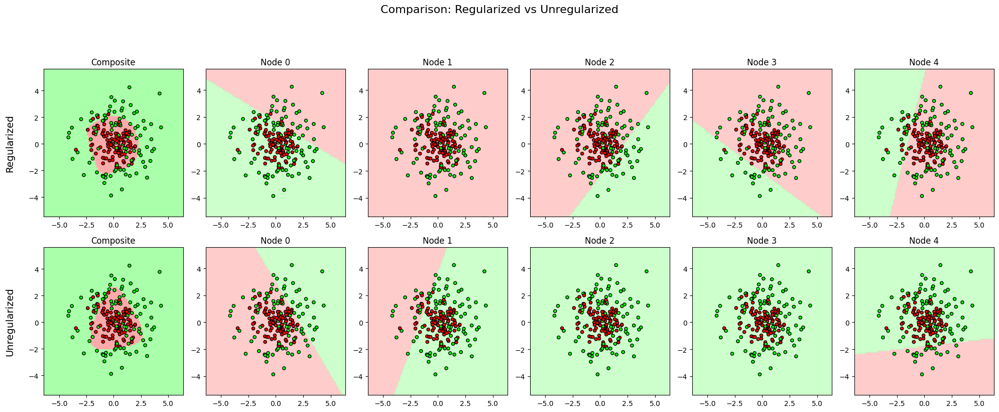


Training with k=7
Test Accuracy: 0.7500


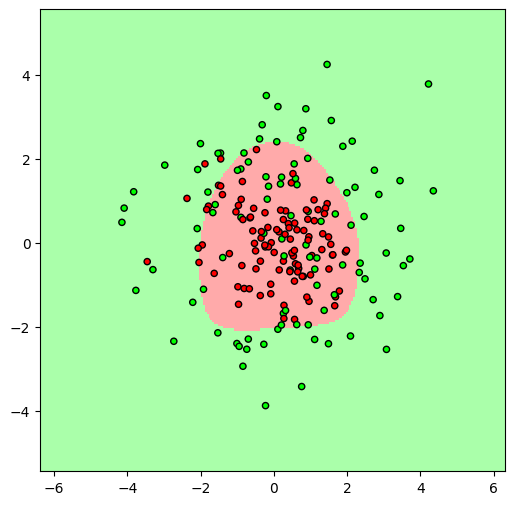

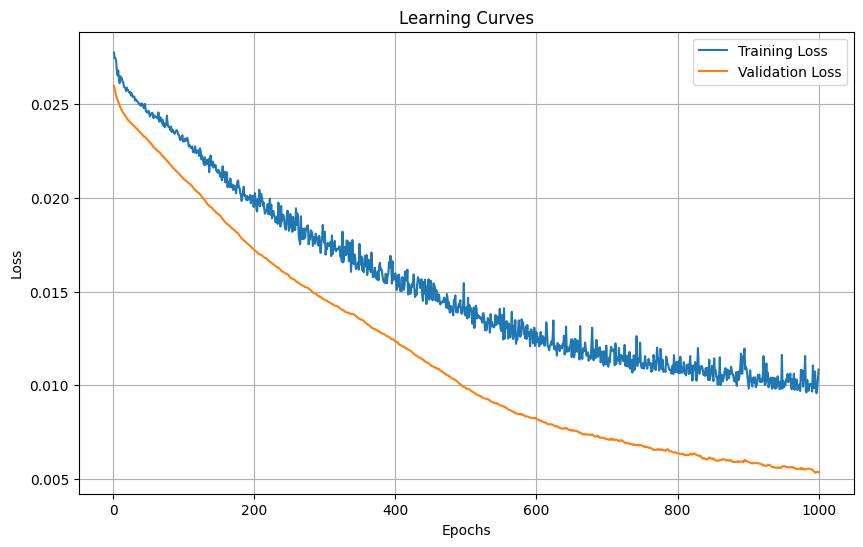

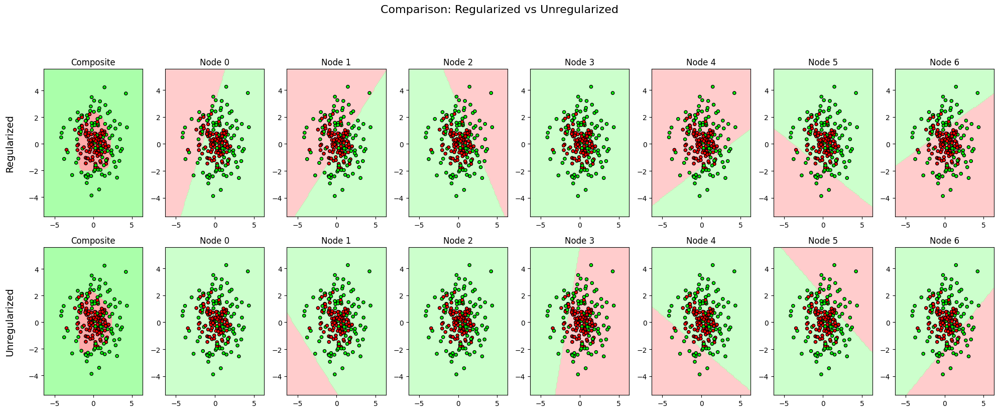


Training with k=9
Test Accuracy: 0.7550


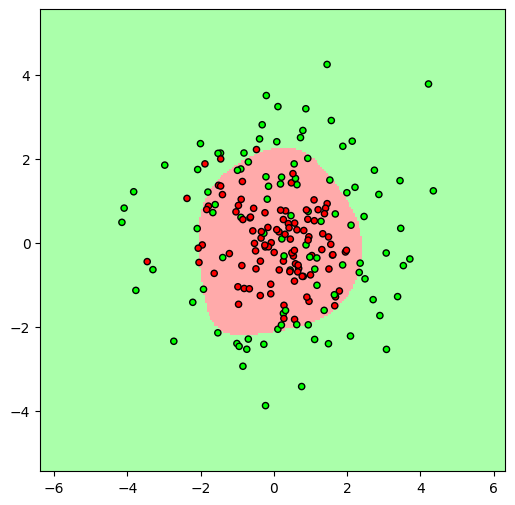

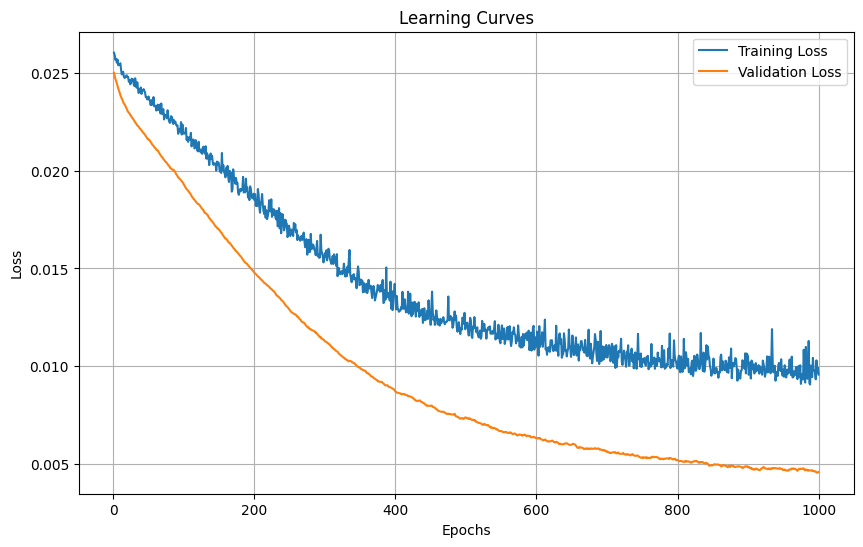

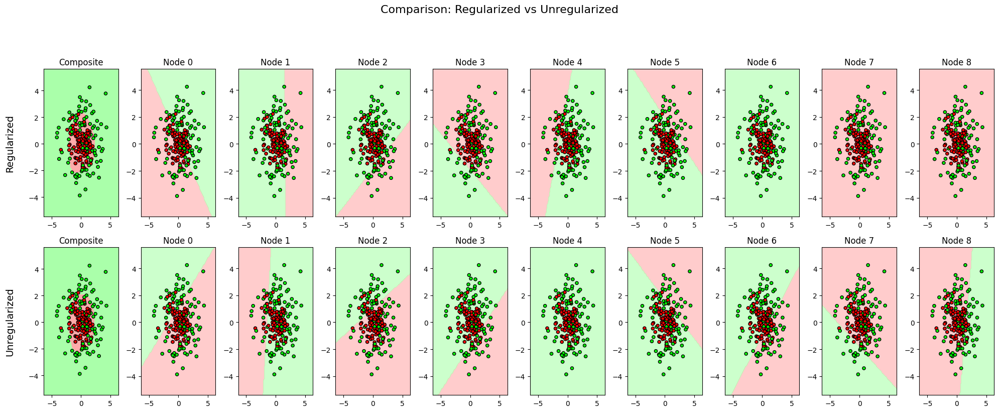

In [77]:
names = ['xor', 'spiral', 'two_gaussians', 'center_surround']
learning_rate = 0.01
epochs = 1000

for name in names:
    print(f'For Dataset: {name}')
    for k in [2,3,5,7,9]:
        print(f"\nTraining with k={k}")
        model1 = net3(input_size=3,nodes=k,output_size=2)
        model2 = net3(input_size=3,nodes=k,output_size=2)
        trained_model, train_losses, val_losses = train_model_with_regularizers(name=name, model=model1, learning_rate=learning_rate, epochs=epochs)
        orimodel, _, _ = train_model(name=name,model=model2,learning_rate=learning_rate,epochs=epochs)
        test_acc = evaluate_model(name,trained_model)
        draw_example(k,name,model=trained_model)
        plot_learning_curves(train_losses,val_losses,epochs)
        plot_comparison_regularized_unregularized(trained_model,orimodel,name)
#

- ### Thoughts on two regularizers

    - #### The two regularizers significantly impact the model's performance by improving generalization and decision boundaries. 
    - #### The first regularizer reduces overfitting by minimizing the norm of the input layer's weight matrix, leading to smoother decision surfaces. 
    - #### The second regularizer encourages orthogonality among hidden layer weights, ensuring diverse and complementary features, which enhances the model's ability to learn complex patterns effectively. Together, they create more robust and interpretable models.